In [1]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
#sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [2]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    # online predict & PnL exactly as before:
    val_states = model.predict_online(X_vl_s)
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t in range(len(val_states)):
        st = val_states.iloc[t]
        exp_ann = model.ret_[st] * 252
        # position rule:
        if exp_ann > annual_threshold: pos = 1.0
        elif exp_ann < -annual_threshold: pos = -1.0
        else: pos = exp_ann/annual_threshold
        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos-prev_pos)*cost_per_100pct
        prev_pos = pos
    sharpe = pnl.mean()/pnl.std(ddof=1)*np.sqrt(252)
    return sharpe

# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 1e-1, 1e3, log=True)
    kappa = trial.suggest_int("kappa", 1, 10)
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [3]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="cv_params_bayes.parquet",
    make_plots=True,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label="κ")
                plt.xlabel("λ (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-04-21 18:41:26,097] A new study created in memory with name: no-name-e69b3042-d5db-4c67-b3d3-a048b9b40c55
[I 2025-04-21 18:41:31,378] Trial 0 finished with value: -0.3009987290511751 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3009987290511751.
[I 2025-04-21 18:41:35,626] Trial 1 finished with value: -0.2599670013758687 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.2599670013758687.
[I 2025-04-21 18:41:41,955] Trial 2 finished with value: -0.20592895022005375 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.20592895022005375.
[I 2025-04-21 18:41:52,958] Trial 3 finished with value: -1.111567376913426 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -0.20592895022005375.
[I 2025-04-21 18:41:55,349] Trial 4 finished with value: -0.6189480101492619 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=142.3778, κ=7, Sharpe=0.1040


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


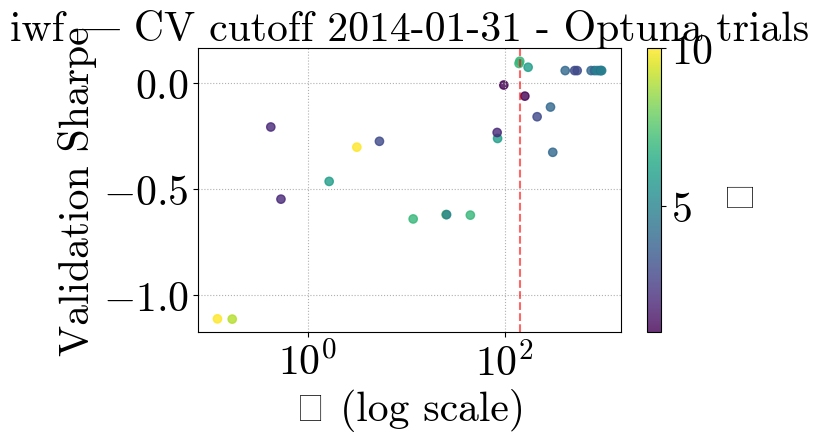

[I 2025-04-21 18:42:45,026] A new study created in memory with name: no-name-bf4b4b85-081e-4c4c-9f95-73752127aa5f
[I 2025-04-21 18:42:48,907] Trial 0 finished with value: -0.15374507353714337 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.15374507353714337.
[I 2025-04-21 18:42:51,902] Trial 1 finished with value: 0.8822885673672323 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.8822885673672323.
[I 2025-04-21 18:42:56,954] Trial 2 finished with value: -0.12408549968206622 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.8822885673672323.
[I 2025-04-21 18:43:01,493] Trial 3 finished with value: -0.08738837395444388 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.8822885673672323.
[I 2025-04-21 18:43:04,619] Trial 4 finished with value: 0.8790211200041412 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=59.5389, κ=8, Sharpe=0.9844


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


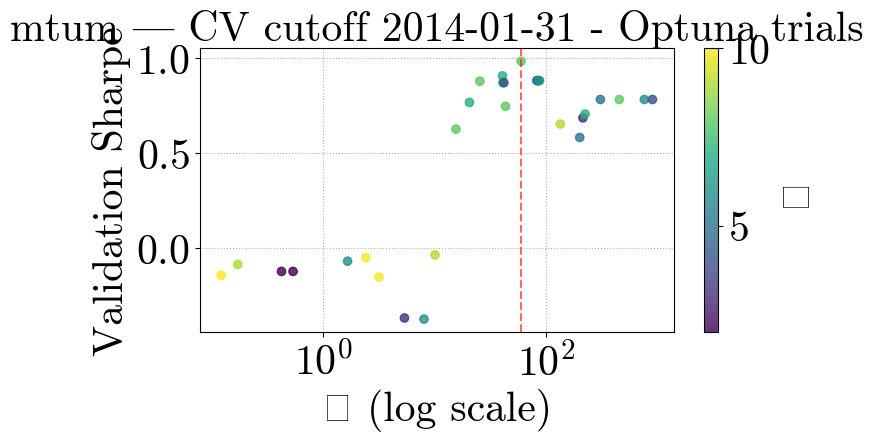

[I 2025-04-21 18:44:21,657] A new study created in memory with name: no-name-af4af35f-52d3-49c1-844f-92341820d1d0
[I 2025-04-21 18:44:26,240] Trial 0 finished with value: -0.08792696731744412 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.08792696731744412.
[I 2025-04-21 18:44:29,195] Trial 1 finished with value: -0.9101716211350035 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.08792696731744412.
[I 2025-04-21 18:44:36,364] Trial 2 finished with value: -1.1889276635378043 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.08792696731744412.
[I 2025-04-21 18:44:41,932] Trial 3 finished with value: -1.0160013267231816 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.08792696731744412.
[I 2025-04-21 18:44:46,211] Trial 4 finished with value: -0.7556063639478436 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=3.4018, κ=7, Sharpe=-0.0431


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


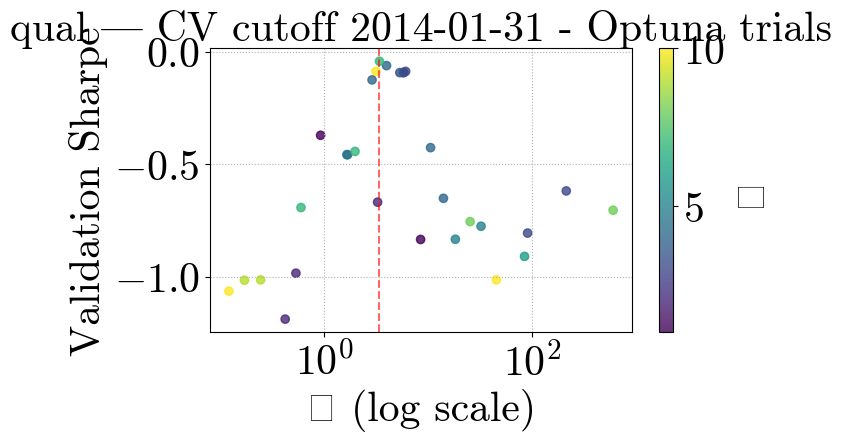

[I 2025-04-21 18:46:51,971] A new study created in memory with name: no-name-62ec255b-576f-4e9e-bafd-cf6c8235976a
[I 2025-04-21 18:46:57,321] Trial 0 finished with value: 0.04638841290634414 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.04638841290634414.
[I 2025-04-21 18:46:59,741] Trial 1 finished with value: 0.04321448804215745 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.04638841290634414.
[I 2025-04-21 18:47:13,370] Trial 2 finished with value: 0.09566130983688192 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.09566130983688192.
[I 2025-04-21 18:47:21,127] Trial 3 finished with value: 0.023038038032085408 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.09566130983688192.
[I 2025-04-21 18:47:25,689] Trial 4 finished with value: -0.050991266595772036 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best 

Optuna best λ=0.5337, κ=2, Sharpe=0.1428


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


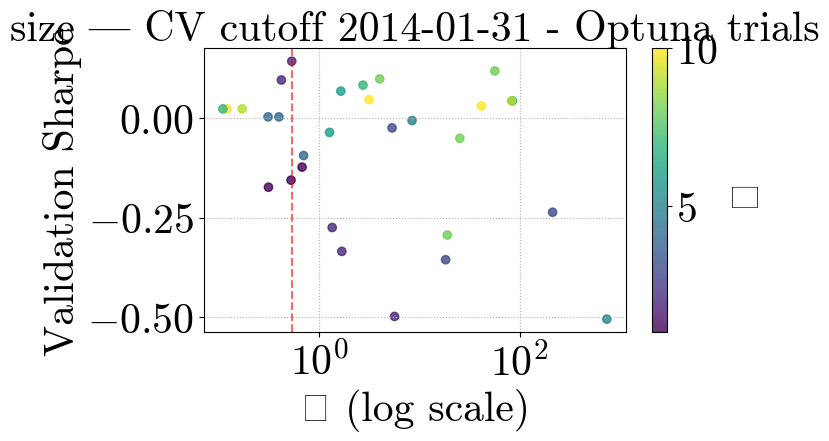

[I 2025-04-21 18:50:11,973] A new study created in memory with name: no-name-a1f448c8-b9e1-4b0b-8c5c-ceddd93a5bc8
[I 2025-04-21 18:50:17,100] Trial 0 finished with value: -0.2366673701245879 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2366673701245879.
[I 2025-04-21 18:50:20,245] Trial 1 finished with value: -0.37247559649900863 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.2366673701245879.
[I 2025-04-21 18:50:28,181] Trial 2 finished with value: -0.2412736700878782 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.2366673701245879.
[I 2025-04-21 18:50:35,504] Trial 3 finished with value: -0.48006688929385666 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.2366673701245879.
[I 2025-04-21 18:50:39,554] Trial 4 finished with value: 0.06462254756862472 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=31.5934, κ=8, Sharpe=0.1455


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


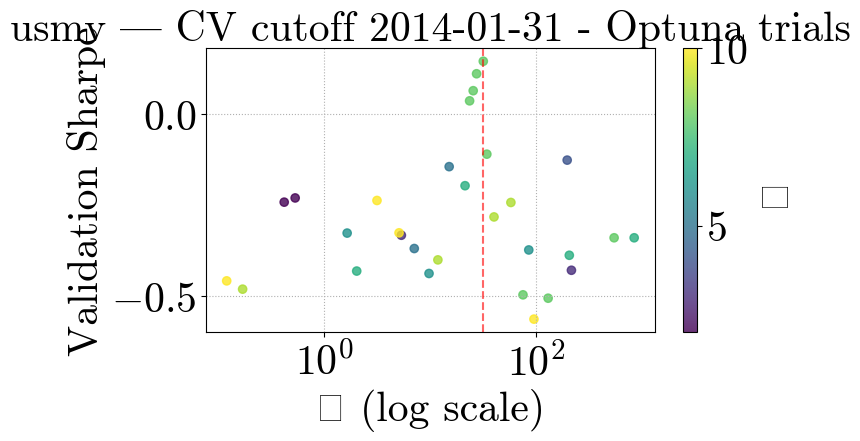

[I 2025-04-21 18:52:58,553] A new study created in memory with name: no-name-4ee54787-a01b-4f8e-b007-91412c5c07b1
[I 2025-04-21 18:53:05,456] Trial 0 finished with value: 0.6844427070048071 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.6844427070048071.
[I 2025-04-21 18:53:09,302] Trial 1 finished with value: 0.42304890379627763 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.6844427070048071.
[I 2025-04-21 18:53:25,522] Trial 2 finished with value: -0.07924303334776459 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.6844427070048071.
[I 2025-04-21 18:53:34,655] Trial 3 finished with value: 0.26977869814636246 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.6844427070048071.
[I 2025-04-21 18:53:37,952] Trial 4 finished with value: 0.5237259171452072 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=170.7120, κ=9, Sharpe=0.7840


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


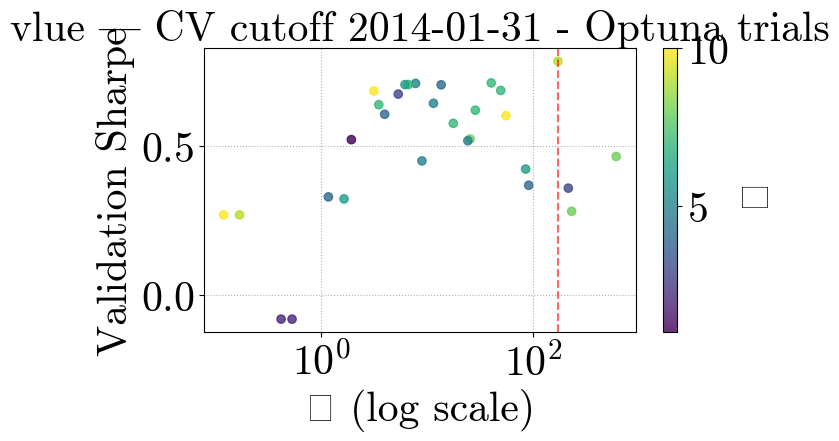

[I 2025-04-21 18:55:38,878] A new study created in memory with name: no-name-c8b49e72-4e10-44ad-a3f9-300fe4ce5759
[I 2025-04-21 18:55:43,680] Trial 0 finished with value: -0.3676619322667202 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3676619322667202.
[I 2025-04-21 18:55:49,435] Trial 1 finished with value: -0.3729755592375541 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.3676619322667202.
[I 2025-04-21 18:55:56,315] Trial 2 finished with value: -1.032367568693785 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.3676619322667202.
[I 2025-04-21 18:56:03,082] Trial 3 finished with value: -0.9347604286177462 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.3676619322667202.
[I 2025-04-21 18:56:07,014] Trial 4 finished with value: -0.5122253706872073 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=95.2015, κ=1, Sharpe=0.0767


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


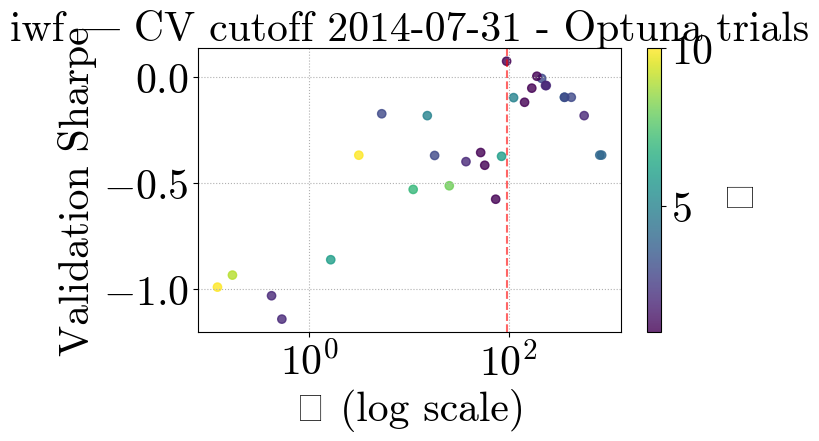

[I 2025-04-21 18:57:38,800] A new study created in memory with name: no-name-3d317c34-e210-4814-8a88-048a33590e2b
[I 2025-04-21 18:57:42,990] Trial 0 finished with value: -0.5741021001843275 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5741021001843275.
[I 2025-04-21 18:57:47,519] Trial 1 finished with value: 0.3856291172770763 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3856291172770763.
[I 2025-04-21 18:57:53,784] Trial 2 finished with value: -0.5124837508050426 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3856291172770763.
[I 2025-04-21 18:57:58,443] Trial 3 finished with value: -0.3691076135421238 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3856291172770763.
[I 2025-04-21 18:58:03,257] Trial 4 finished with value: 0.2780372216863284 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=760.6194, κ=6, Sharpe=0.4641


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


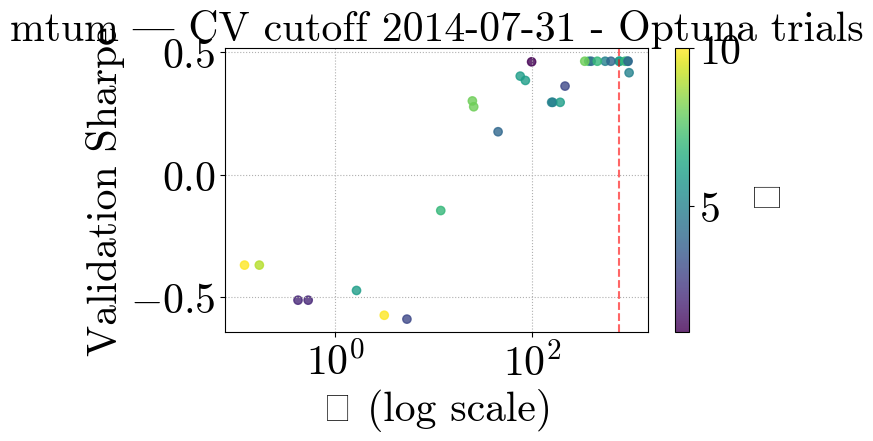

[I 2025-04-21 18:59:24,840] A new study created in memory with name: no-name-7412b312-f1ea-4177-8c96-35fe4956a0e4
[I 2025-04-21 18:59:30,313] Trial 0 finished with value: -0.15286674572702427 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.15286674572702427.
[I 2025-04-21 18:59:33,956] Trial 1 finished with value: -0.19183864504789833 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.15286674572702427.
[I 2025-04-21 18:59:42,806] Trial 2 finished with value: -0.8645107253175964 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.15286674572702427.
[I 2025-04-21 18:59:48,169] Trial 3 finished with value: -0.9668730708197817 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.15286674572702427.
[I 2025-04-21 18:59:52,405] Trial 4 finished with value: -0.5396929667683396 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Be

Optuna best λ=253.5294, κ=3, Sharpe=0.2339


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


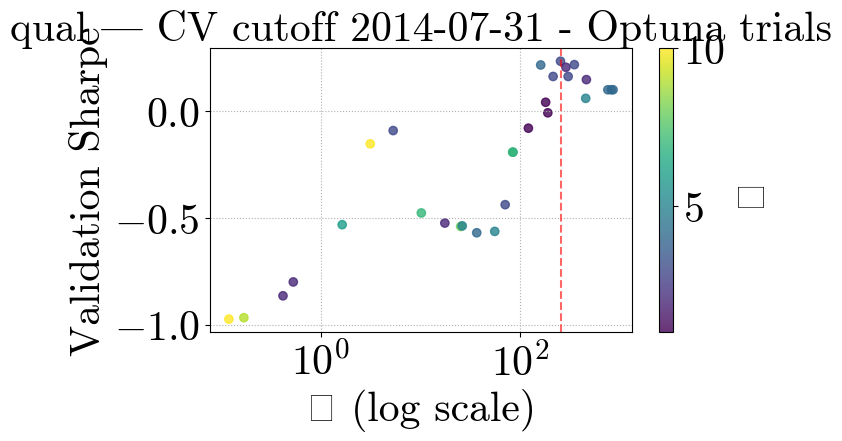

[I 2025-04-21 19:01:26,152] A new study created in memory with name: no-name-62201487-7ec4-4ad9-bf84-097147341268
[I 2025-04-21 19:01:31,988] Trial 0 finished with value: 0.09533369816590662 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.09533369816590662.
[I 2025-04-21 19:01:37,870] Trial 1 finished with value: 0.043203475900951194 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.09533369816590662.
[I 2025-04-21 19:01:53,553] Trial 2 finished with value: 0.28954983951079044 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.28954983951079044.
[I 2025-04-21 19:02:04,120] Trial 3 finished with value: 0.09722364114263332 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.28954983951079044.
[I 2025-04-21 19:02:08,418] Trial 4 finished with value: 0.022181481193164924 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=0.2641, κ=2, Sharpe=0.3748


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


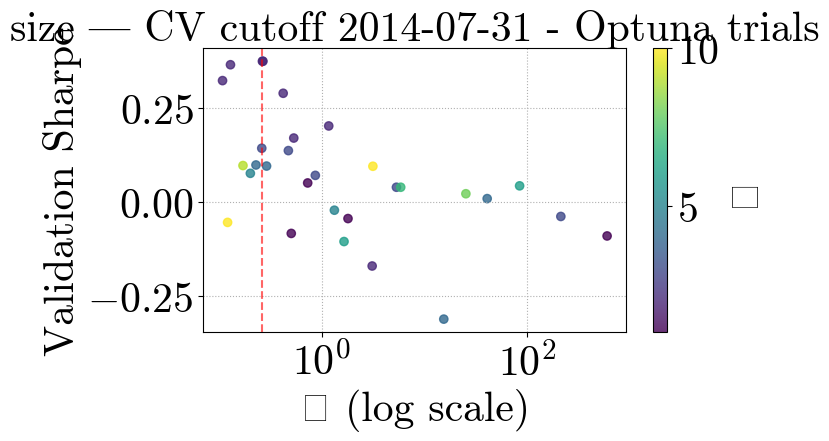

[I 2025-04-21 19:05:58,266] A new study created in memory with name: no-name-86c24b59-5659-4820-a280-4958a374fa4e
[I 2025-04-21 19:06:04,171] Trial 0 finished with value: -0.21212763966189854 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.21212763966189854.
[I 2025-04-21 19:06:06,967] Trial 1 finished with value: 0.0464365508487695 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.0464365508487695.
[I 2025-04-21 19:06:15,391] Trial 2 finished with value: -0.21157424295172486 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.0464365508487695.
[I 2025-04-21 19:06:22,424] Trial 3 finished with value: -0.37073533157017247 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.0464365508487695.
[I 2025-04-21 19:06:28,297] Trial 4 finished with value: 0.3120011541701704 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=210.2299, κ=1, Sharpe=0.6700


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


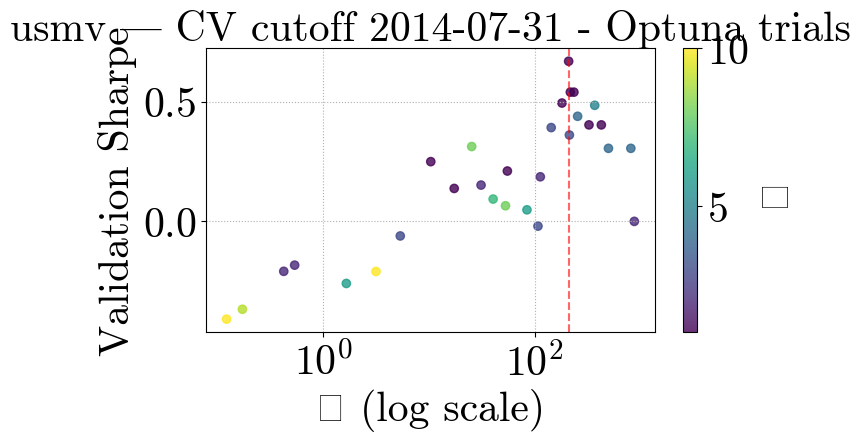

[I 2025-04-21 19:07:56,898] A new study created in memory with name: no-name-8e062936-5925-4847-86d6-fb83f017abad
[I 2025-04-21 19:08:04,055] Trial 0 finished with value: 0.989765083197897 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.989765083197897.
[I 2025-04-21 19:08:06,454] Trial 1 finished with value: 0.5135629899829779 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.989765083197897.
[I 2025-04-21 19:08:21,146] Trial 2 finished with value: 0.4477673546167181 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.989765083197897.
[I 2025-04-21 19:08:28,051] Trial 3 finished with value: 0.7754264026781909 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.989765083197897.
[I 2025-04-21 19:08:32,406] Trial 4 finished with value: 0.846215815572523 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 with va

Optuna best λ=932.3619, κ=4, Sharpe=1.4491


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


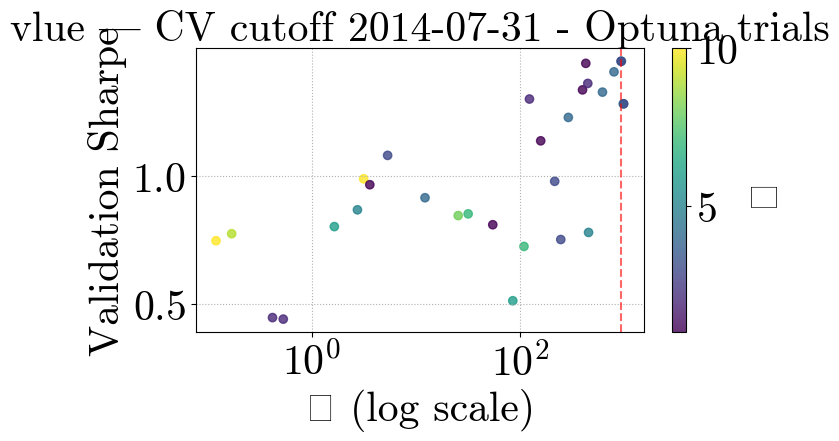

[I 2025-04-21 19:09:54,348] A new study created in memory with name: no-name-8107ed0c-0f60-40c1-9c25-0a54dd9b4a44
[I 2025-04-21 19:09:59,594] Trial 0 finished with value: -0.5137673580177228 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5137673580177228.
[I 2025-04-21 19:10:03,858] Trial 1 finished with value: -0.9787615166960323 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.5137673580177228.
[I 2025-04-21 19:10:11,898] Trial 2 finished with value: -0.2775625884165917 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.2775625884165917.
[I 2025-04-21 19:10:21,774] Trial 3 finished with value: -0.4371025693768018 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -0.2775625884165917.
[I 2025-04-21 19:10:25,555] Trial 4 finished with value: -0.6705284254741725 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=755.3504, κ=4, Sharpe=0.6035


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


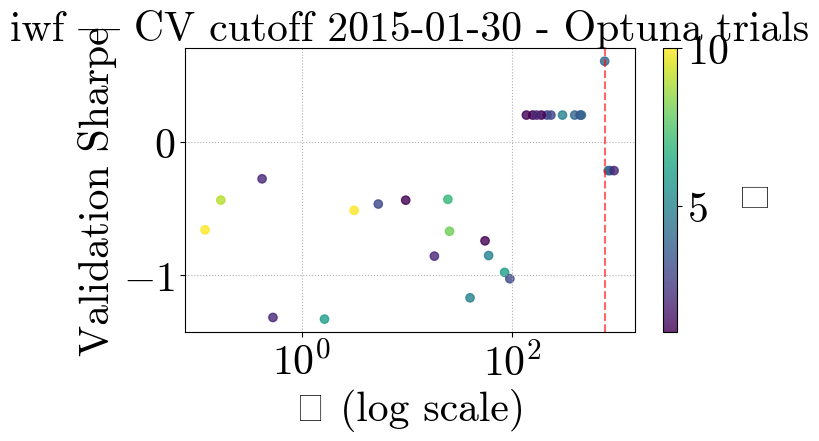

[I 2025-04-21 19:11:37,217] A new study created in memory with name: no-name-20ae0d32-da47-4830-b4f0-6e3047728961
[I 2025-04-21 19:11:42,220] Trial 0 finished with value: -0.05674740277092622 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.05674740277092622.
[I 2025-04-21 19:11:44,656] Trial 1 finished with value: 1.0152491590926487 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.0152491590926487.
[I 2025-04-21 19:11:49,658] Trial 2 finished with value: -0.20897920013879703 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.0152491590926487.
[I 2025-04-21 19:11:54,768] Trial 3 finished with value: -0.33114741997132147 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.0152491590926487.
[I 2025-04-21 19:11:59,393] Trial 4 finished with value: 0.485529722914814 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=84.7180, κ=6, Sharpe=1.0152


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


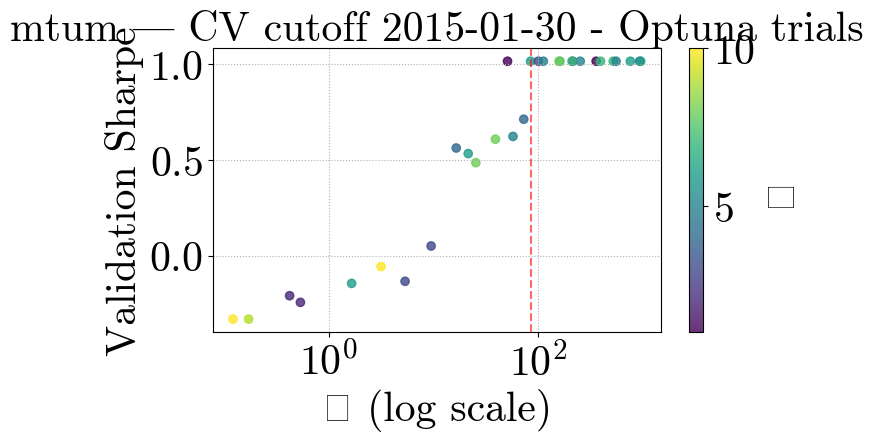

[I 2025-04-21 19:13:22,825] A new study created in memory with name: no-name-8b9df561-ce68-41f7-b41c-edd4470d36bd
[I 2025-04-21 19:13:28,283] Trial 0 finished with value: -0.34573002234632183 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.34573002234632183.
[I 2025-04-21 19:13:31,574] Trial 1 finished with value: -0.8311056446207721 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.34573002234632183.
[I 2025-04-21 19:13:42,674] Trial 2 finished with value: -0.8236154743650995 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.34573002234632183.
[I 2025-04-21 19:13:48,226] Trial 3 finished with value: -1.0454297136904307 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.34573002234632183.
[I 2025-04-21 19:13:53,708] Trial 4 finished with value: -0.9233082841913572 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=816.5528, κ=4, Sharpe=0.5951


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


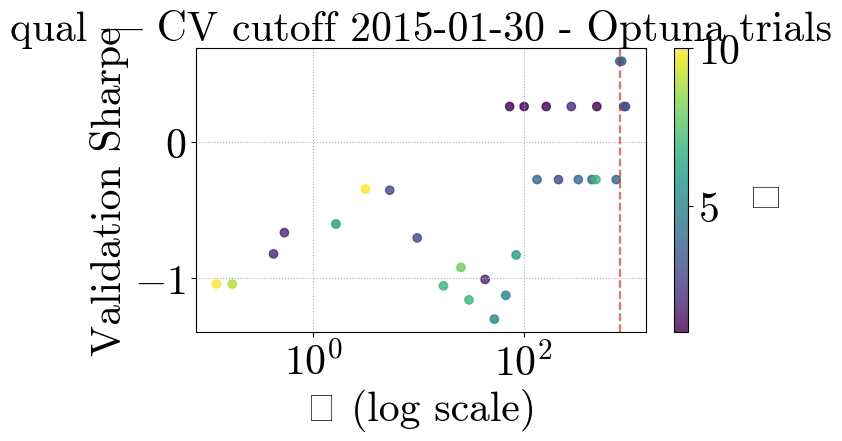

[I 2025-04-21 19:15:26,059] A new study created in memory with name: no-name-41c52405-333c-4fe8-adf0-9eed09e12152
[I 2025-04-21 19:15:33,807] Trial 0 finished with value: 0.1077967148243907 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.1077967148243907.
[I 2025-04-21 19:15:36,243] Trial 1 finished with value: -0.2623667562048796 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.1077967148243907.
[I 2025-04-21 19:15:49,103] Trial 2 finished with value: 0.2785834783853642 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.2785834783853642.
[I 2025-04-21 19:15:53,495] Trial 3 finished with value: 0.0356558009427115 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.2785834783853642.
[I 2025-04-21 19:15:56,821] Trial 4 finished with value: -0.0774384671544222 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 2

Optuna best λ=0.2641, κ=2, Sharpe=0.3815


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


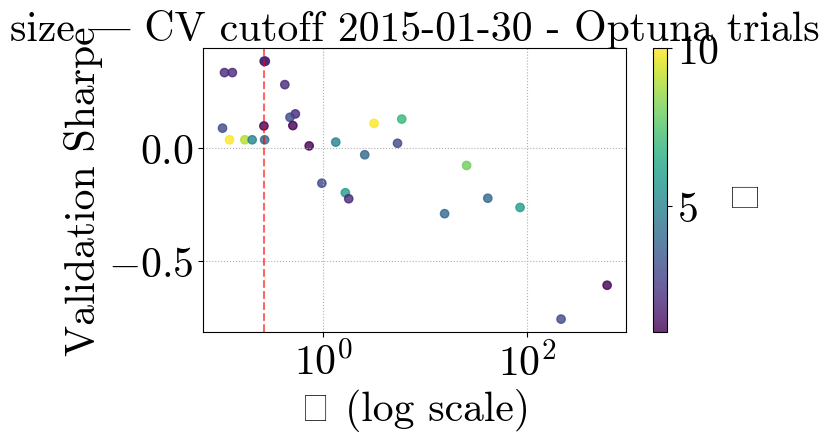

[I 2025-04-21 19:19:41,761] A new study created in memory with name: no-name-ee95f0a8-aca6-4be5-9964-c85d0eeee3ec
[I 2025-04-21 19:19:47,501] Trial 0 finished with value: 0.1803418441845184 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.1803418441845184.
[I 2025-04-21 19:19:51,732] Trial 1 finished with value: -0.6885150503805538 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.1803418441845184.
[I 2025-04-21 19:19:56,917] Trial 2 finished with value: -0.13978333198370402 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.1803418441845184.
[I 2025-04-21 19:20:03,087] Trial 3 finished with value: -0.2973379763909603 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.1803418441845184.
[I 2025-04-21 19:20:08,487] Trial 4 finished with value: -0.5324759059868207 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=3.9773, κ=6, Sharpe=0.2014


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


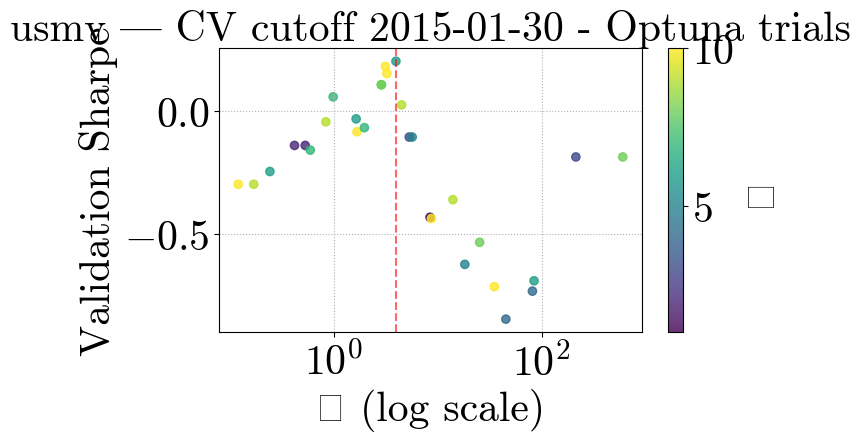

[I 2025-04-21 19:22:58,520] A new study created in memory with name: no-name-7f031d94-e7a9-40ff-876b-a8d6971501be
[I 2025-04-21 19:23:06,729] Trial 0 finished with value: 1.3470595881320642 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 1.3470595881320642.
[I 2025-04-21 19:23:09,136] Trial 1 finished with value: 0.4103164518042669 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 1.3470595881320642.
[I 2025-04-21 19:23:27,375] Trial 2 finished with value: 1.0801504872886185 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 1.3470595881320642.
[I 2025-04-21 19:23:34,314] Trial 3 finished with value: 0.6568435603449725 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 1.3470595881320642.
[I 2025-04-21 19:23:37,668] Trial 4 finished with value: 1.1551662424415725 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 w

Optuna best λ=15.5819, κ=5, Sharpe=1.4842


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


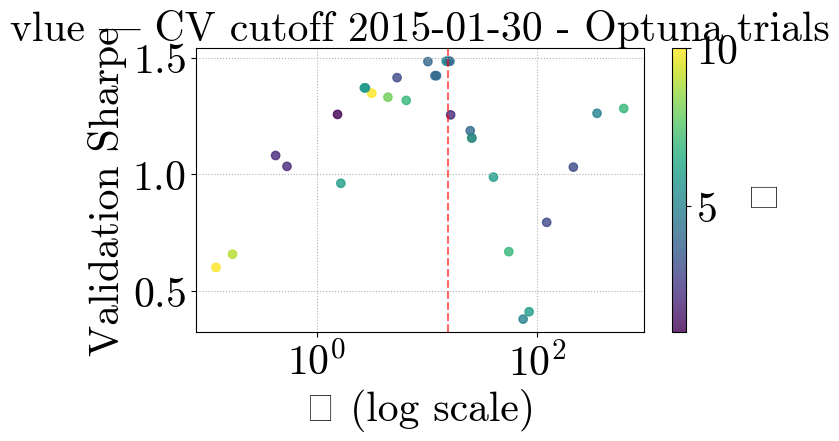

[I 2025-04-21 19:25:47,914] A new study created in memory with name: no-name-e450a1cc-53c0-4671-9cb4-27857a7ab151
[I 2025-04-21 19:25:53,969] Trial 0 finished with value: -0.8418154217538025 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.8418154217538025.
[I 2025-04-21 19:25:58,315] Trial 1 finished with value: -0.8909156077611794 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.8418154217538025.
[I 2025-04-21 19:26:07,749] Trial 2 finished with value: -2.3810980808646676 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.8418154217538025.
[I 2025-04-21 19:26:14,058] Trial 3 finished with value: -0.30407304361068666 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: -0.30407304361068666.
[I 2025-04-21 19:26:18,559] Trial 4 finished with value: -0.023598183485860277 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best

Optuna best λ=213.6833, κ=3, Sharpe=0.2863


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


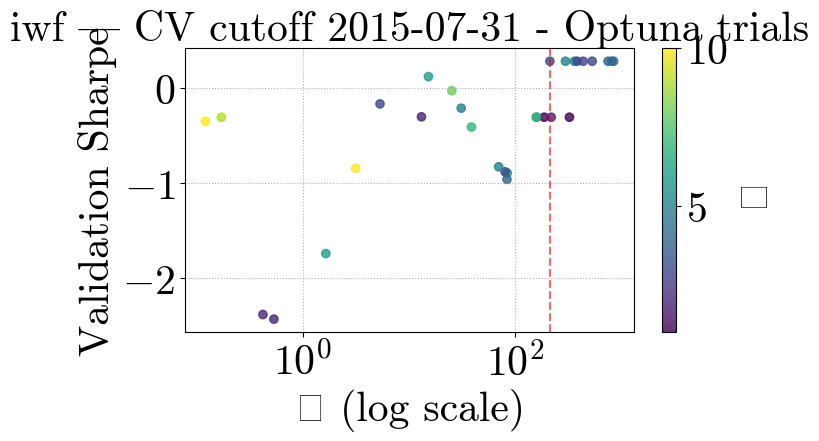

[I 2025-04-21 19:27:51,241] A new study created in memory with name: no-name-2a17ea61-2460-4592-9705-c62a76edaa2d
[I 2025-04-21 19:27:56,491] Trial 0 finished with value: -0.5035004025279991 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5035004025279991.
[I 2025-04-21 19:28:01,369] Trial 1 finished with value: 0.9523197010334207 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.9523197010334207.
[I 2025-04-21 19:28:07,975] Trial 2 finished with value: -0.7685341770774806 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.9523197010334207.
[I 2025-04-21 19:28:17,779] Trial 3 finished with value: -0.8065164063494591 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.9523197010334207.
[I 2025-04-21 19:28:22,137] Trial 4 finished with value: 0.3575416479913486 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=189.1150, κ=1, Sharpe=1.0034


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


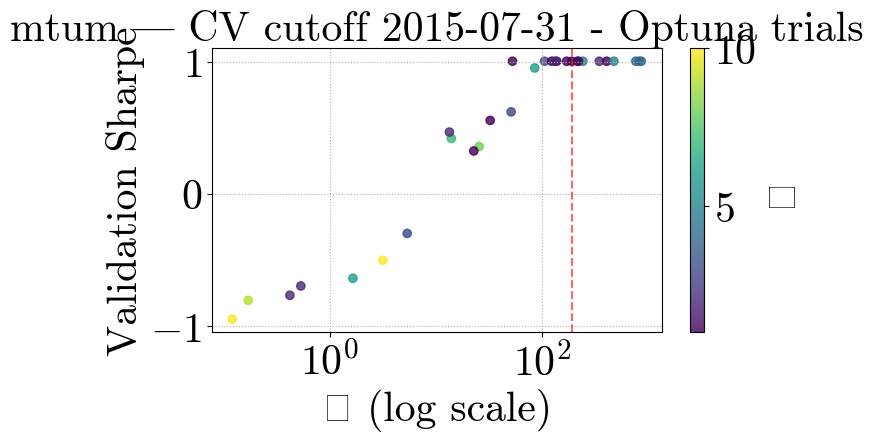

[I 2025-04-21 19:29:48,180] A new study created in memory with name: no-name-6d8902d9-9650-47b1-a276-296a8210dfb6
[I 2025-04-21 19:29:55,634] Trial 0 finished with value: -0.1774253530415249 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.1774253530415249.
[I 2025-04-21 19:29:58,886] Trial 1 finished with value: -0.9766878567686286 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.1774253530415249.
[I 2025-04-21 19:30:11,826] Trial 2 finished with value: -0.475950755385864 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.1774253530415249.
[I 2025-04-21 19:30:20,208] Trial 3 finished with value: -0.8022672859884942 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.1774253530415249.
[I 2025-04-21 19:30:29,253] Trial 4 finished with value: -0.086562247917034 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=4.1963, κ=10, Sharpe=0.0711


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


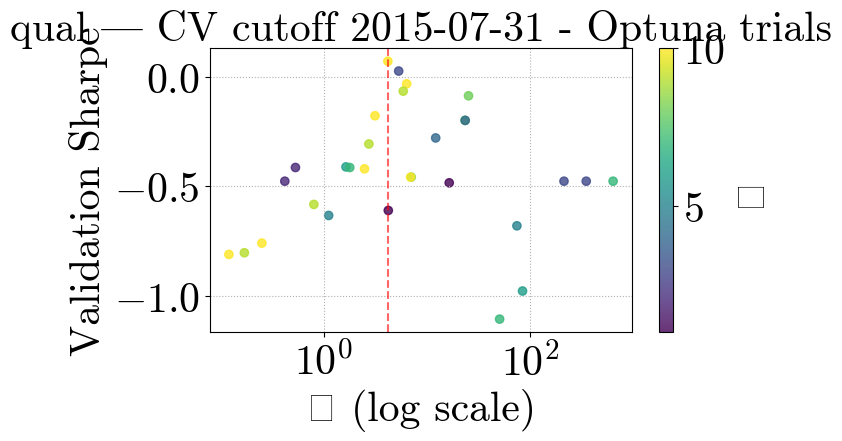

[I 2025-04-21 19:33:03,610] A new study created in memory with name: no-name-43355298-47a6-4c18-81dd-a9db50f3c523
[I 2025-04-21 19:33:08,740] Trial 0 finished with value: 0.17663579732985246 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.17663579732985246.
[I 2025-04-21 19:33:12,067] Trial 1 finished with value: 0.006511197087619218 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.17663579732985246.
[I 2025-04-21 19:33:21,329] Trial 2 finished with value: 0.545408334130642 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.545408334130642.
[I 2025-04-21 19:33:26,818] Trial 3 finished with value: 0.19676023089859776 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.545408334130642.
[I 2025-04-21 19:33:31,326] Trial 4 finished with value: 0.032792562040273414 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=0.2212, κ=2, Sharpe=0.5712


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


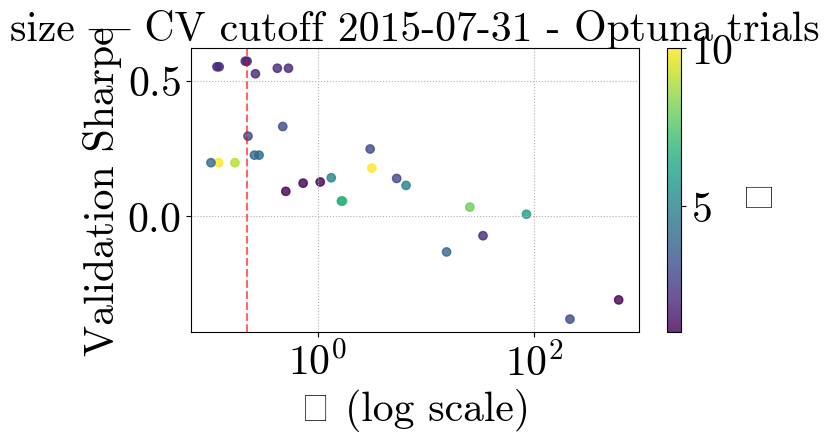

[I 2025-04-21 19:36:14,653] A new study created in memory with name: no-name-fdfbdb6d-e973-4a66-b47a-03d2eeab6f9c
[I 2025-04-21 19:36:21,408] Trial 0 finished with value: -0.03699380380160846 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.03699380380160846.
[I 2025-04-21 19:36:24,886] Trial 1 finished with value: 0.048029276312968626 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.048029276312968626.
[I 2025-04-21 19:36:31,364] Trial 2 finished with value: -0.13890168191112962 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.048029276312968626.
[I 2025-04-21 19:36:37,611] Trial 3 finished with value: -0.08153867492883034 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.048029276312968626.
[I 2025-04-21 19:36:43,946] Trial 4 finished with value: -0.21551130412414948 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}.

Optuna best λ=520.0541, κ=4, Sharpe=0.1901


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


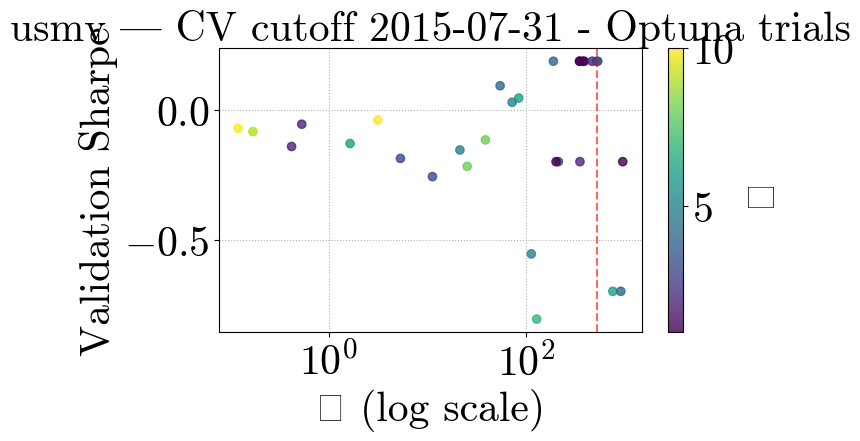

[I 2025-04-21 19:38:16,671] A new study created in memory with name: no-name-e8a98bcd-2fdb-404d-995e-2942bd05b438
[I 2025-04-21 19:38:24,006] Trial 0 finished with value: 1.4507240323913329 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 1.4507240323913329.
[I 2025-04-21 19:38:26,586] Trial 1 finished with value: 0.8657784694549598 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 1.4507240323913329.
[I 2025-04-21 19:38:54,847] Trial 2 finished with value: 1.5251345024711598 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 1.5251345024711598.
[I 2025-04-21 19:39:03,086] Trial 3 finished with value: 1.101923988560816 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 1.5251345024711598.
[I 2025-04-21 19:39:06,824] Trial 4 finished with value: 1.2593863246090249 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 2 wi

Optuna best λ=15.4551, κ=4, Sharpe=1.5919


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


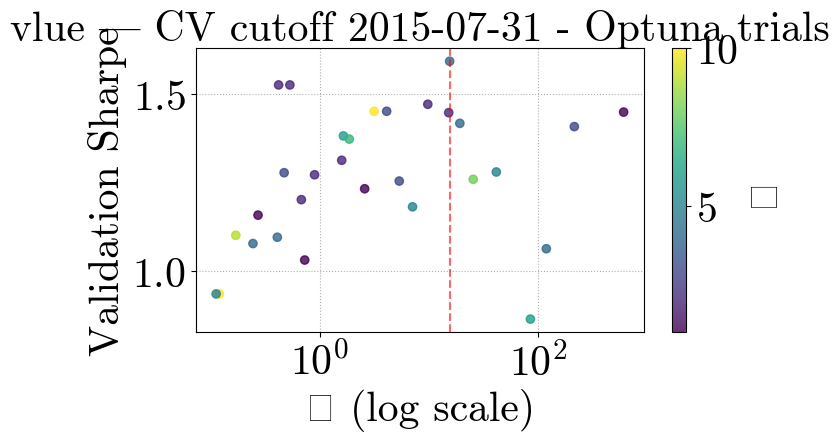

[I 2025-04-21 19:41:48,015] A new study created in memory with name: no-name-0168efbf-1c67-44fe-ae41-4be3427b386a
[I 2025-04-21 19:41:55,643] Trial 0 finished with value: -0.9583927907802667 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.9583927907802667.
[I 2025-04-21 19:42:01,019] Trial 1 finished with value: -0.8974429278621114 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.8974429278621114.
[I 2025-04-21 19:42:14,885] Trial 2 finished with value: -1.4841844412324505 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.8974429278621114.
[I 2025-04-21 19:42:23,305] Trial 3 finished with value: -1.557273117166958 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.8974429278621114.
[I 2025-04-21 19:42:28,915] Trial 4 finished with value: -0.503450462225191 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=32.4020, κ=6, Sharpe=-0.0319


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


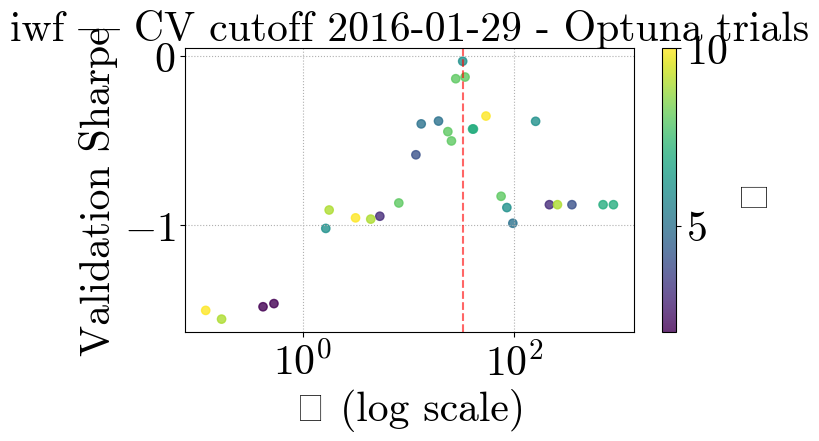

[I 2025-04-21 19:45:05,103] A new study created in memory with name: no-name-8b35828b-8e5e-45f3-992e-e4599bdc105c
[I 2025-04-21 19:45:10,929] Trial 0 finished with value: 0.10774294727507255 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.10774294727507255.
[I 2025-04-21 19:45:16,470] Trial 1 finished with value: 1.1312403593827383 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.1312403593827383.
[I 2025-04-21 19:45:22,448] Trial 2 finished with value: -0.18993670061167034 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.1312403593827383.
[I 2025-04-21 19:45:31,286] Trial 3 finished with value: -0.22981228727111938 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.1312403593827383.
[I 2025-04-21 19:45:35,861] Trial 4 finished with value: 0.6531929810274179 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=213.6833, κ=3, Sharpe=1.5252


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


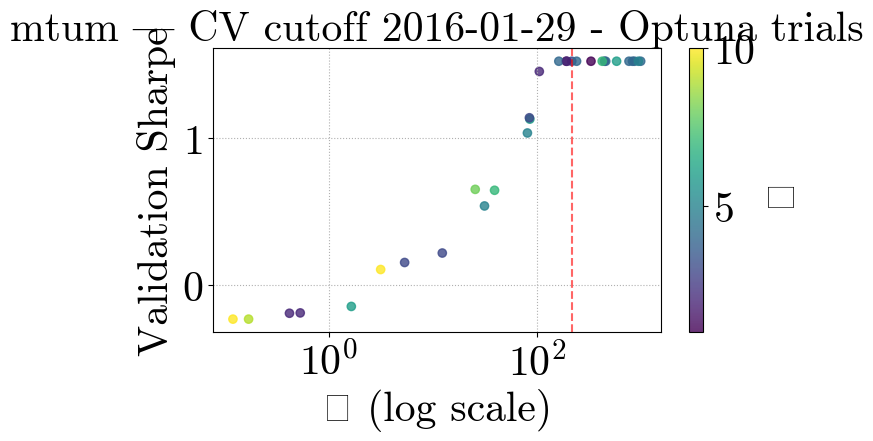

[I 2025-04-21 19:47:16,950] A new study created in memory with name: no-name-0c7e064b-aa42-43b3-bd83-12f0a2df6a44
[I 2025-04-21 19:47:24,021] Trial 0 finished with value: 0.20912870919815046 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.20912870919815046.
[I 2025-04-21 19:47:28,158] Trial 1 finished with value: 0.33517712773663594 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.33517712773663594.
[I 2025-04-21 19:47:38,190] Trial 2 finished with value: -0.143791793700569 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.33517712773663594.
[I 2025-04-21 19:47:45,176] Trial 3 finished with value: -0.5761301469131288 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.33517712773663594.
[I 2025-04-21 19:47:51,317] Trial 4 finished with value: 0.31379542735856486 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=430.1722, κ=1, Sharpe=1.2869


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


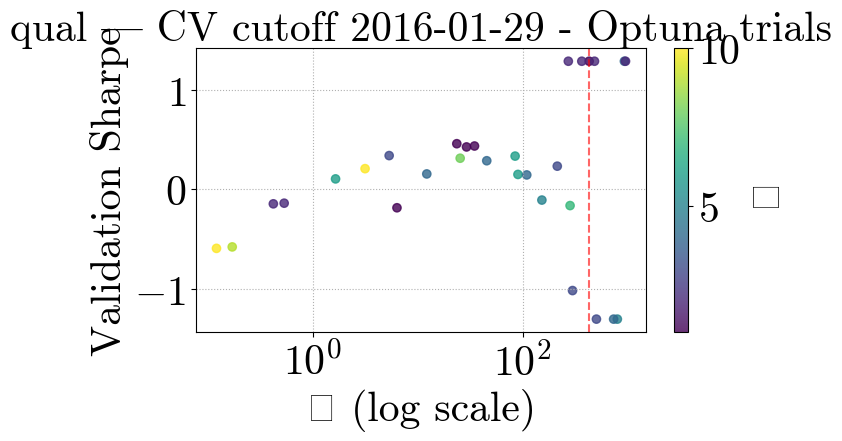

[I 2025-04-21 19:49:25,427] A new study created in memory with name: no-name-5bb05e1b-7038-42f6-9fbb-c56ae58eae87
[I 2025-04-21 19:49:30,218] Trial 0 finished with value: -0.24542418271836414 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.24542418271836414.
[I 2025-04-21 19:49:32,979] Trial 1 finished with value: -0.12286325957541228 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.12286325957541228.
[I 2025-04-21 19:49:43,235] Trial 2 finished with value: 0.26422564584773406 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.26422564584773406.
[I 2025-04-21 19:49:49,335] Trial 3 finished with value: -0.17452948637846044 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.26422564584773406.
[I 2025-04-21 19:49:53,911] Trial 4 finished with value: -0.03519741263312113 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Be

Optuna best λ=0.2641, κ=2, Sharpe=0.3813


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


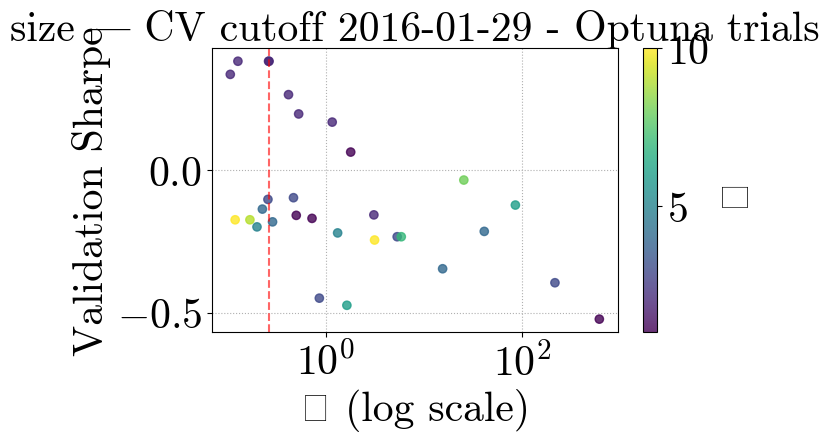

[I 2025-04-21 19:53:32,642] A new study created in memory with name: no-name-3cc490ea-dc62-4977-b860-9a5ce873562e
[I 2025-04-21 19:53:39,382] Trial 0 finished with value: -0.3177025983364161 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3177025983364161.
[I 2025-04-21 19:53:44,369] Trial 1 finished with value: 0.3167154810316443 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3167154810316443.
[I 2025-04-21 19:53:51,224] Trial 2 finished with value: -0.45750232935374074 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3167154810316443.
[I 2025-04-21 19:53:56,465] Trial 3 finished with value: -0.23164553601644686 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3167154810316443.
[I 2025-04-21 19:54:03,958] Trial 4 finished with value: -0.5216618005595547 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=85.2309, κ=7, Sharpe=0.3626


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


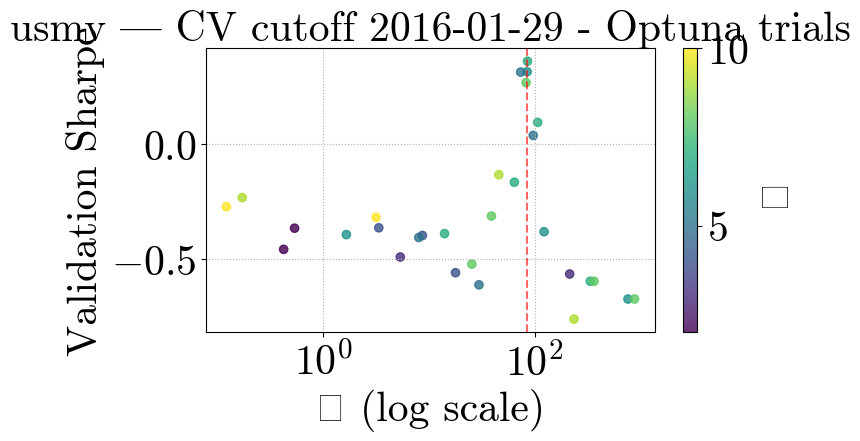

[I 2025-04-21 19:56:18,410] A new study created in memory with name: no-name-d605bf95-2310-47fd-9fda-6dc284bf71c3
[I 2025-04-21 19:56:26,225] Trial 0 finished with value: 0.8280379946312408 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.8280379946312408.
[I 2025-04-21 19:56:28,637] Trial 1 finished with value: 1.1575283638226534 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.1575283638226534.
[I 2025-04-21 19:56:54,643] Trial 2 finished with value: 1.3500008638368826 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 1.3500008638368826.
[I 2025-04-21 19:57:01,218] Trial 3 finished with value: 0.8537070474656305 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 1.3500008638368826.
[I 2025-04-21 19:57:05,393] Trial 4 finished with value: 0.8093304956601955 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 2 w

Optuna best λ=0.5337, κ=2, Sharpe=1.3554


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


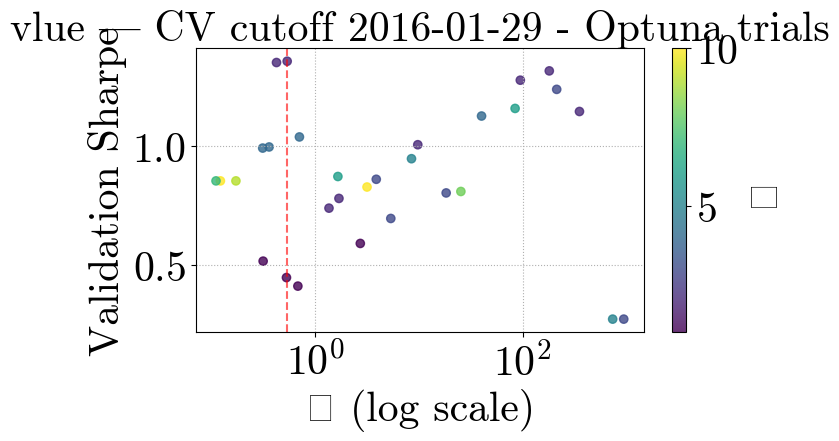

[I 2025-04-21 20:00:22,329] A new study created in memory with name: no-name-3c5f93a9-9c7b-410a-b16b-322917342cb8
[I 2025-04-21 20:00:34,267] Trial 0 finished with value: -1.0654489884856493 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -1.0654489884856493.
[I 2025-04-21 20:00:38,640] Trial 1 finished with value: -0.9580563923368308 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.9580563923368308.
[I 2025-04-21 20:00:47,878] Trial 2 finished with value: -1.4533630712086536 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.9580563923368308.
[I 2025-04-21 20:00:55,710] Trial 3 finished with value: -1.1785430665824632 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.9580563923368308.
[I 2025-04-21 20:01:01,982] Trial 4 finished with value: -0.702485283782288 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=199.2434, κ=1, Sharpe=-0.2638


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


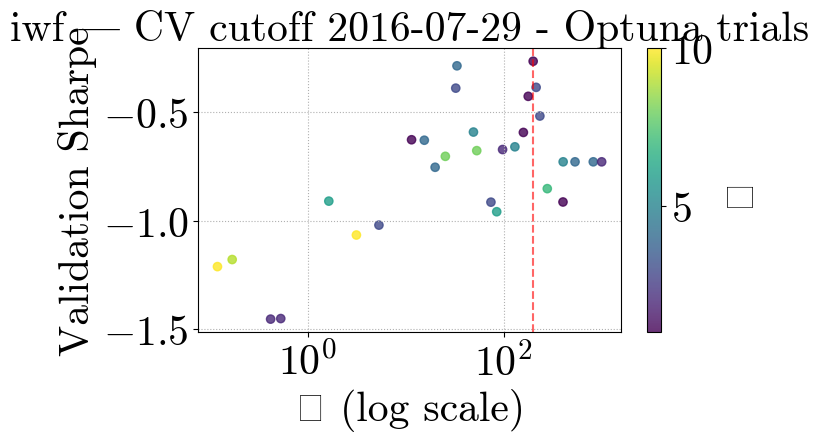

[I 2025-04-21 20:02:50,163] A new study created in memory with name: no-name-36185d22-3668-4bb7-8d28-7d58f049f9b9
[I 2025-04-21 20:02:55,941] Trial 0 finished with value: 0.09294314151607531 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.09294314151607531.
[I 2025-04-21 20:03:02,171] Trial 1 finished with value: 1.026629487645472 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.026629487645472.
[I 2025-04-21 20:03:12,731] Trial 2 finished with value: -0.36627398379016013 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.026629487645472.
[I 2025-04-21 20:03:25,384] Trial 3 finished with value: -0.43515245298608873 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.026629487645472.
[I 2025-04-21 20:03:29,383] Trial 4 finished with value: 0.8024159100661076 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1

Optuna best λ=135.7068, κ=4, Sharpe=1.6677


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


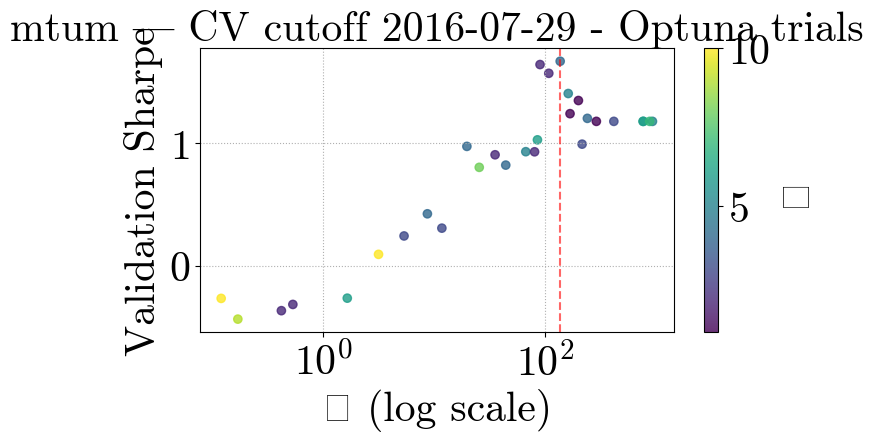

[I 2025-04-21 20:05:23,056] A new study created in memory with name: no-name-f1b9d6be-b58e-4a16-b90f-78e0e6b9090b
[I 2025-04-21 20:05:29,980] Trial 0 finished with value: 0.49495172402977866 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.49495172402977866.
[I 2025-04-21 20:05:35,898] Trial 1 finished with value: 0.20865925251453196 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.49495172402977866.
[I 2025-04-21 20:05:47,156] Trial 2 finished with value: 0.5472217610199526 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.5472217610199526.
[I 2025-04-21 20:05:52,843] Trial 3 finished with value: 0.5705491284802324 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: 0.5705491284802324.
[I 2025-04-21 20:05:58,659] Trial 4 finished with value: 0.25783222979440834 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=0.2057, κ=10, Sharpe=0.6307


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


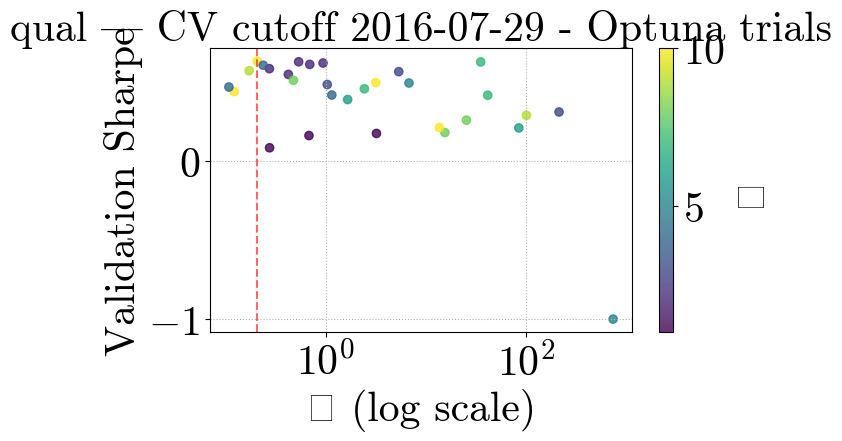

[I 2025-04-21 20:09:20,235] A new study created in memory with name: no-name-db028a67-3541-4950-a099-58abe3bc8ef1
[I 2025-04-21 20:09:28,071] Trial 0 finished with value: -0.3397493184615184 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3397493184615184.
[I 2025-04-21 20:09:33,001] Trial 1 finished with value: -0.03646262598560938 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.03646262598560938.
[I 2025-04-21 20:09:45,899] Trial 2 finished with value: 0.6445758679527732 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.6445758679527732.
[I 2025-04-21 20:09:56,968] Trial 3 finished with value: 0.03362563362910533 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.6445758679527732.
[I 2025-04-21 20:10:02,160] Trial 4 finished with value: 0.06198772738508086 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=0.4208, κ=2, Sharpe=0.6446


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


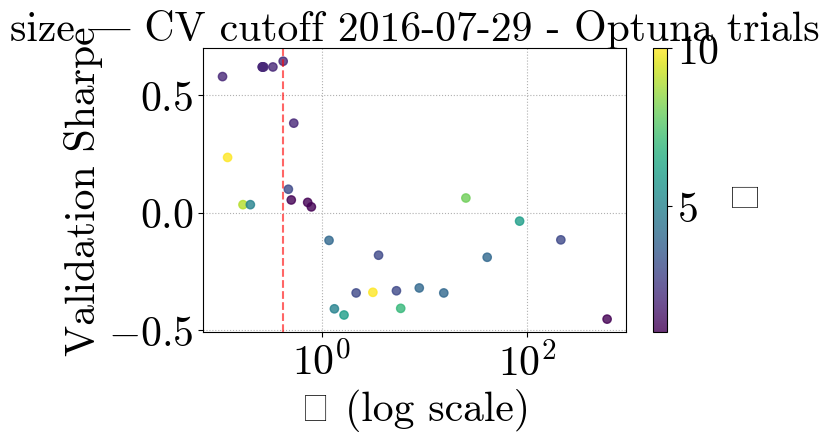

[I 2025-04-21 20:13:49,802] A new study created in memory with name: no-name-ec77768d-4077-4e0e-8aec-c97100f95f72
[I 2025-04-21 20:13:56,053] Trial 0 finished with value: -0.3881935732448121 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3881935732448121.
[I 2025-04-21 20:14:00,561] Trial 1 finished with value: 0.4141736939058964 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.4141736939058964.
[I 2025-04-21 20:14:06,653] Trial 2 finished with value: -0.4518790194156895 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.4141736939058964.
[I 2025-04-21 20:14:15,183] Trial 3 finished with value: 0.003735886333152562 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.4141736939058964.
[I 2025-04-21 20:14:22,288] Trial 4 finished with value: 0.053899897129163765 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=75.3966, κ=5, Sharpe=0.5101


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


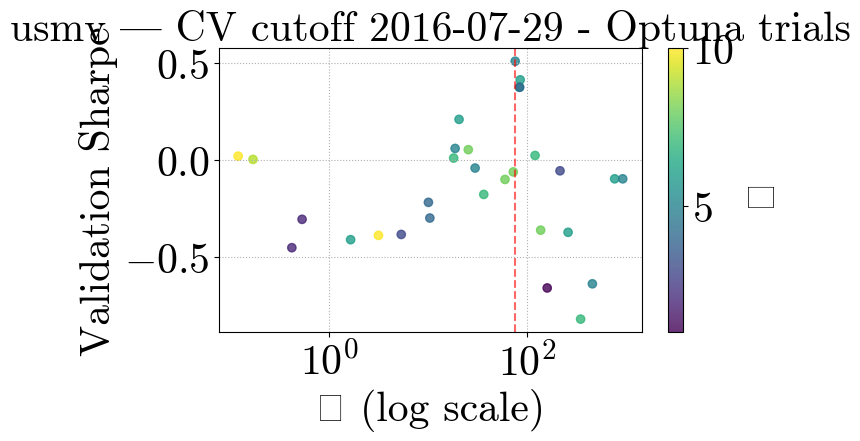

[I 2025-04-21 20:16:59,408] A new study created in memory with name: no-name-1d10e4b0-b0a7-472a-8f2c-9fcce3c5d132
[I 2025-04-21 20:17:11,128] Trial 0 finished with value: -0.3134354967259484 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3134354967259484.
[I 2025-04-21 20:17:15,264] Trial 1 finished with value: 0.14874473872147734 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.14874473872147734.
[I 2025-04-21 20:17:37,708] Trial 2 finished with value: 0.29202542081906463 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.29202542081906463.
[I 2025-04-21 20:17:49,429] Trial 3 finished with value: 0.03333276406588756 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.29202542081906463.
[I 2025-04-21 20:17:53,970] Trial 4 finished with value: -0.41030744538210495 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=379.2098, κ=7, Sharpe=0.4798


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


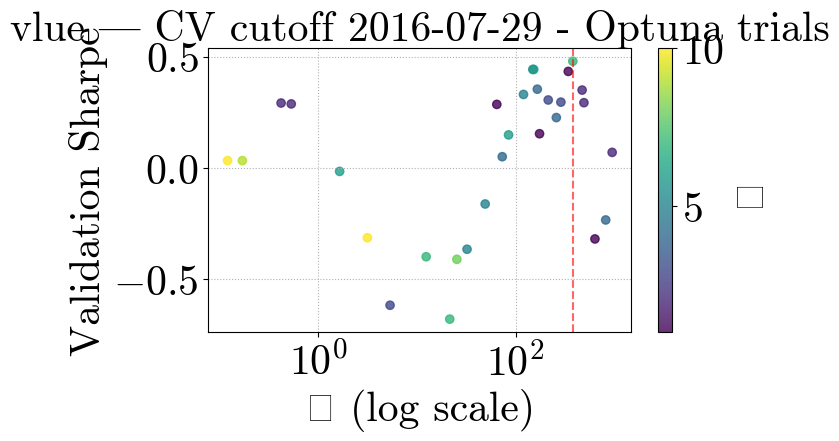

[I 2025-04-21 20:20:08,234] A new study created in memory with name: no-name-846f8c44-da5d-4c08-a519-076cfcbc2568
[I 2025-04-21 20:20:15,836] Trial 0 finished with value: -0.7538061974999274 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.7538061974999274.
[I 2025-04-21 20:20:20,660] Trial 1 finished with value: -1.1590043774257845 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.7538061974999274.
[I 2025-04-21 20:20:32,136] Trial 2 finished with value: -1.462078364883406 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.7538061974999274.
[I 2025-04-21 20:20:39,516] Trial 3 finished with value: -1.0427883961847355 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.7538061974999274.
[I 2025-04-21 20:20:44,599] Trial 4 finished with value: -0.3718726408154346 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=236.5704, κ=5, Sharpe=-0.0898


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


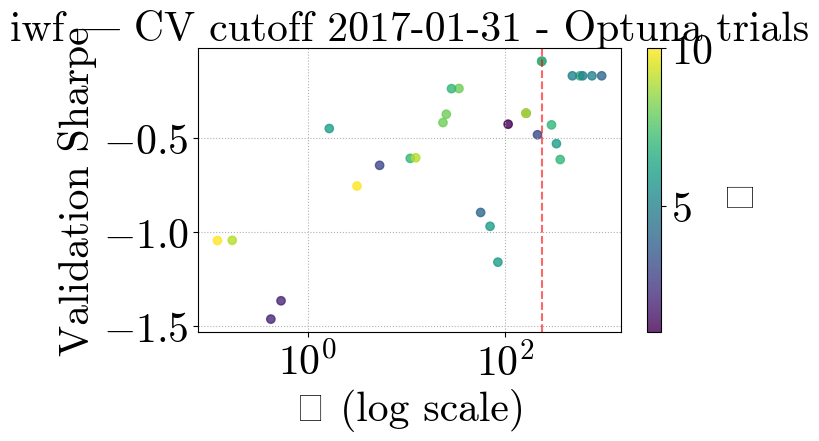

[I 2025-04-21 20:23:05,730] A new study created in memory with name: no-name-61bd1853-6712-4774-a2df-1479ae1ca81c
[I 2025-04-21 20:23:12,643] Trial 0 finished with value: -0.07853720299479407 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.07853720299479407.
[I 2025-04-21 20:23:18,678] Trial 1 finished with value: 1.0877015491345772 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.0877015491345772.
[I 2025-04-21 20:23:33,213] Trial 2 finished with value: -0.4289648668277738 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.0877015491345772.
[I 2025-04-21 20:23:43,333] Trial 3 finished with value: -0.2727422022109457 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.0877015491345772.
[I 2025-04-21 20:23:48,002] Trial 4 finished with value: 0.7720827199683488 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=89.1701, κ=5, Sharpe=1.1299


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


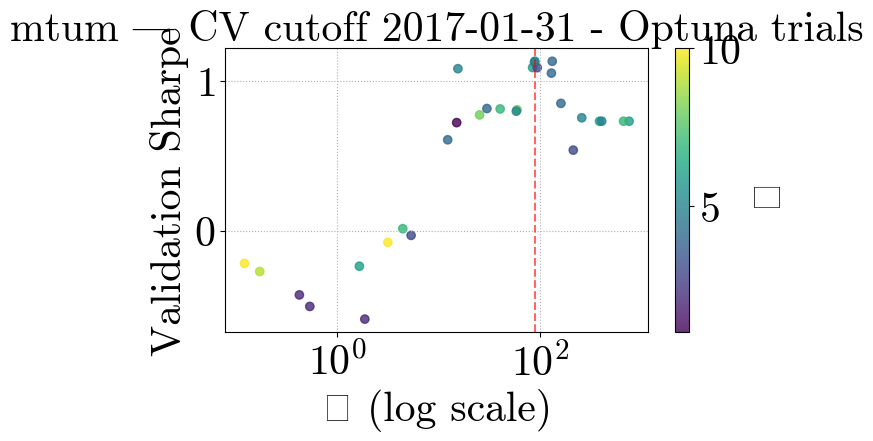

[I 2025-04-21 20:26:09,522] A new study created in memory with name: no-name-1cc13beb-6dd1-4f2e-8c53-9b9dfaa307ca
[I 2025-04-21 20:26:18,062] Trial 0 finished with value: 0.9747055624080473 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.9747055624080473.
[I 2025-04-21 20:26:23,543] Trial 1 finished with value: 0.1643139909166022 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.9747055624080473.
[I 2025-04-21 20:26:35,262] Trial 2 finished with value: 0.9581251393777056 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.9747055624080473.
[I 2025-04-21 20:26:45,725] Trial 3 finished with value: 0.9460973094059858 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.9747055624080473.
[I 2025-04-21 20:26:52,164] Trial 4 finished with value: 0.36320546122988484 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 

Optuna best λ=1.0466, κ=9, Sharpe=1.0917


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


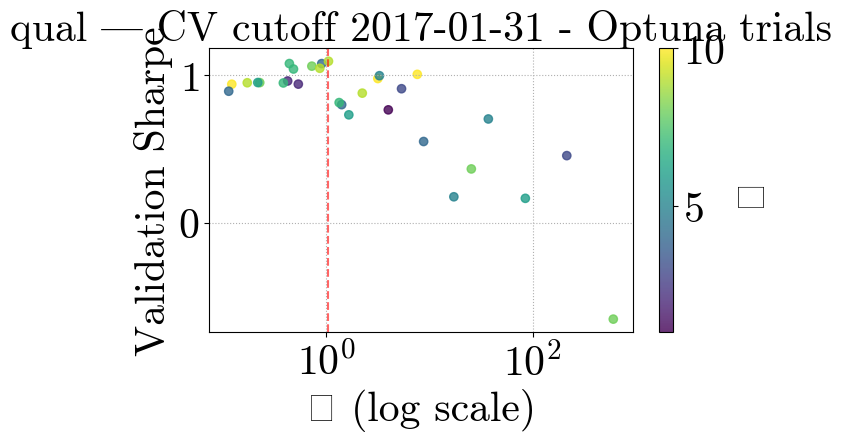

[I 2025-04-21 20:30:28,212] A new study created in memory with name: no-name-2b7df928-4479-4146-b1d8-71cfa0327dc9
[I 2025-04-21 20:30:38,012] Trial 0 finished with value: -0.2772622258604035 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2772622258604035.
[I 2025-04-21 20:30:43,338] Trial 1 finished with value: 0.0524893781179511 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.0524893781179511.
[I 2025-04-21 20:30:55,325] Trial 2 finished with value: 0.5064091327926438 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.5064091327926438.
[I 2025-04-21 20:31:03,973] Trial 3 finished with value: -0.04144896766295918 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.5064091327926438.
[I 2025-04-21 20:31:09,674] Trial 4 finished with value: 0.21592029584234593 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=0.3342, κ=2, Sharpe=0.5387


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


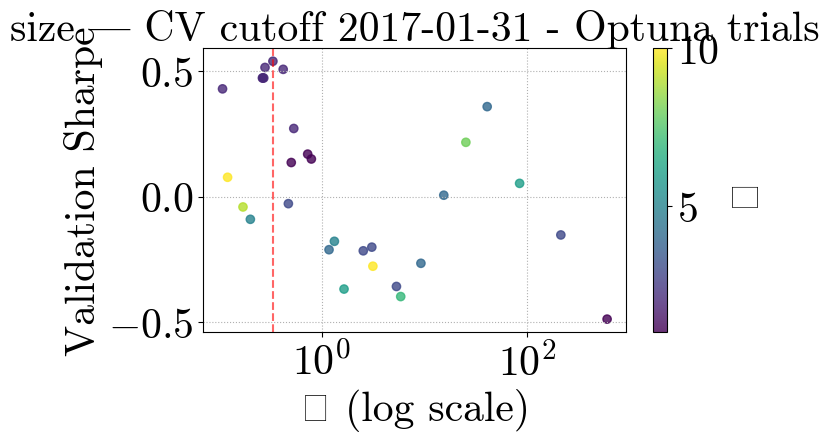

[I 2025-04-21 20:35:17,444] A new study created in memory with name: no-name-09f10007-1fef-4549-a09c-855a28d085bb
[I 2025-04-21 20:35:27,188] Trial 0 finished with value: -0.616676917909391 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.616676917909391.
[I 2025-04-21 20:35:32,781] Trial 1 finished with value: -0.019795199871733254 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.019795199871733254.
[I 2025-04-21 20:35:44,142] Trial 2 finished with value: -0.8259362427499749 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.019795199871733254.
[I 2025-04-21 20:35:53,762] Trial 3 finished with value: -0.44411067030199247 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.019795199871733254.
[I 2025-04-21 20:36:01,127] Trial 4 finished with value: -0.27102440546547835 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. 

Optuna best λ=69.5300, κ=4, Sharpe=-0.0141


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


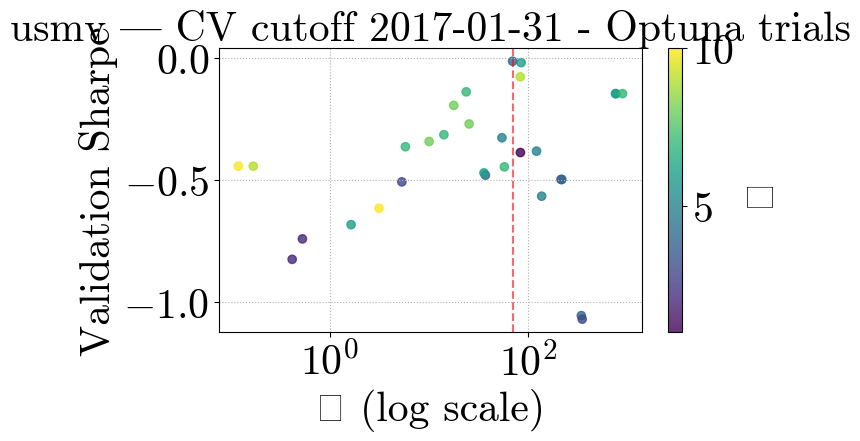

[I 2025-04-21 20:38:42,203] A new study created in memory with name: no-name-20fc56ff-aaff-4684-aa4f-7632cb3a815f
[I 2025-04-21 20:38:49,166] Trial 0 finished with value: 0.32795151111570847 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.32795151111570847.
[I 2025-04-21 20:38:53,095] Trial 1 finished with value: 0.6616414923388731 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.6616414923388731.
[I 2025-04-21 20:39:14,771] Trial 2 finished with value: 0.4781412058095908 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.6616414923388731.
[I 2025-04-21 20:39:24,292] Trial 3 finished with value: 0.48395885621504053 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.6616414923388731.
[I 2025-04-21 20:39:28,968] Trial 4 finished with value: -0.13687500359899202 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=138.8231, κ=5, Sharpe=1.0084


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


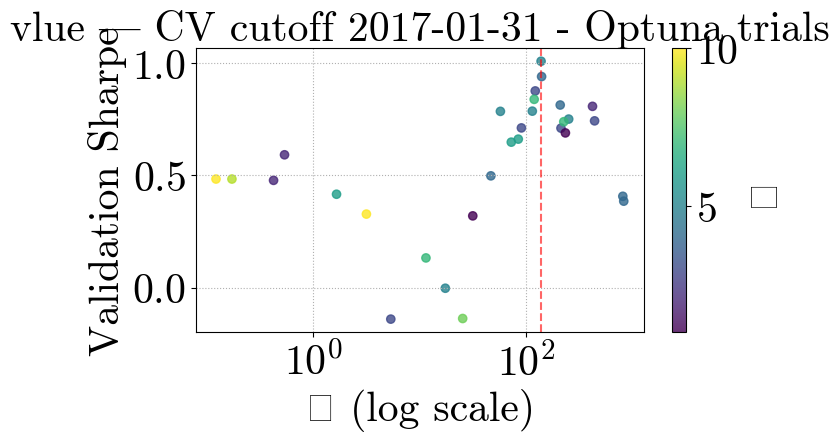

[I 2025-04-21 20:41:34,871] A new study created in memory with name: no-name-56a7a544-d0a2-4f30-bdc2-d60cd31cf41a
[I 2025-04-21 20:41:41,473] Trial 0 finished with value: -1.1263149654961164 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -1.1263149654961164.
[I 2025-04-21 20:41:45,636] Trial 1 finished with value: -1.6179198287971701 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -1.1263149654961164.
[I 2025-04-21 20:41:53,684] Trial 2 finished with value: -1.1256308155000494 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -1.1256308155000494.
[I 2025-04-21 20:41:59,809] Trial 3 finished with value: -1.482590229000702 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -1.1256308155000494.
[I 2025-04-21 20:42:04,062] Trial 4 finished with value: -0.8858551186203144 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=140.1110, κ=1, Sharpe=-0.2998


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


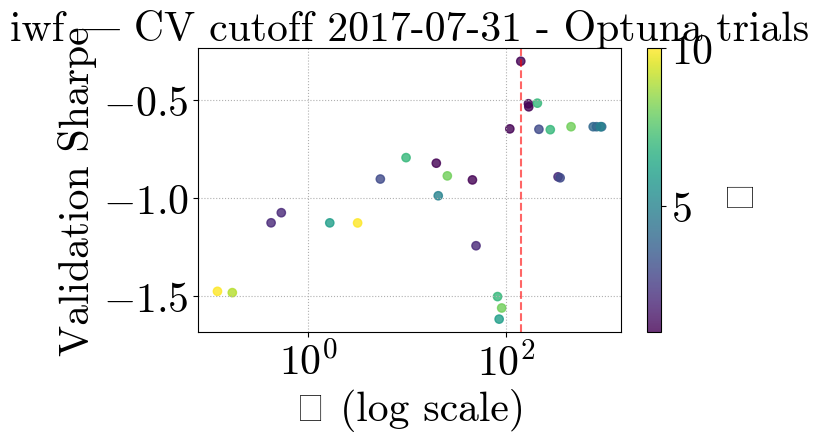

[I 2025-04-21 20:43:50,995] A new study created in memory with name: no-name-c1cecb40-f015-4082-b5ea-906d7beee2e4
[I 2025-04-21 20:43:59,713] Trial 0 finished with value: 0.4242910714573273 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.4242910714573273.
[I 2025-04-21 20:44:06,270] Trial 1 finished with value: 2.0141371038504063 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 2.0141371038504063.
[I 2025-04-21 20:44:21,995] Trial 2 finished with value: 0.023527114711756367 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 2.0141371038504063.
[I 2025-04-21 20:44:28,715] Trial 3 finished with value: 0.3695628623990436 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 2.0141371038504063.
[I 2025-04-21 20:44:33,924] Trial 4 finished with value: 1.5379888048141246 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1

Optuna best λ=87.1816, κ=9, Sharpe=2.0197


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


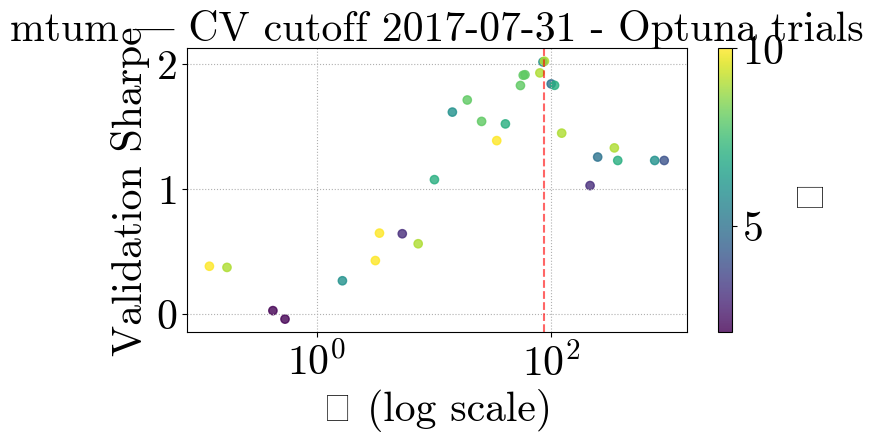

[I 2025-04-21 20:47:15,831] A new study created in memory with name: no-name-aef1f6ba-5ba9-44ba-b1b2-7d5242f4290e
[I 2025-04-21 20:47:24,186] Trial 0 finished with value: 0.645327066388082 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.645327066388082.
[I 2025-04-21 20:47:29,136] Trial 1 finished with value: 0.16608934344228043 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.645327066388082.
[I 2025-04-21 20:47:40,102] Trial 2 finished with value: 0.44922616933390586 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.645327066388082.
[I 2025-04-21 20:47:48,683] Trial 3 finished with value: 0.6123273759165158 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.645327066388082.
[I 2025-04-21 20:47:56,226] Trial 4 finished with value: 0.22811591975995943 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 wit

Optuna best λ=0.7884, κ=4, Sharpe=0.8197


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


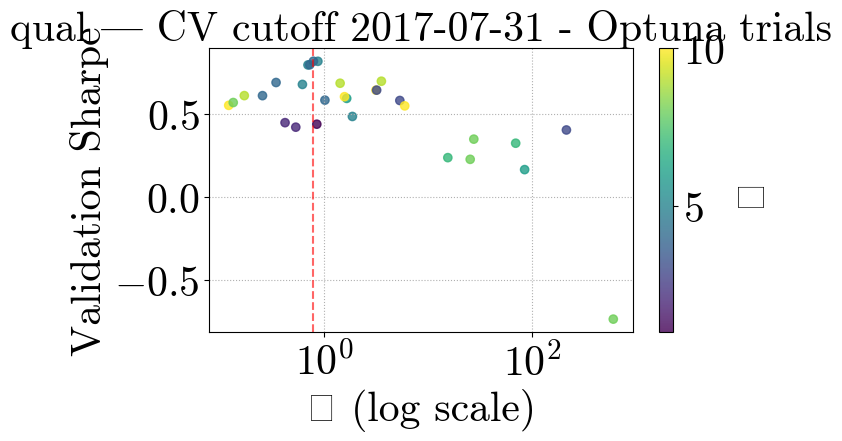

[I 2025-04-21 20:51:19,093] A new study created in memory with name: no-name-abf90fd0-78b6-4af4-b3cc-879cfa771344
[I 2025-04-21 20:51:26,150] Trial 0 finished with value: 0.019740713554474435 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.019740713554474435.
[I 2025-04-21 20:51:30,667] Trial 1 finished with value: 0.44005762627194256 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.44005762627194256.
[I 2025-04-21 20:51:55,108] Trial 2 finished with value: 0.5117486194575852 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.5117486194575852.
[I 2025-04-21 20:52:03,258] Trial 3 finished with value: 0.26062122643327557 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.5117486194575852.
[I 2025-04-21 20:52:07,585] Trial 4 finished with value: 0.5818102326261412 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=74.7346, κ=8, Sharpe=0.6372


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


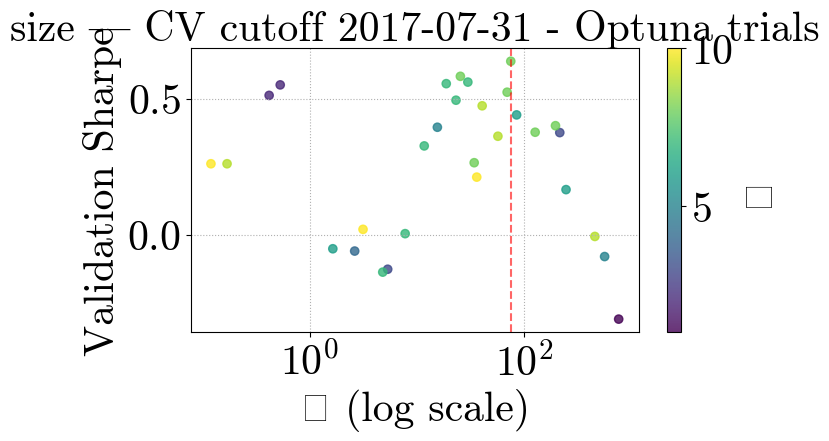

[I 2025-04-21 20:54:17,372] A new study created in memory with name: no-name-72a8c84a-ca6a-4596-8060-59fbd55a5b5e
[I 2025-04-21 20:54:28,422] Trial 0 finished with value: -0.9357833652914589 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.9357833652914589.
[I 2025-04-21 20:54:32,734] Trial 1 finished with value: 0.007879390478852638 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.007879390478852638.
[I 2025-04-21 20:54:49,705] Trial 2 finished with value: -0.9342953976453572 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.007879390478852638.
[I 2025-04-21 20:54:58,671] Trial 3 finished with value: -0.6658538412577758 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.007879390478852638.
[I 2025-04-21 20:55:09,823] Trial 4 finished with value: -0.35693776442341413 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=760.6194, κ=6, Sharpe=1.1879


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


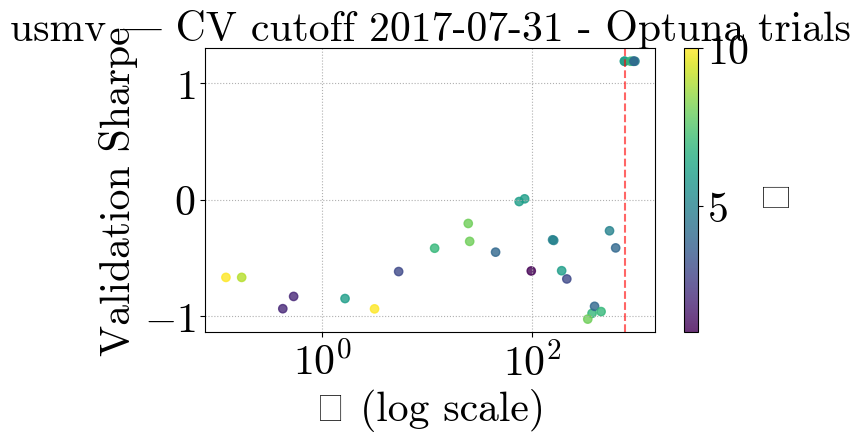

[I 2025-04-21 20:57:10,844] A new study created in memory with name: no-name-ff6cfea1-298d-4732-9858-f8f523633916
[I 2025-04-21 20:57:17,219] Trial 0 finished with value: -0.1909320150165048 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.1909320150165048.
[I 2025-04-21 20:57:19,880] Trial 1 finished with value: 0.06506556539957384 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.06506556539957384.
[I 2025-04-21 20:57:43,517] Trial 2 finished with value: -0.06889775010090234 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.06506556539957384.
[I 2025-04-21 20:57:53,905] Trial 3 finished with value: -0.45702618409123896 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.06506556539957384.
[I 2025-04-21 20:57:59,522] Trial 4 finished with value: -0.838075607399175 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=474.2244, κ=2, Sharpe=0.3058


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


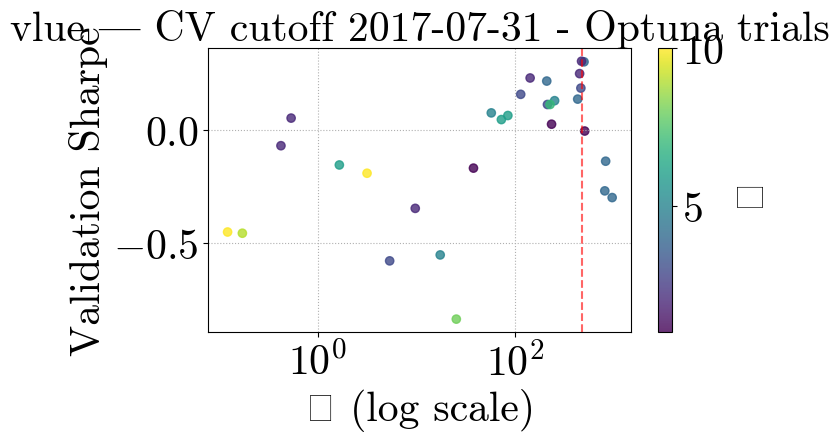

[I 2025-04-21 21:00:11,804] A new study created in memory with name: no-name-a526b448-a1a9-4443-904d-a09fed748173
[I 2025-04-21 21:00:15,305] Trial 0 finished with value: -0.8612164946901921 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.8612164946901921.
[I 2025-04-21 21:00:19,253] Trial 1 finished with value: -1.7158698810208342 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.8612164946901921.
[I 2025-04-21 21:00:29,904] Trial 2 finished with value: -0.6956886123235726 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.6956886123235726.
[I 2025-04-21 21:00:38,090] Trial 3 finished with value: -1.0460256548724782 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -0.6956886123235726.
[I 2025-04-21 21:00:43,174] Trial 4 finished with value: -0.9272687277402626 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=326.6630, κ=1, Sharpe=-0.1903


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


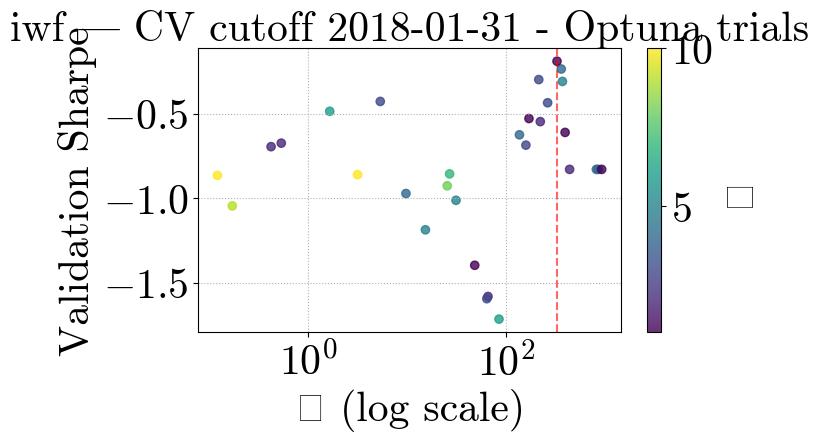

[I 2025-04-21 21:02:23,330] A new study created in memory with name: no-name-92062e2b-35af-4442-8879-014ef020a003
[I 2025-04-21 21:02:31,891] Trial 0 finished with value: 0.3677913890421077 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3677913890421077.
[I 2025-04-21 21:02:39,415] Trial 1 finished with value: 2.226868230535356 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 2.226868230535356.
[I 2025-04-21 21:02:49,752] Trial 2 finished with value: 0.30485904935089536 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 2.226868230535356.
[I 2025-04-21 21:03:00,100] Trial 3 finished with value: 0.4819704821173739 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 2.226868230535356.
[I 2025-04-21 21:03:05,447] Trial 4 finished with value: 1.7968939877459162 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 with

Optuna best λ=57.4859, κ=8, Sharpe=2.2981


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


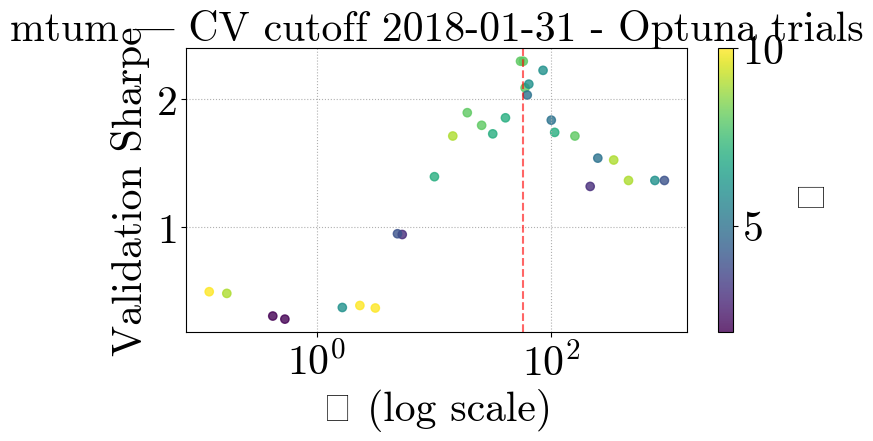

[I 2025-04-21 21:05:38,299] A new study created in memory with name: no-name-653d6755-725f-4442-92ee-5dab780a258f
[I 2025-04-21 21:05:45,995] Trial 0 finished with value: 0.3945054398612995 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3945054398612995.
[I 2025-04-21 21:05:51,377] Trial 1 finished with value: 0.025748668454947873 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.3945054398612995.
[I 2025-04-21 21:05:59,972] Trial 2 finished with value: 0.05814869932740389 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.3945054398612995.
[I 2025-04-21 21:06:05,600] Trial 3 finished with value: 0.14598917924861285 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.3945054398612995.
[I 2025-04-21 21:06:10,130] Trial 4 finished with value: 0.2701542236586234 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=27.3083, κ=1, Sharpe=0.8448


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


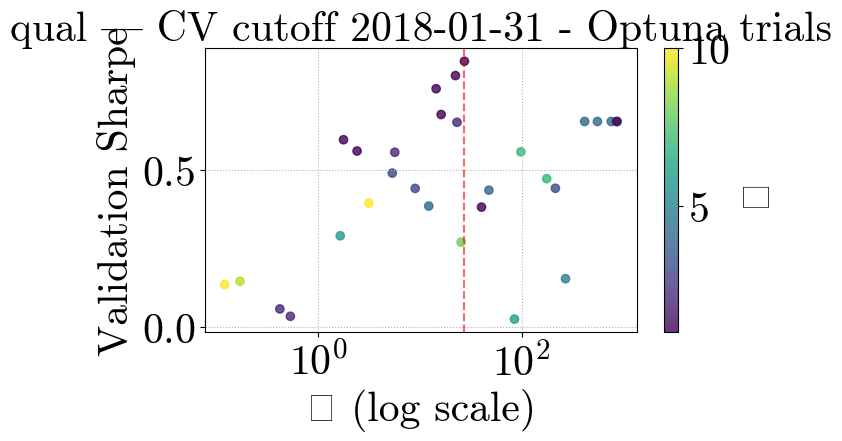

[I 2025-04-21 21:08:17,364] A new study created in memory with name: no-name-39593af1-3ed8-4e67-9861-f9df5855e39a
[I 2025-04-21 21:08:23,198] Trial 0 finished with value: -0.24442318736784135 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.24442318736784135.
[I 2025-04-21 21:08:26,506] Trial 1 finished with value: 0.2612084476344308 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.2612084476344308.
[I 2025-04-21 21:08:40,137] Trial 2 finished with value: 0.3149781828581353 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.3149781828581353.
[I 2025-04-21 21:08:47,805] Trial 3 finished with value: 0.10810957490254651 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.3149781828581353.
[I 2025-04-21 21:08:53,915] Trial 4 finished with value: 0.11386941357600767 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=40.1849, κ=2, Sharpe=0.3936


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


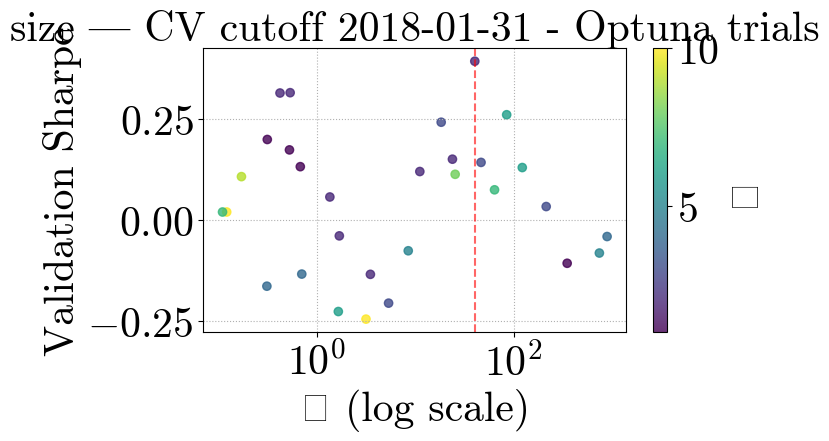

[I 2025-04-21 21:11:46,485] A new study created in memory with name: no-name-0bc3fbda-332b-42b5-b9cd-ecbfbf68dbda
[I 2025-04-21 21:11:53,267] Trial 0 finished with value: -0.67531305545225 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.67531305545225.
[I 2025-04-21 21:11:57,450] Trial 1 finished with value: 0.16347735798118868 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.16347735798118868.
[I 2025-04-21 21:12:10,375] Trial 2 finished with value: -0.6404892374206371 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.16347735798118868.
[I 2025-04-21 21:12:31,794] Trial 3 finished with value: -0.4478707024650198 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.16347735798118868.
[I 2025-04-21 21:12:41,757] Trial 4 finished with value: 0.26585107127962265 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=66.1791, κ=7, Sharpe=0.3126


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


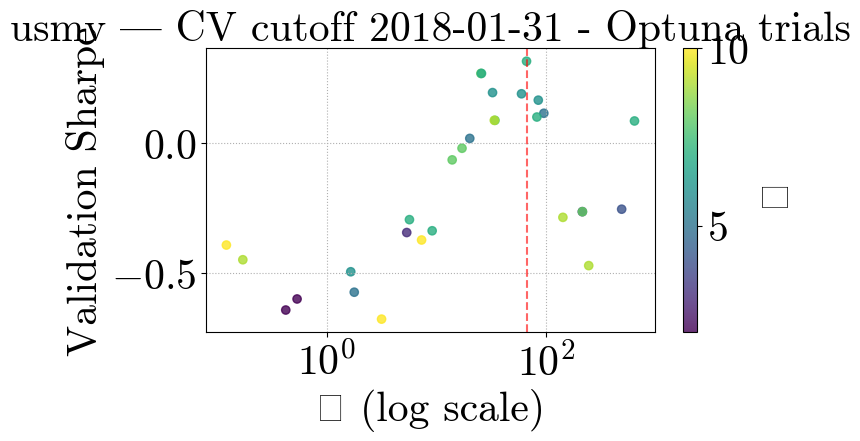

[I 2025-04-21 21:15:38,803] A new study created in memory with name: no-name-0d91431c-061b-41ea-ad1f-1e22f46d752a
[I 2025-04-21 21:15:47,093] Trial 0 finished with value: -0.3670692309359859 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3670692309359859.
[I 2025-04-21 21:15:49,768] Trial 1 finished with value: 0.23036033197369052 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.23036033197369052.
[I 2025-04-21 21:16:10,227] Trial 2 finished with value: -0.2120954496216079 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.23036033197369052.
[I 2025-04-21 21:16:17,004] Trial 3 finished with value: -0.2646584984572065 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.23036033197369052.
[I 2025-04-21 21:16:21,780] Trial 4 finished with value: -0.6724617862386438 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=110.1136, κ=2, Sharpe=0.6323


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


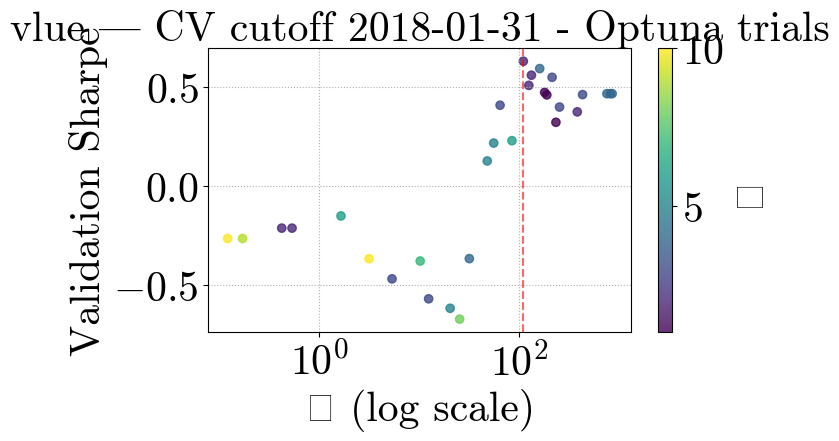

[I 2025-04-21 21:18:17,176] A new study created in memory with name: no-name-78c05ff5-e990-4590-8f46-b70ebda61859
[I 2025-04-21 21:18:21,063] Trial 0 finished with value: -0.014166550976219825 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.014166550976219825.
[I 2025-04-21 21:18:25,110] Trial 1 finished with value: 0.7677109161423872 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.7677109161423872.
[I 2025-04-21 21:18:44,137] Trial 2 finished with value: -0.80296775778443 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.7677109161423872.
[I 2025-04-21 21:18:49,391] Trial 3 finished with value: -0.15808940646486394 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.7677109161423872.
[I 2025-04-21 21:18:54,357] Trial 4 finished with value: 0.3397993616751761 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=64.0894, κ=9, Sharpe=0.9832


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


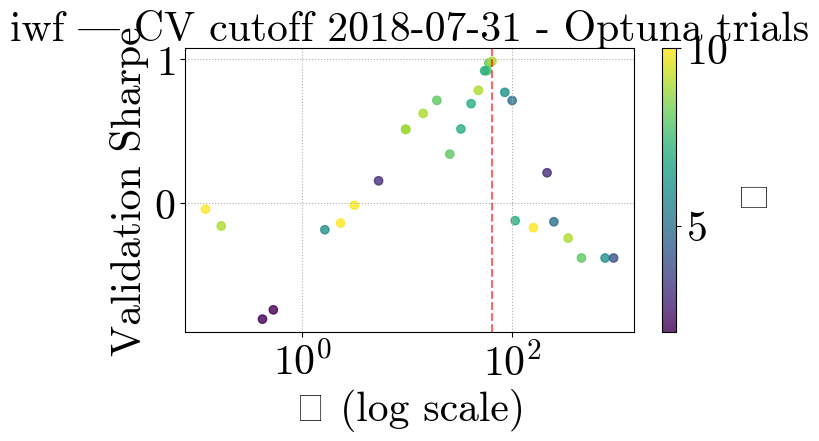

[I 2025-04-21 21:21:10,601] A new study created in memory with name: no-name-d7cab195-e603-465a-ba2b-95c97154312c
[I 2025-04-21 21:21:21,513] Trial 0 finished with value: 0.15144148823288586 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.15144148823288586.
[I 2025-04-21 21:21:25,953] Trial 1 finished with value: 1.655936320146527 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.655936320146527.
[I 2025-04-21 21:21:40,425] Trial 2 finished with value: -0.06510649050740577 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.655936320146527.
[I 2025-04-21 21:21:48,111] Trial 3 finished with value: 0.3442053306998322 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.655936320146527.
[I 2025-04-21 21:21:52,492] Trial 4 finished with value: 1.1233315439520555 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 w

Optuna best λ=88.4233, κ=6, Sharpe=1.7018


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


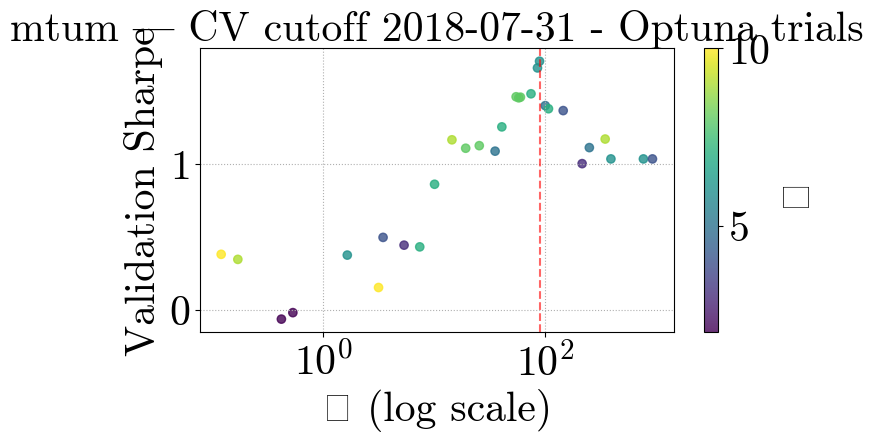

[I 2025-04-21 21:24:13,443] A new study created in memory with name: no-name-07b18a51-4884-4aa5-8997-be345651b2fd
[I 2025-04-21 21:24:21,407] Trial 0 finished with value: 0.06807988349427825 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.06807988349427825.
[I 2025-04-21 21:24:25,893] Trial 1 finished with value: 0.4570202554250681 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.4570202554250681.
[I 2025-04-21 21:24:35,163] Trial 2 finished with value: -0.008012636682336814 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.4570202554250681.
[I 2025-04-21 21:24:42,935] Trial 3 finished with value: 0.09675246317147257 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.4570202554250681.
[I 2025-04-21 21:24:49,030] Trial 4 finished with value: 0.03576997720122217 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=176.3992, κ=1, Sharpe=0.6629


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


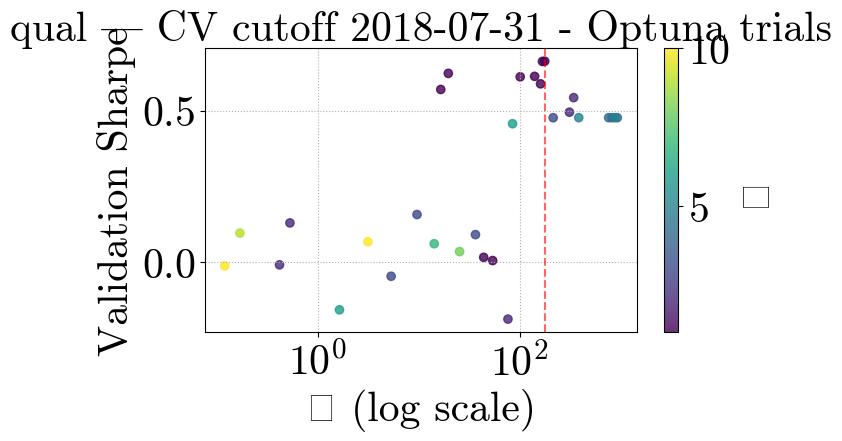

[I 2025-04-21 21:26:20,971] A new study created in memory with name: no-name-16973a79-d7d0-4f2c-8807-db9ea5622142
[I 2025-04-21 21:26:27,918] Trial 0 finished with value: -0.31536695212644955 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.31536695212644955.
[I 2025-04-21 21:26:32,167] Trial 1 finished with value: 0.17228367914269535 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.17228367914269535.
[I 2025-04-21 21:26:41,782] Trial 2 finished with value: 0.2197650446379752 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.2197650446379752.
[I 2025-04-21 21:26:49,709] Trial 3 finished with value: 0.08952500283472076 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.2197650446379752.
[I 2025-04-21 21:26:54,845] Trial 4 finished with value: 0.048043809384728485 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=0.2641, κ=2, Sharpe=0.3589


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


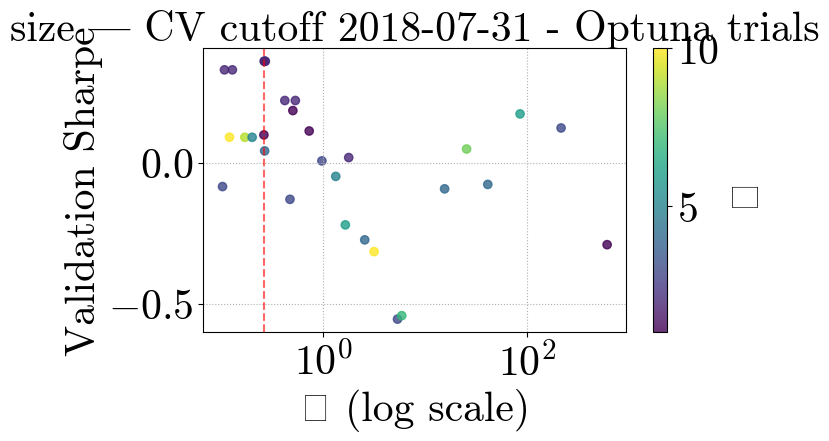

[I 2025-04-21 21:31:01,788] A new study created in memory with name: no-name-953ed50f-3d22-45f6-92ca-a0c570514ca2
[I 2025-04-21 21:31:08,574] Trial 0 finished with value: -0.8678446702365079 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.8678446702365079.
[I 2025-04-21 21:31:12,316] Trial 1 finished with value: -0.6832946714575228 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.6832946714575228.
[I 2025-04-21 21:31:21,084] Trial 2 finished with value: -0.8869725524034704 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.6832946714575228.
[I 2025-04-21 21:31:27,224] Trial 3 finished with value: -0.7710330409219254 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.6832946714575228.
[I 2025-04-21 21:31:32,868] Trial 4 finished with value: -0.45832931129761306 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=816.5528, κ=4, Sharpe=-0.0184


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


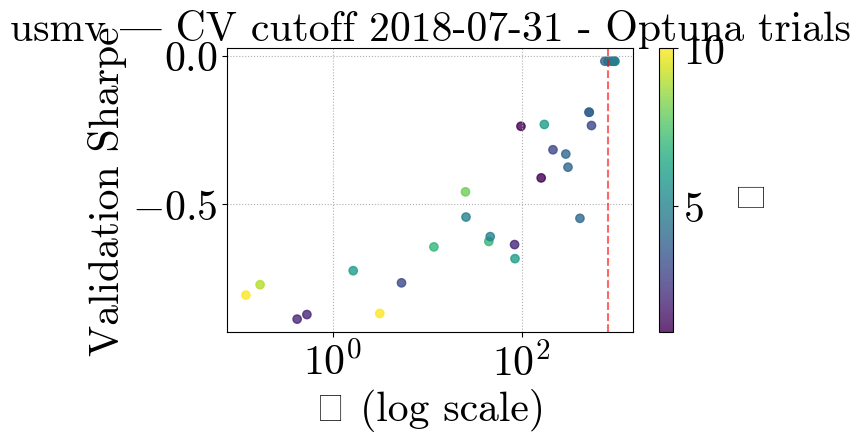

[I 2025-04-21 21:33:18,667] A new study created in memory with name: no-name-1599045a-ad16-472d-a51b-8b02471ca63e
[I 2025-04-21 21:33:26,895] Trial 0 finished with value: -0.21401473514511918 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.21401473514511918.
[I 2025-04-21 21:33:30,573] Trial 1 finished with value: 0.3707010983067702 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3707010983067702.
[I 2025-04-21 21:33:49,170] Trial 2 finished with value: -0.5213707766275161 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3707010983067702.
[I 2025-04-21 21:34:02,128] Trial 3 finished with value: -0.4908703067154476 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3707010983067702.
[I 2025-04-21 21:34:06,840] Trial 4 finished with value: -0.8266451421044189 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=470.0331, κ=4, Sharpe=0.8659


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


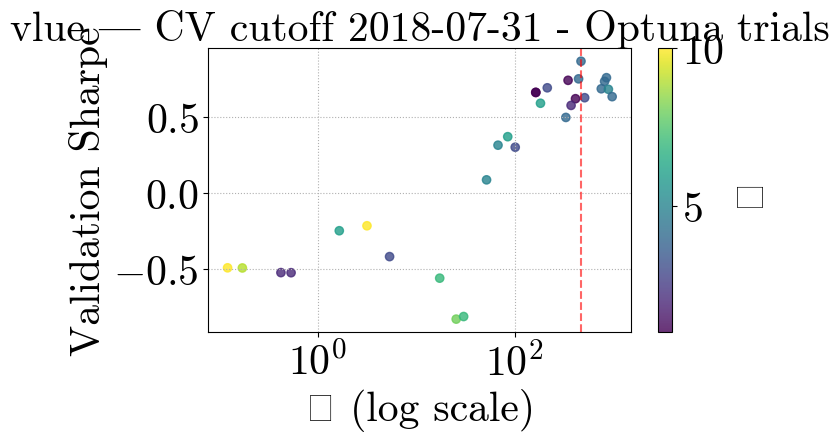

[I 2025-04-21 21:35:55,091] A new study created in memory with name: no-name-42c90bbb-fbbe-4e88-a5e5-2854e7d6a242
[I 2025-04-21 21:35:59,187] Trial 0 finished with value: 0.2120913846878009 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.2120913846878009.
[I 2025-04-21 21:36:03,582] Trial 1 finished with value: 0.5055235865242429 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5055235865242429.
[I 2025-04-21 21:36:19,542] Trial 2 finished with value: -0.4187786665266512 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5055235865242429.
[I 2025-04-21 21:36:26,333] Trial 3 finished with value: 0.10018952309945654 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5055235865242429.
[I 2025-04-21 21:36:30,759] Trial 4 finished with value: 0.42222025204789904 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=62.6792, κ=4, Sharpe=0.8553


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


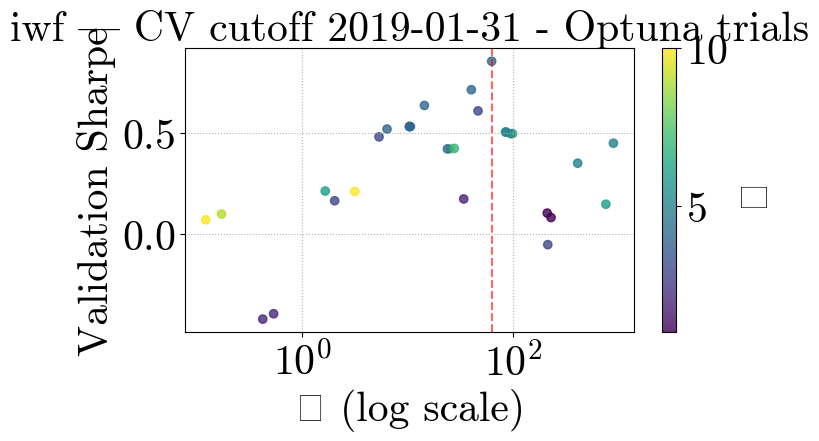

[I 2025-04-21 21:38:55,164] A new study created in memory with name: no-name-8e5cc732-8707-476f-b74b-0569aa90212e
[I 2025-04-21 21:39:03,754] Trial 0 finished with value: 0.7315918850546855 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.7315918850546855.
[I 2025-04-21 21:39:09,867] Trial 1 finished with value: 1.1688029429816051 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.1688029429816051.
[I 2025-04-21 21:39:25,773] Trial 2 finished with value: -0.07464279753669098 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.1688029429816051.
[I 2025-04-21 21:39:34,101] Trial 3 finished with value: 0.17610244014419482 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.1688029429816051.
[I 2025-04-21 21:39:37,734] Trial 4 finished with value: 1.0242749609880244 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=43.1551, κ=8, Sharpe=1.4055


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


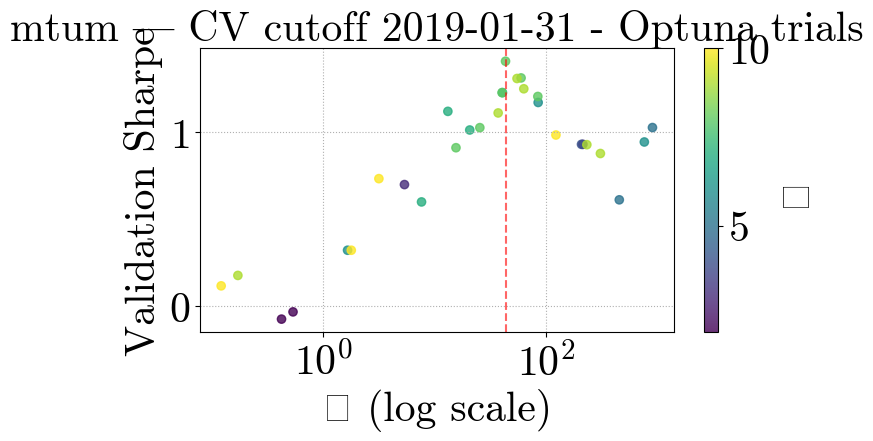

[I 2025-04-21 21:41:48,001] A new study created in memory with name: no-name-d58215de-0cfb-4fc9-b35c-200463763453
[I 2025-04-21 21:41:54,057] Trial 0 finished with value: -0.5980073672448784 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5980073672448784.
[I 2025-04-21 21:41:57,392] Trial 1 finished with value: 0.0003956775178983422 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.0003956775178983422.
[I 2025-04-21 21:42:07,029] Trial 2 finished with value: -0.7519062044374694 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.0003956775178983422.
[I 2025-04-21 21:42:13,592] Trial 3 finished with value: -0.7321932697488956 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.0003956775178983422.
[I 2025-04-21 21:42:18,902] Trial 4 finished with value: -0.39439674949416004 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}.

Optuna best λ=252.6009, κ=5, Sharpe=0.1415


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


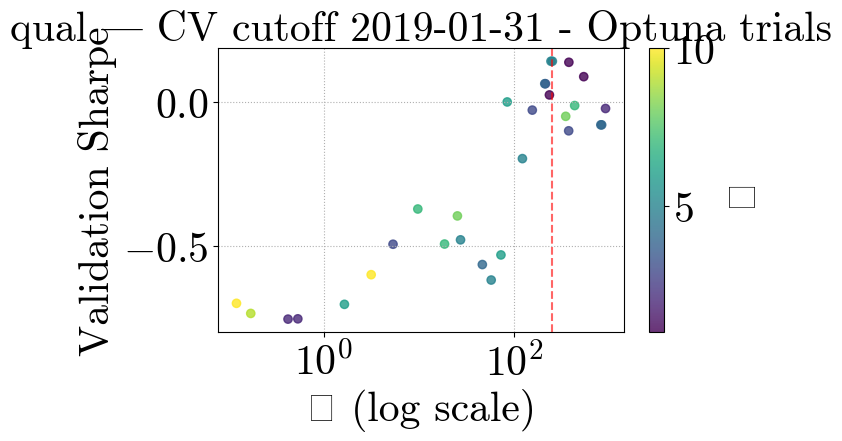

[I 2025-04-21 21:44:16,862] A new study created in memory with name: no-name-deec0682-dc1f-48ec-b304-7313e729710d
[I 2025-04-21 21:44:27,513] Trial 0 finished with value: -0.17307446292461764 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.17307446292461764.
[I 2025-04-21 21:44:32,278] Trial 1 finished with value: -0.11749427493861034 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.11749427493861034.
[I 2025-04-21 21:44:50,508] Trial 2 finished with value: 0.34897167574943927 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.34897167574943927.
[I 2025-04-21 21:45:07,235] Trial 3 finished with value: 0.04989699173632433 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.34897167574943927.
[I 2025-04-21 21:45:15,938] Trial 4 finished with value: 0.34386684214262303 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best

Optuna best λ=0.4208, κ=2, Sharpe=0.3490


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


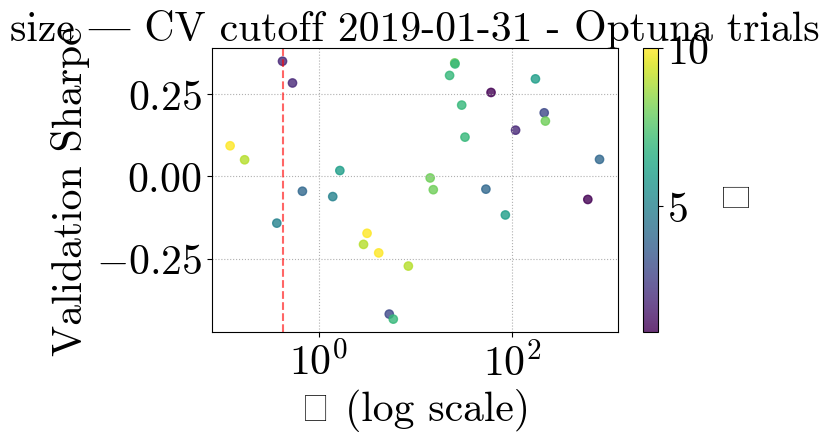

[I 2025-04-21 21:48:09,719] A new study created in memory with name: no-name-76a012de-6ae8-44dd-8e78-8b1c8552d78b
[I 2025-04-21 21:48:16,311] Trial 0 finished with value: -1.0387326457264605 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -1.0387326457264605.
[I 2025-04-21 21:48:23,458] Trial 1 finished with value: -0.5854289002947112 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.5854289002947112.
[I 2025-04-21 21:48:30,980] Trial 2 finished with value: -0.8524420054031856 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.5854289002947112.
[I 2025-04-21 21:48:40,058] Trial 3 finished with value: -0.9161210311554092 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.5854289002947112.
[I 2025-04-21 21:48:46,308] Trial 4 finished with value: -0.20757033284392332 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=613.5465, κ=5, Sharpe=0.0194


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


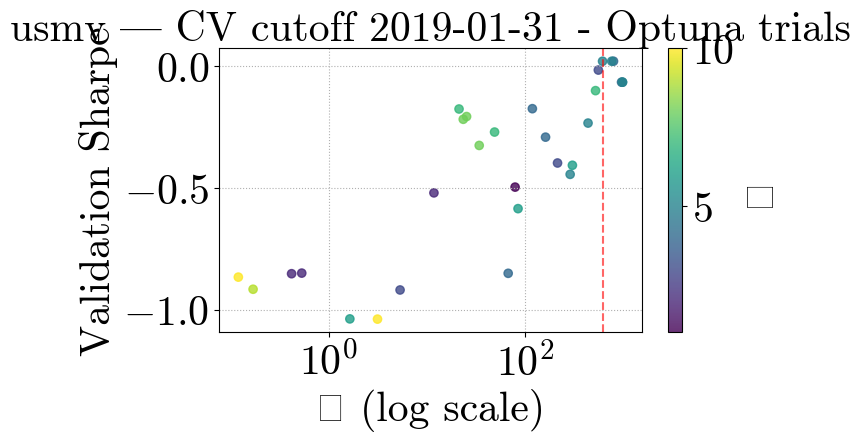

[I 2025-04-21 21:50:47,643] A new study created in memory with name: no-name-00c29ab9-3747-47bb-9d32-5aa9b7568c2d
[I 2025-04-21 21:50:53,970] Trial 0 finished with value: 0.27871623166744963 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.27871623166744963.
[I 2025-04-21 21:50:57,895] Trial 1 finished with value: 0.4029393934078106 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.4029393934078106.
[I 2025-04-21 21:51:20,194] Trial 2 finished with value: -0.5933390133320097 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.4029393934078106.
[I 2025-04-21 21:51:29,122] Trial 3 finished with value: -0.3951786688308117 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.4029393934078106.
[I 2025-04-21 21:51:33,056] Trial 4 finished with value: -0.33824335384570503 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=114.0838, κ=1, Sharpe=0.7713


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


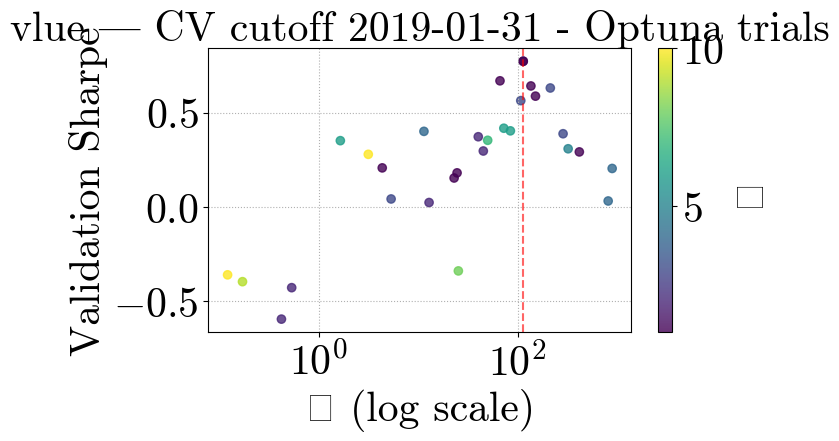

[I 2025-04-21 21:53:25,417] A new study created in memory with name: no-name-8f2a2631-0511-4fce-83bd-9f758a902b26
[I 2025-04-21 21:53:31,628] Trial 0 finished with value: 0.6901783276664497 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.6901783276664497.
[I 2025-04-21 21:53:36,032] Trial 1 finished with value: 1.042069778374506 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.042069778374506.
[I 2025-04-21 21:53:51,588] Trial 2 finished with value: 0.1425459321902049 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.042069778374506.
[I 2025-04-21 21:53:57,667] Trial 3 finished with value: 0.7933325818332748 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.042069778374506.
[I 2025-04-21 21:54:02,278] Trial 4 finished with value: 0.925334012744224 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 with v

Optuna best λ=20.3750, κ=4, Sharpe=1.0582


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


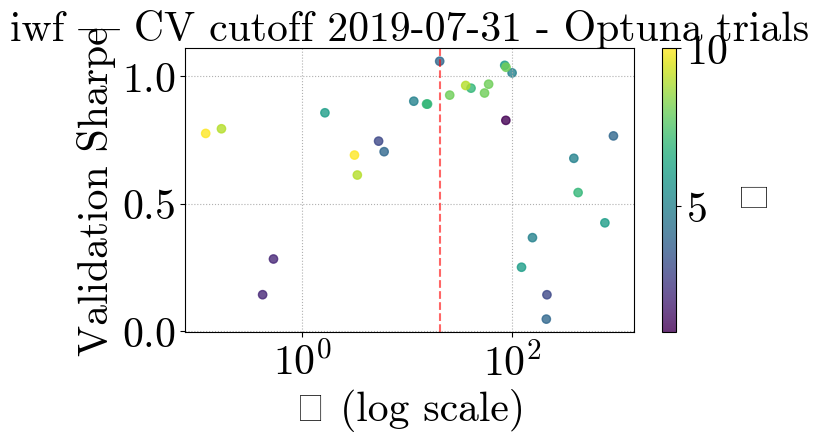

[I 2025-04-21 21:56:31,584] A new study created in memory with name: no-name-4eec5f65-30ea-4e54-a5e1-d4c8be7d166c
[I 2025-04-21 21:56:40,433] Trial 0 finished with value: 1.132168292786096 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 1.132168292786096.
[I 2025-04-21 21:56:47,443] Trial 1 finished with value: 1.1921107968644253 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.1921107968644253.
[I 2025-04-21 21:57:02,075] Trial 2 finished with value: 0.5758849653482596 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.1921107968644253.
[I 2025-04-21 21:57:07,900] Trial 3 finished with value: 0.950664615301435 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.1921107968644253.
[I 2025-04-21 21:57:12,358] Trial 4 finished with value: 1.1519200636579425 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 with

Optuna best λ=41.2798, κ=3, Sharpe=1.5500


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


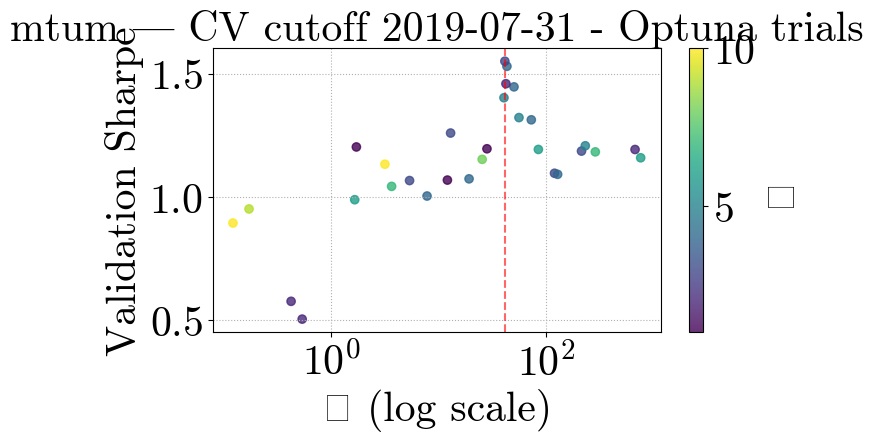

[I 2025-04-21 21:59:15,910] A new study created in memory with name: no-name-3eea4d82-1fc4-4ed8-900d-9f899b79c49b
[I 2025-04-21 21:59:23,739] Trial 0 finished with value: -0.36490577617888276 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.36490577617888276.
[I 2025-04-21 21:59:28,092] Trial 1 finished with value: 0.2815808921066176 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.2815808921066176.
[I 2025-04-21 21:59:38,131] Trial 2 finished with value: -1.1560760298445156 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.2815808921066176.
[I 2025-04-21 21:59:45,272] Trial 3 finished with value: -1.0377344981441 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.2815808921066176.
[I 2025-04-21 21:59:51,109] Trial 4 finished with value: -0.037898590815526774 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=326.6630, κ=1, Sharpe=0.8851


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


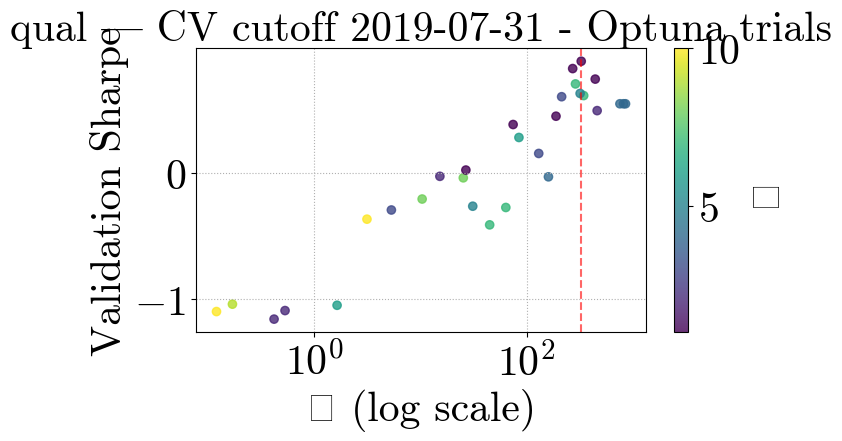

[I 2025-04-21 22:01:59,116] A new study created in memory with name: no-name-c4b6d079-97d3-4eec-874c-7a5897b6e83b
[I 2025-04-21 22:02:04,691] Trial 0 finished with value: -0.2701051875808055 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2701051875808055.
[I 2025-04-21 22:02:10,399] Trial 1 finished with value: -0.24154550878550235 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.24154550878550235.
[I 2025-04-21 22:02:26,531] Trial 2 finished with value: 0.021484316601685625 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.021484316601685625.
[I 2025-04-21 22:02:34,802] Trial 3 finished with value: -0.18479052425081852 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.021484316601685625.
[I 2025-04-21 22:02:39,388] Trial 4 finished with value: 0.13930310988477912 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Be

Optuna best λ=666.8601, κ=8, Sharpe=0.3546


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


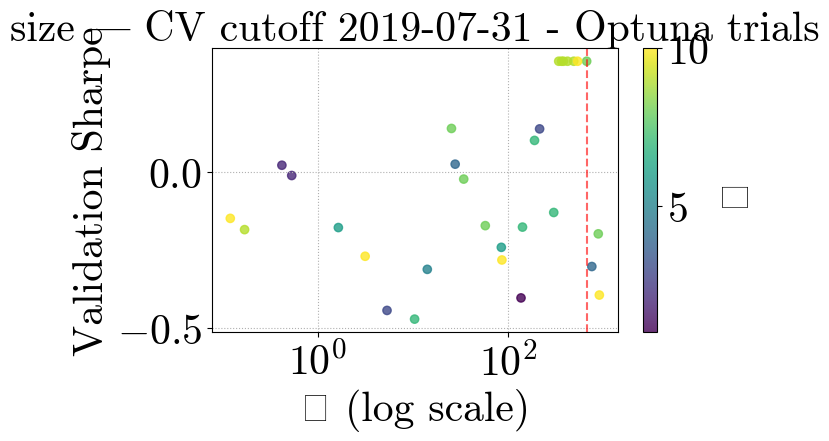

[I 2025-04-21 22:04:39,298] A new study created in memory with name: no-name-c093ec3d-ec72-4c7b-8e5b-2e53602b1eb7
[I 2025-04-21 22:04:48,642] Trial 0 finished with value: -1.298042735782736 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -1.298042735782736.
[I 2025-04-21 22:04:53,909] Trial 1 finished with value: -0.8620969311359962 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.8620969311359962.
[I 2025-04-21 22:05:02,806] Trial 2 finished with value: -1.0657930213443727 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.8620969311359962.
[I 2025-04-21 22:05:10,334] Trial 3 finished with value: -1.1741854583702438 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.8620969311359962.
[I 2025-04-21 22:05:16,825] Trial 4 finished with value: -0.7604547853986031 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=816.5528, κ=4, Sharpe=-0.0375


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


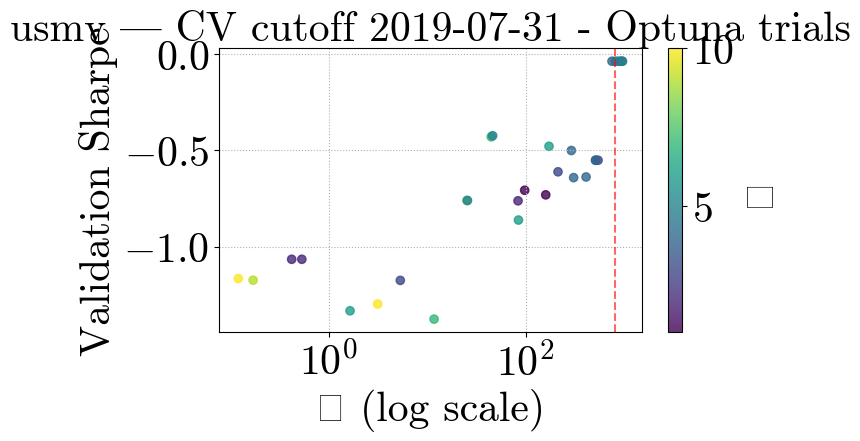

[I 2025-04-21 22:07:08,373] A new study created in memory with name: no-name-695b6f4f-055f-4dae-abf6-fd6f50f7a39c
[I 2025-04-21 22:07:16,850] Trial 0 finished with value: 0.732997362260648 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.732997362260648.
[I 2025-04-21 22:07:20,552] Trial 1 finished with value: 0.6126861849762453 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.732997362260648.
[I 2025-04-21 22:07:40,318] Trial 2 finished with value: -0.26606310246495946 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.732997362260648.
[I 2025-04-21 22:07:46,925] Trial 3 finished with value: -0.13442049320998595 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.732997362260648.
[I 2025-04-21 22:07:52,922] Trial 4 finished with value: 0.17188451105018632 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 w

Optuna best λ=3.1489, κ=10, Sharpe=0.7330


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


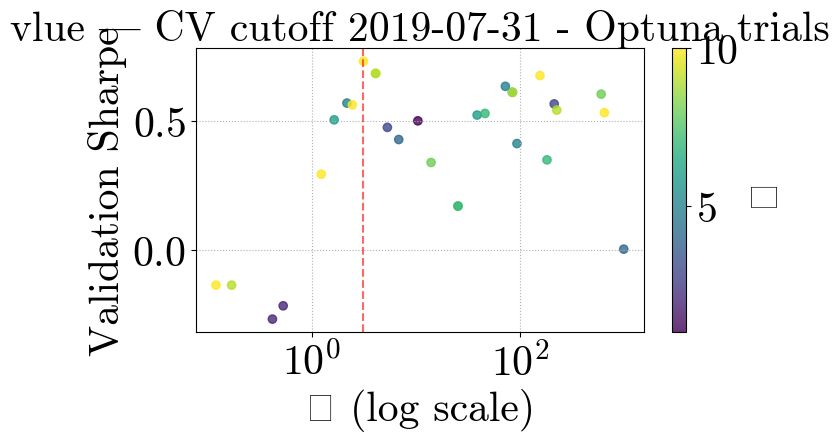

[I 2025-04-21 22:10:32,989] A new study created in memory with name: no-name-d8c71879-812a-4ba1-9526-fa72fc965165
[I 2025-04-21 22:10:39,098] Trial 0 finished with value: 0.7292118453215711 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.7292118453215711.
[I 2025-04-21 22:10:44,123] Trial 1 finished with value: 1.3252319233247603 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.3252319233247603.
[I 2025-04-21 22:10:59,324] Trial 2 finished with value: 0.5063173096348446 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.3252319233247603.
[I 2025-04-21 22:11:04,705] Trial 3 finished with value: 0.9790395992009842 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.3252319233247603.
[I 2025-04-21 22:11:09,261] Trial 4 finished with value: 1.2867524839360542 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 w

Optuna best λ=84.7180, κ=6, Sharpe=1.3252


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


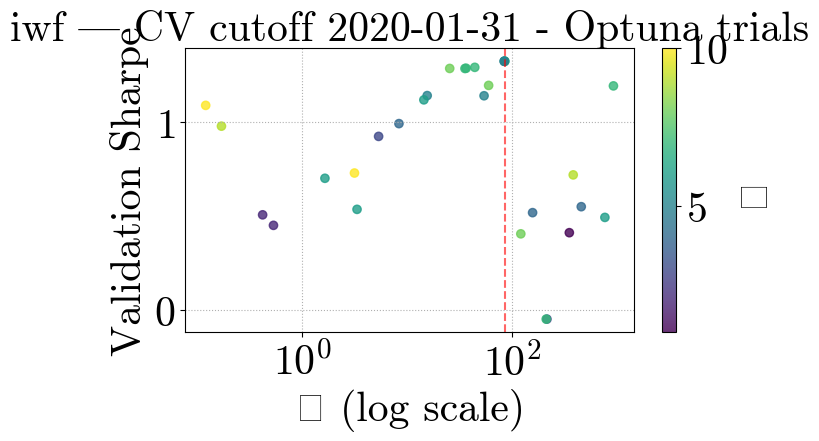

[I 2025-04-21 22:13:30,826] A new study created in memory with name: no-name-ce1df75d-23b3-457f-82e1-840e55b4b10f
[I 2025-04-21 22:13:36,658] Trial 0 finished with value: 0.8581051072941127 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.8581051072941127.
[I 2025-04-21 22:13:44,453] Trial 1 finished with value: 1.258413966653177 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.258413966653177.
[I 2025-04-21 22:13:57,078] Trial 2 finished with value: 0.44593004383378426 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.258413966653177.
[I 2025-04-21 22:14:04,169] Trial 3 finished with value: 0.7073009009465091 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.258413966653177.
[I 2025-04-21 22:14:07,947] Trial 4 finished with value: 1.4159401095445758 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 4 with

Optuna best λ=261.7735, κ=3, Sharpe=1.5699


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


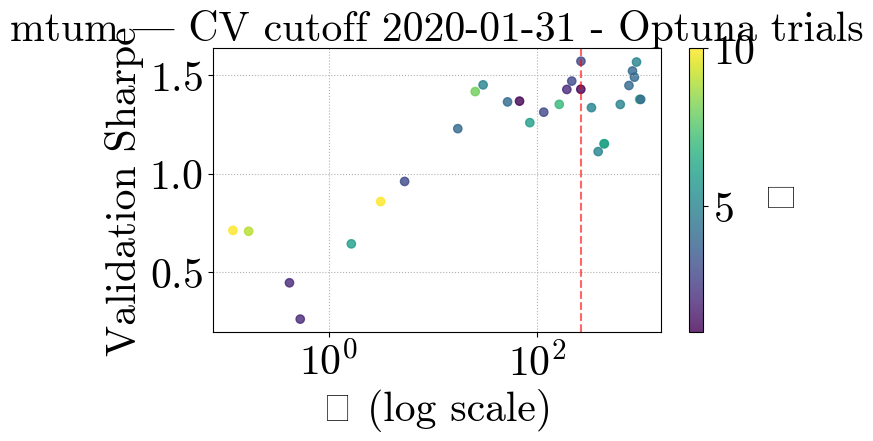

[I 2025-04-21 22:15:51,572] A new study created in memory with name: no-name-6feb4fff-d500-4f23-a0f2-3b803e7df4d7
[I 2025-04-21 22:15:58,761] Trial 0 finished with value: -0.47618559716354797 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.47618559716354797.
[I 2025-04-21 22:16:05,346] Trial 1 finished with value: 0.2082474641389886 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.2082474641389886.
[I 2025-04-21 22:16:20,510] Trial 2 finished with value: -1.2724790243963542 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.2082474641389886.
[I 2025-04-21 22:16:29,847] Trial 3 finished with value: -1.2651897305205257 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.2082474641389886.
[I 2025-04-21 22:16:34,108] Trial 4 finished with value: -0.016978080120860082 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=816.5528, κ=4, Sharpe=1.0645


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


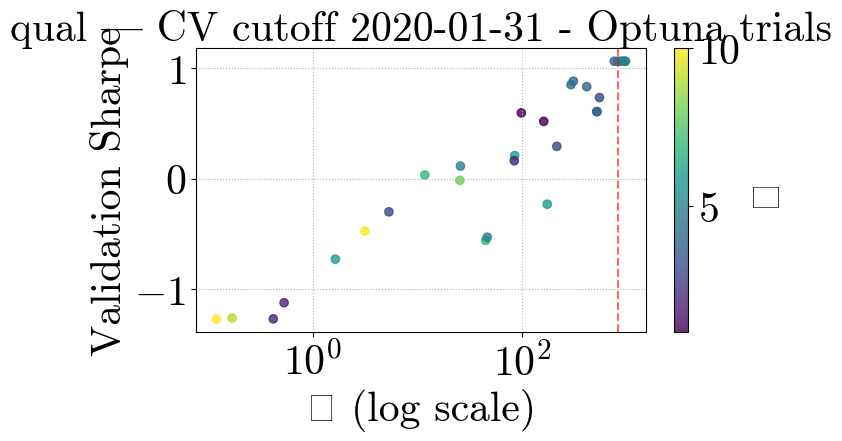

[I 2025-04-21 22:18:30,496] A new study created in memory with name: no-name-94c6e9c4-21b9-4f81-8fe6-c70f17248bcf
[I 2025-04-21 22:18:37,687] Trial 0 finished with value: -0.5508285657666059 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5508285657666059.
[I 2025-04-21 22:18:44,616] Trial 1 finished with value: -0.3135104917837143 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.3135104917837143.
[I 2025-04-21 22:18:55,169] Trial 2 finished with value: -0.3558515304782756 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.3135104917837143.
[I 2025-04-21 22:19:05,989] Trial 3 finished with value: -0.32862110809120426 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.3135104917837143.
[I 2025-04-21 22:19:09,266] Trial 4 finished with value: -0.06170115174248597 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=816.5528, κ=4, Sharpe=0.3505


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


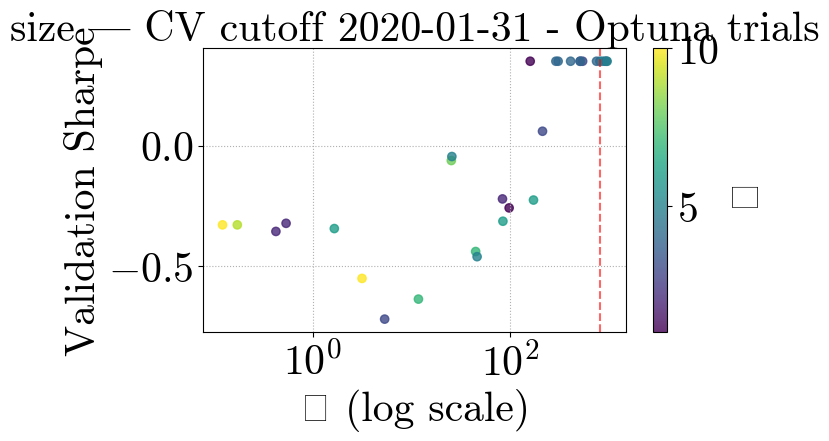

[I 2025-04-21 22:20:52,984] A new study created in memory with name: no-name-c1ca10a5-0121-4da9-b175-d9530edbedd1
[I 2025-04-21 22:21:02,100] Trial 0 finished with value: -1.0425675891530566 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -1.0425675891530566.
[I 2025-04-21 22:21:06,014] Trial 1 finished with value: -0.4898127255165041 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.4898127255165041.
[I 2025-04-21 22:21:13,868] Trial 2 finished with value: -0.4498918084145136 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.4498918084145136.
[I 2025-04-21 22:21:20,733] Trial 3 finished with value: -0.6893956505444941 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -0.4498918084145136.
[I 2025-04-21 22:21:28,907] Trial 4 finished with value: -0.40504591646970156 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=816.5528, κ=4, Sharpe=0.5336


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


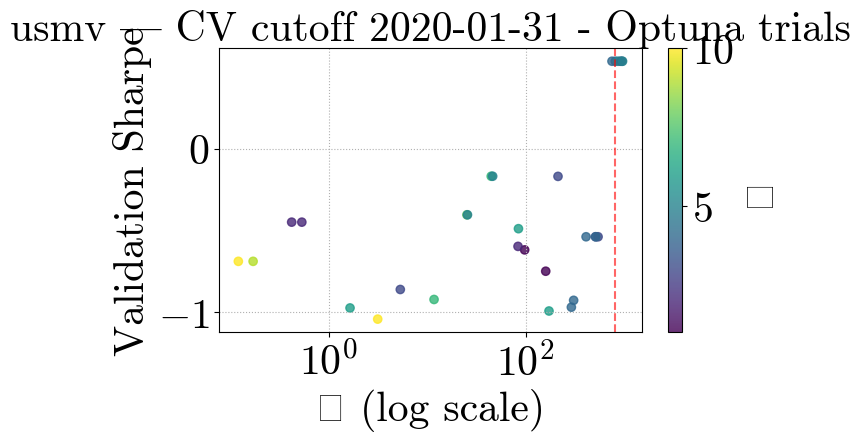

[I 2025-04-21 22:23:07,142] A new study created in memory with name: no-name-bd0b3459-ef8d-41fe-aab2-50c45915a6ec
[I 2025-04-21 22:23:16,067] Trial 0 finished with value: 0.17976822445922555 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.17976822445922555.
[I 2025-04-21 22:23:20,158] Trial 1 finished with value: -0.8115231462983625 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.17976822445922555.
[I 2025-04-21 22:23:54,922] Trial 2 finished with value: -0.23485544002218425 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.17976822445922555.
[I 2025-04-21 22:24:04,087] Trial 3 finished with value: -0.2413521048412248 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.17976822445922555.
[I 2025-04-21 22:24:09,124] Trial 4 finished with value: -1.2635764959634328 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=1.6480, κ=6, Sharpe=0.3493


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


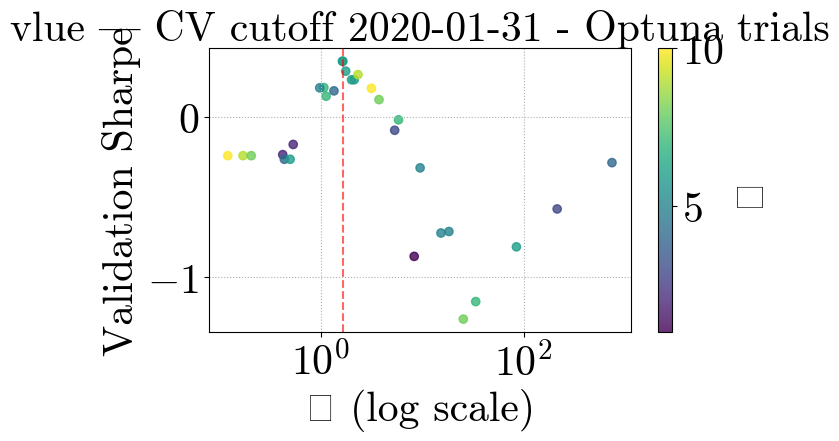

[I 2025-04-21 22:28:25,965] A new study created in memory with name: no-name-3777011d-1f19-496c-babf-f98858d9b2af
[I 2025-04-21 22:28:31,489] Trial 0 finished with value: 0.7444323403049761 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.7444323403049761.
[I 2025-04-21 22:28:37,231] Trial 1 finished with value: 1.3348782424943253 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 1.3348782424943253.
[I 2025-04-21 22:29:00,479] Trial 2 finished with value: 0.4681166958682235 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 1.3348782424943253.
[I 2025-04-21 22:29:09,284] Trial 3 finished with value: 0.9360612066708704 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 1.3348782424943253.
[I 2025-04-21 22:29:15,371] Trial 4 finished with value: 0.8560264673678946 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 w

Optuna best λ=106.4292, κ=4, Sharpe=1.3666


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


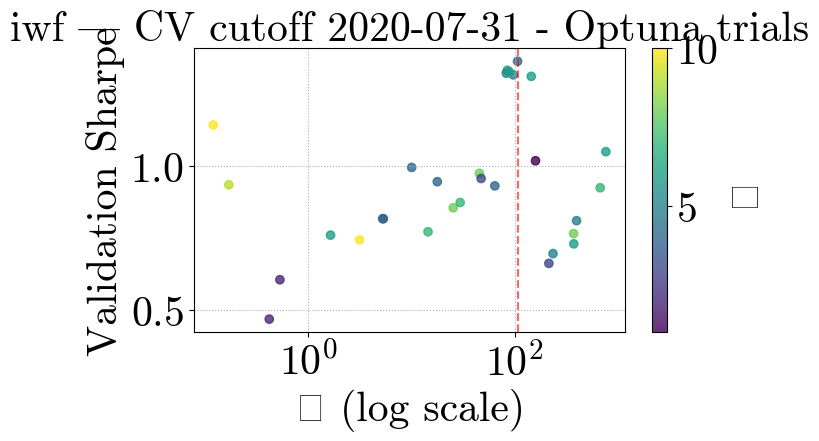

[I 2025-04-21 22:32:06,913] A new study created in memory with name: no-name-5c6c2e26-668d-4585-962e-75fa8ab6807b
[I 2025-04-21 22:32:16,235] Trial 0 finished with value: 0.389207044159445 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.389207044159445.
[I 2025-04-21 22:32:24,811] Trial 1 finished with value: 0.7095821831665561 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.7095821831665561.
[I 2025-04-21 22:32:38,342] Trial 2 finished with value: 0.18327948215361836 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.7095821831665561.
[I 2025-04-21 22:32:47,922] Trial 3 finished with value: 0.20493341001169632 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.7095821831665561.
[I 2025-04-21 22:32:53,548] Trial 4 finished with value: 0.5782637994191813 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 w

Optuna best λ=623.9182, κ=4, Sharpe=1.1379


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


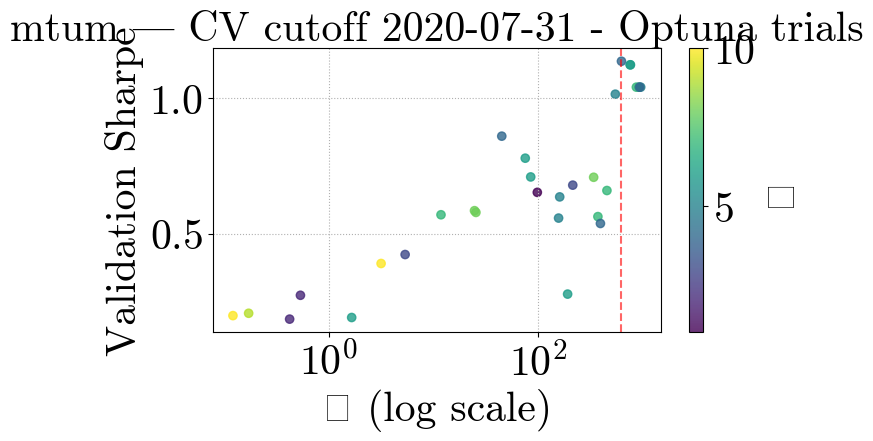

[I 2025-04-21 22:34:48,633] A new study created in memory with name: no-name-137f96e0-1c19-4cdb-87cf-a8f541d886f1
[I 2025-04-21 22:34:57,504] Trial 0 finished with value: 0.28978424739260455 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.28978424739260455.
[I 2025-04-21 22:35:01,574] Trial 1 finished with value: 0.12472795290533492 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.28978424739260455.
[I 2025-04-21 22:35:16,091] Trial 2 finished with value: 0.34598371756401103 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.34598371756401103.
[I 2025-04-21 22:35:31,187] Trial 3 finished with value: 0.173661323978851 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.34598371756401103.
[I 2025-04-21 22:35:39,328] Trial 4 finished with value: 0.34744858485917995 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=727.8681, κ=7, Sharpe=0.6925


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


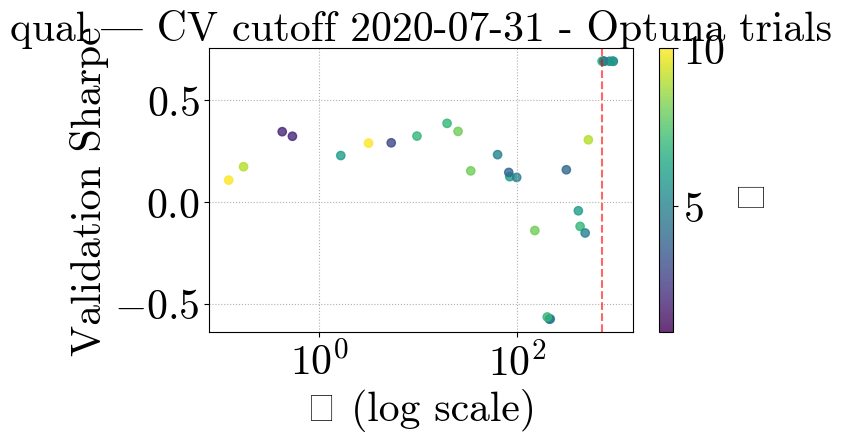

[I 2025-04-21 22:38:34,985] A new study created in memory with name: no-name-5cff6651-fe7b-48c0-881e-a5dbab254224
[I 2025-04-21 22:38:45,072] Trial 0 finished with value: -0.44706697966035525 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.44706697966035525.
[I 2025-04-21 22:38:50,929] Trial 1 finished with value: -0.30663957873278713 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.30663957873278713.
[I 2025-04-21 22:39:04,265] Trial 2 finished with value: -0.20320640030090512 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.20320640030090512.
[I 2025-04-21 22:39:14,462] Trial 3 finished with value: -0.1067383614498174 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: -0.1067383614498174.
[I 2025-04-21 22:39:23,058] Trial 4 finished with value: -0.24652493241028228 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. B

Optuna best λ=444.3034, κ=4, Sharpe=0.5770


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


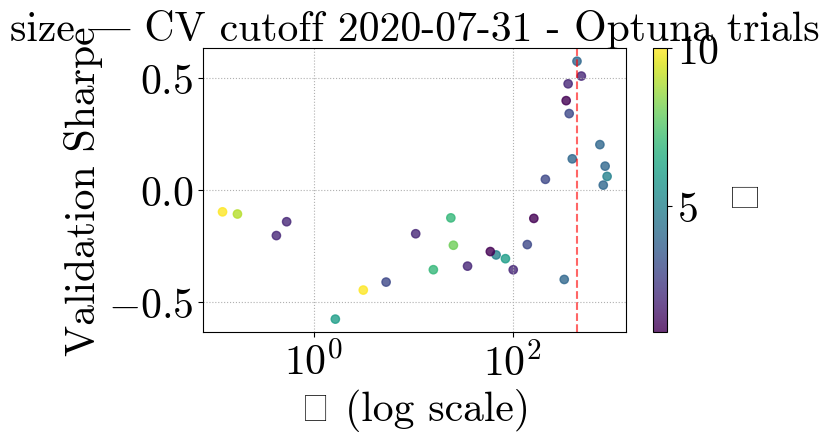

[I 2025-04-21 22:41:20,266] A new study created in memory with name: no-name-33a8c2cf-851d-42b0-a12c-bb0bca3485bd
[I 2025-04-21 22:41:31,655] Trial 0 finished with value: -0.47464333397980385 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.47464333397980385.
[I 2025-04-21 22:41:35,071] Trial 1 finished with value: -1.0692487604857248 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.47464333397980385.
[I 2025-04-21 22:41:45,083] Trial 2 finished with value: 0.14674941972097463 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.14674941972097463.
[I 2025-04-21 22:41:54,402] Trial 3 finished with value: -0.09734224324279891 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.14674941972097463.
[I 2025-04-21 22:42:03,731] Trial 4 finished with value: -0.17193784414160504 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=0.4208, κ=2, Sharpe=0.1467


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


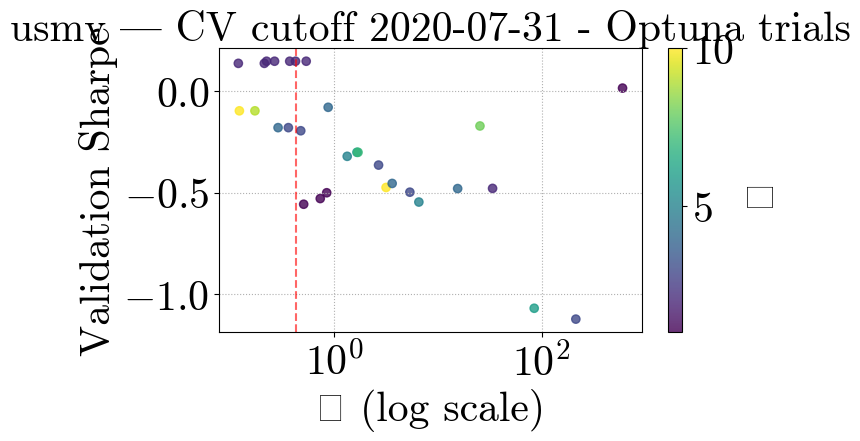

[I 2025-04-21 22:45:36,854] A new study created in memory with name: no-name-ac411969-8de0-444e-a2c2-af898a8b0de4
[I 2025-04-21 22:45:47,833] Trial 0 finished with value: 0.32877392020446844 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.32877392020446844.
[I 2025-04-21 22:45:51,436] Trial 1 finished with value: -0.9876821869944924 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.32877392020446844.
[I 2025-04-21 22:46:14,426] Trial 2 finished with value: -0.5103377099582137 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.32877392020446844.
[I 2025-04-21 22:46:23,346] Trial 3 finished with value: 0.22567304156791426 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.32877392020446844.
[I 2025-04-21 22:46:27,561] Trial 4 finished with value: -0.9773581028624416 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=3.1489, κ=10, Sharpe=0.3288


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


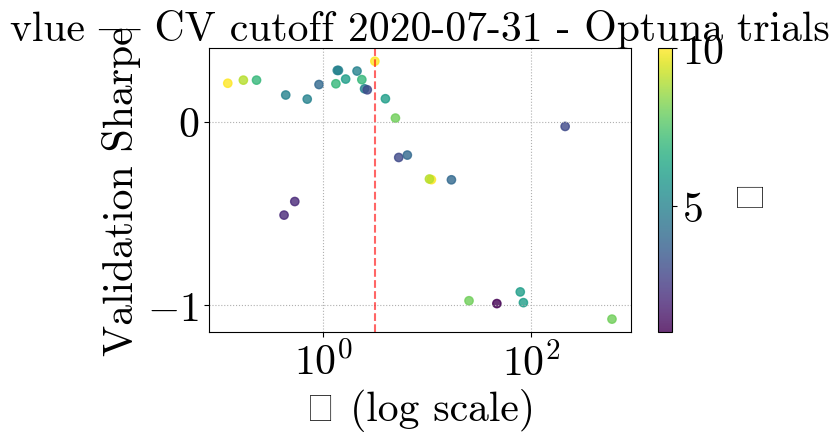

[I 2025-04-21 22:50:45,998] A new study created in memory with name: no-name-17247f38-a0b1-41fc-b018-42e644b2d63c
[I 2025-04-21 22:50:51,017] Trial 0 finished with value: 0.32635107863201446 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.32635107863201446.
[I 2025-04-21 22:50:56,729] Trial 1 finished with value: 0.6975241645898158 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.6975241645898158.
[I 2025-04-21 22:51:17,854] Trial 2 finished with value: 0.24176411147801366 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.6975241645898158.
[I 2025-04-21 22:51:27,513] Trial 3 finished with value: 0.6100492678053907 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.6975241645898158.
[I 2025-04-21 22:51:33,495] Trial 4 finished with value: 0.473426416200569 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1

Optuna best λ=453.2702, κ=7, Sharpe=1.1168


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


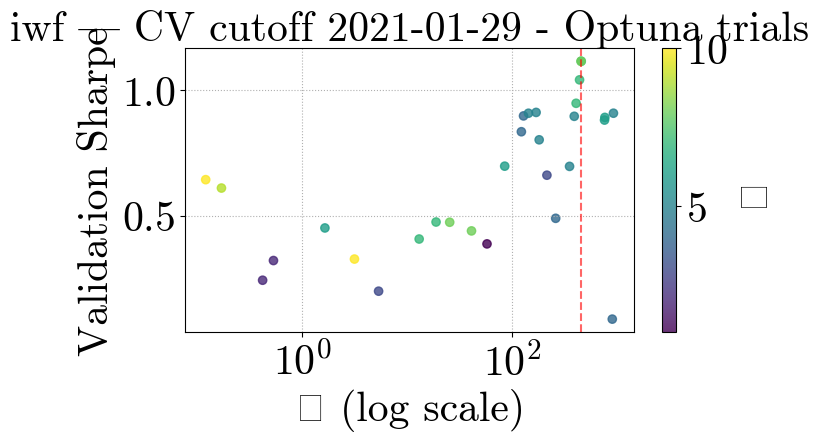

[I 2025-04-21 22:53:39,106] A new study created in memory with name: no-name-2874299d-4d6a-40cb-a962-d2749b6595fd
[I 2025-04-21 22:53:51,735] Trial 0 finished with value: -0.2473365854073704 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2473365854073704.
[I 2025-04-21 22:53:59,406] Trial 1 finished with value: 0.3891948144973921 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3891948144973921.
[I 2025-04-21 22:54:13,741] Trial 2 finished with value: -0.6675284879006946 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3891948144973921.
[I 2025-04-21 22:54:28,418] Trial 3 finished with value: -0.5591907082132564 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3891948144973921.
[I 2025-04-21 22:54:33,684] Trial 4 finished with value: 0.1304114666481181 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=760.6194, κ=6, Sharpe=0.5822


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


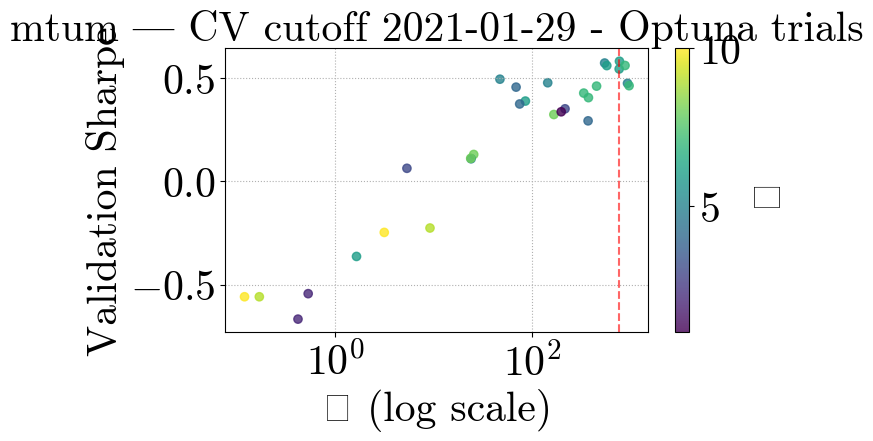

[I 2025-04-21 22:56:32,296] A new study created in memory with name: no-name-83ced504-56ff-497a-94ca-fbe37bc20305
[I 2025-04-21 22:56:38,328] Trial 0 finished with value: 0.2641972296085526 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.2641972296085526.
[I 2025-04-21 22:56:45,170] Trial 1 finished with value: 0.30232970585287533 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.30232970585287533.
[I 2025-04-21 22:56:57,038] Trial 2 finished with value: 0.47484783760735005 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.47484783760735005.
[I 2025-04-21 22:57:05,099] Trial 3 finished with value: 0.429575919894748 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.47484783760735005.
[I 2025-04-21 22:57:10,303] Trial 4 finished with value: 0.5146498626725331 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=755.3504, κ=1, Sharpe=0.6023


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


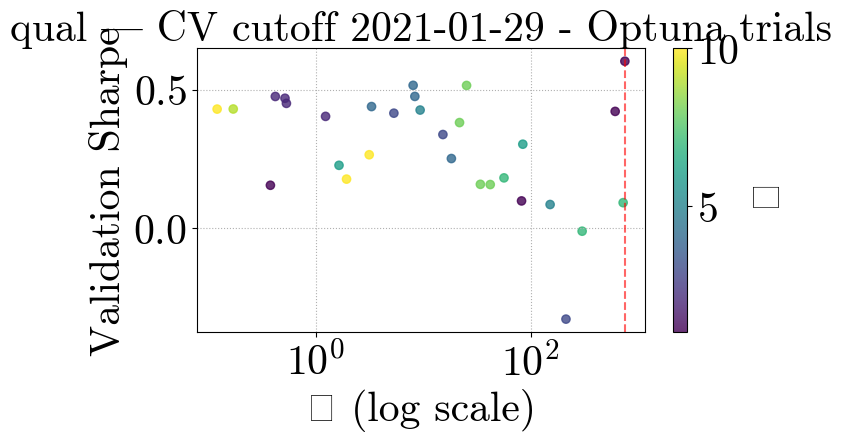

[I 2025-04-21 22:59:57,753] A new study created in memory with name: no-name-aafb3797-bc8b-48e7-a28e-6fbb440e3d12
[I 2025-04-21 23:00:09,689] Trial 0 finished with value: -0.3235322732099379 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3235322732099379.
[I 2025-04-21 23:00:15,201] Trial 1 finished with value: -0.18889845896587712 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.18889845896587712.
[I 2025-04-21 23:00:29,426] Trial 2 finished with value: 0.1203436683809899 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.1203436683809899.
[I 2025-04-21 23:00:41,793] Trial 3 finished with value: 0.05134515981062441 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.1203436683809899.
[I 2025-04-21 23:00:48,204] Trial 4 finished with value: -0.20508048916458516 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=481.4915, κ=2, Sharpe=0.5991


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


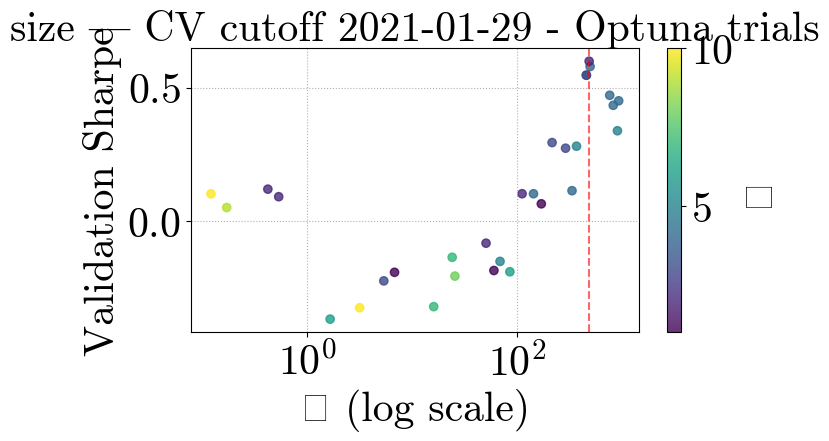

[I 2025-04-21 23:02:39,708] A new study created in memory with name: no-name-084ccf42-03ef-4d50-bc50-6fd1e8411a3d
[I 2025-04-21 23:02:48,449] Trial 0 finished with value: -0.2694070352787947 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2694070352787947.
[I 2025-04-21 23:02:52,873] Trial 1 finished with value: -0.7888992535880397 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.2694070352787947.
[I 2025-04-21 23:03:03,690] Trial 2 finished with value: 0.22150549713386103 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.22150549713386103.
[I 2025-04-21 23:03:08,522] Trial 3 finished with value: -0.21136663054145843 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.22150549713386103.
[I 2025-04-21 23:03:15,965] Trial 4 finished with value: 0.17921424719300136 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=0.5337, κ=2, Sharpe=0.2730


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


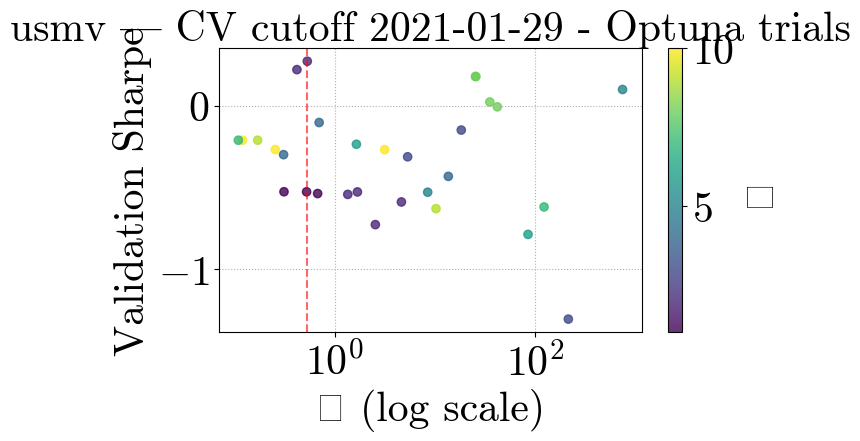

[I 2025-04-21 23:06:37,950] A new study created in memory with name: no-name-aada6c03-b5d0-4b57-a093-052896a06fa3
[I 2025-04-21 23:06:47,754] Trial 0 finished with value: 0.3010253766807714 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3010253766807714.
[I 2025-04-21 23:06:53,222] Trial 1 finished with value: -0.2113356977094397 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.3010253766807714.
[I 2025-04-21 23:07:07,736] Trial 2 finished with value: -0.2700562953743633 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.3010253766807714.
[I 2025-04-21 23:07:17,286] Trial 3 finished with value: 0.06623425650794662 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.3010253766807714.
[I 2025-04-21 23:07:22,185] Trial 4 finished with value: -1.1594364237748123 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=3.1489, κ=10, Sharpe=0.3010


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


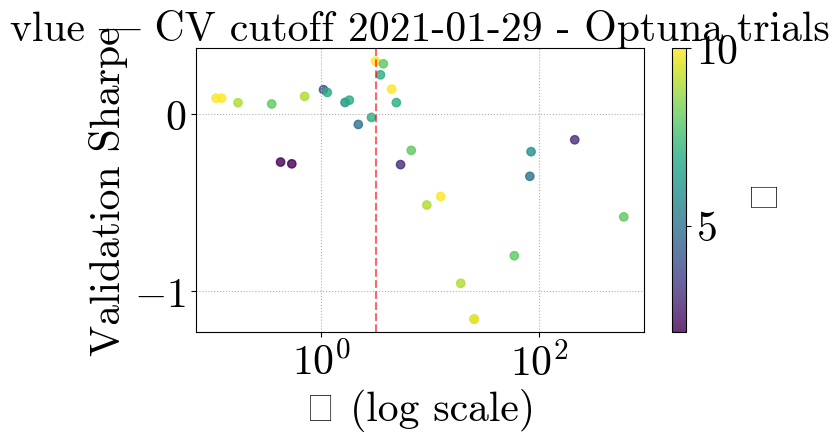

[I 2025-04-21 23:10:21,085] A new study created in memory with name: no-name-a9c19c34-6e63-4beb-9481-7bd7067d1d43
[I 2025-04-21 23:10:25,141] Trial 0 finished with value: 0.37411569764562935 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.37411569764562935.
[I 2025-04-21 23:10:33,039] Trial 1 finished with value: 0.520507693692608 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.520507693692608.
[I 2025-04-21 23:10:49,517] Trial 2 finished with value: 0.30535970627482645 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.520507693692608.
[I 2025-04-21 23:10:58,267] Trial 3 finished with value: 0.4834760809668147 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.520507693692608.
[I 2025-04-21 23:11:03,448] Trial 4 finished with value: 0.4243531631977557 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 1 wi

Optuna best λ=453.2702, κ=2, Sharpe=0.8402


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


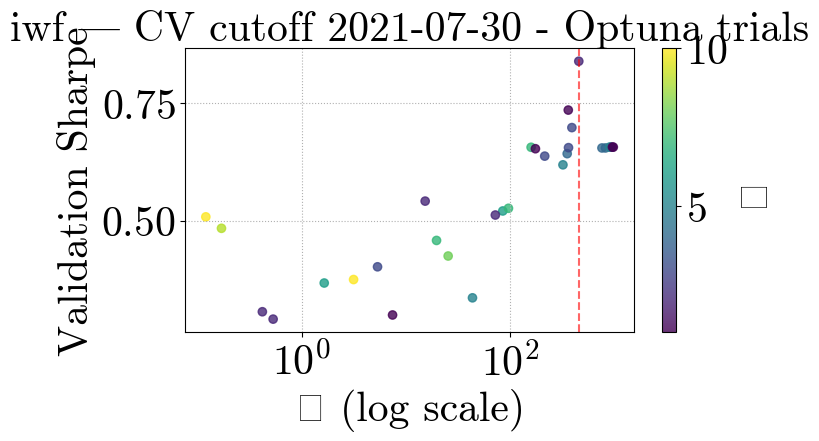

[I 2025-04-21 23:13:03,363] A new study created in memory with name: no-name-03cf8fdd-cb71-4aa8-922f-76e3c14a403c
[I 2025-04-21 23:13:09,310] Trial 0 finished with value: -0.41180305286477176 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.41180305286477176.
[I 2025-04-21 23:13:19,228] Trial 1 finished with value: -0.12773398980924175 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.12773398980924175.
[I 2025-04-21 23:13:30,135] Trial 2 finished with value: -0.5681927488884208 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.12773398980924175.
[I 2025-04-21 23:13:45,854] Trial 3 finished with value: -0.5172266882466265 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.12773398980924175.
[I 2025-04-21 23:13:50,257] Trial 4 finished with value: -0.2076054684466642 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Be

Optuna best λ=760.6194, κ=6, Sharpe=0.3036


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


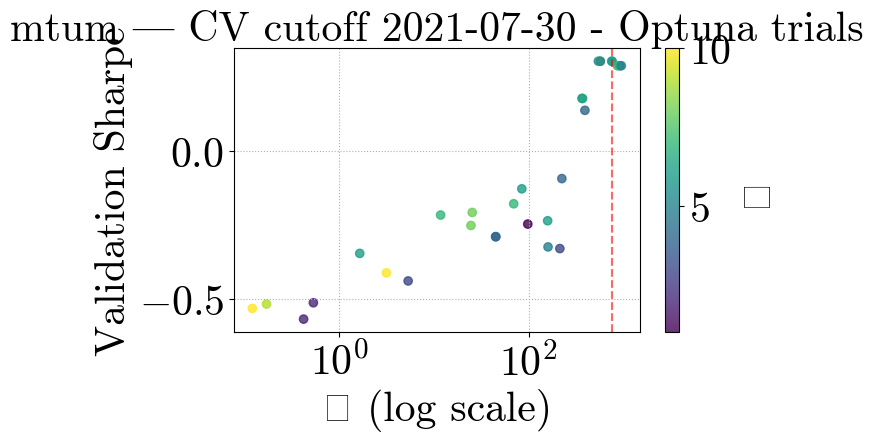

[I 2025-04-21 23:15:49,404] A new study created in memory with name: no-name-1abef19a-2f23-4e0c-8393-5f96688cd275
[I 2025-04-21 23:15:55,842] Trial 0 finished with value: 0.4735460177923035 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.4735460177923035.
[I 2025-04-21 23:16:01,542] Trial 1 finished with value: 0.4464990230970508 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.4735460177923035.
[I 2025-04-21 23:16:12,763] Trial 2 finished with value: 0.12965116741908075 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.4735460177923035.
[I 2025-04-21 23:16:20,476] Trial 3 finished with value: 0.1661905343896788 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.4735460177923035.
[I 2025-04-21 23:16:25,871] Trial 4 finished with value: 0.4936617467147247 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 4 

Optuna best λ=4.2007, κ=1, Sharpe=0.7183


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


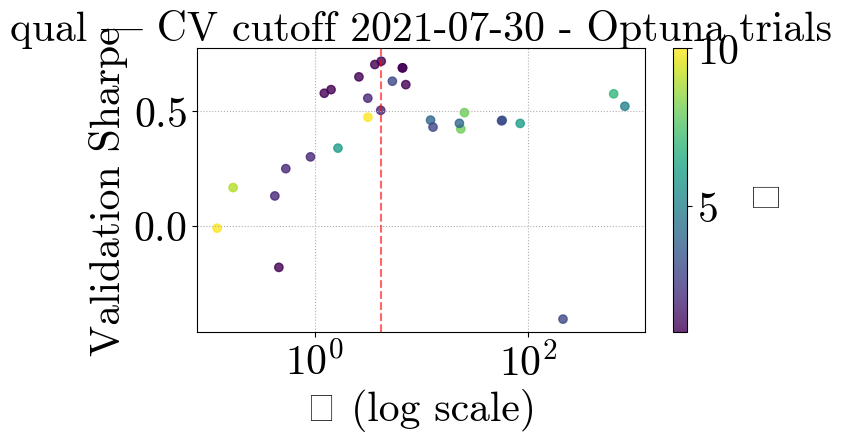

[I 2025-04-21 23:18:54,067] A new study created in memory with name: no-name-13d3ed52-dba2-4935-b530-dc5c57a6eeb5
[I 2025-04-21 23:19:09,753] Trial 0 finished with value: -0.3348111102184313 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3348111102184313.
[I 2025-04-21 23:19:15,111] Trial 1 finished with value: -0.30420127757162424 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.30420127757162424.
[I 2025-04-21 23:19:30,568] Trial 2 finished with value: 0.23104412602439026 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.23104412602439026.
[I 2025-04-21 23:19:37,588] Trial 3 finished with value: -0.014464488391272984 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.23104412602439026.
[I 2025-04-21 23:19:43,739] Trial 4 finished with value: -0.35168471605549645 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=436.2689, κ=5, Sharpe=0.5828


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


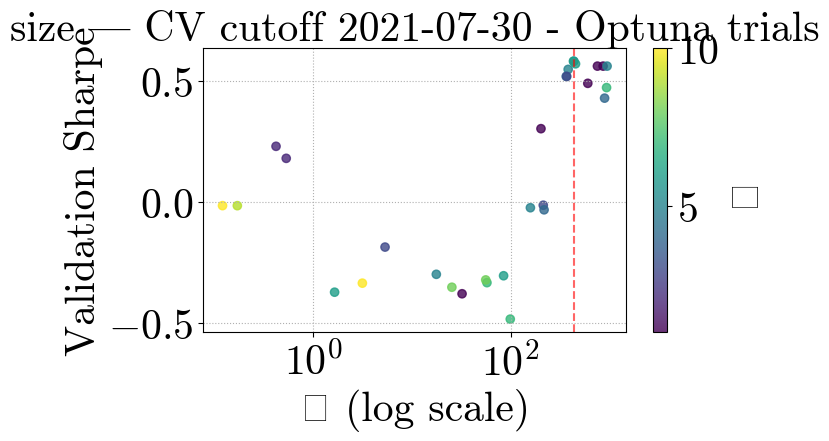

[I 2025-04-21 23:21:41,938] A new study created in memory with name: no-name-20942167-c480-4d16-b839-4be28aa57beb
[I 2025-04-21 23:21:51,227] Trial 0 finished with value: -0.044574771535125894 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.044574771535125894.
[I 2025-04-21 23:21:58,578] Trial 1 finished with value: -0.4354175180000724 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.044574771535125894.
[I 2025-04-21 23:22:15,807] Trial 2 finished with value: 0.3515540551460101 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.3515540551460101.
[I 2025-04-21 23:22:22,551] Trial 3 finished with value: 0.06614092777409769 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.3515540551460101.
[I 2025-04-21 23:22:29,058] Trial 4 finished with value: 0.5517266736312758 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=25.3782, κ=8, Sharpe=0.5517


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


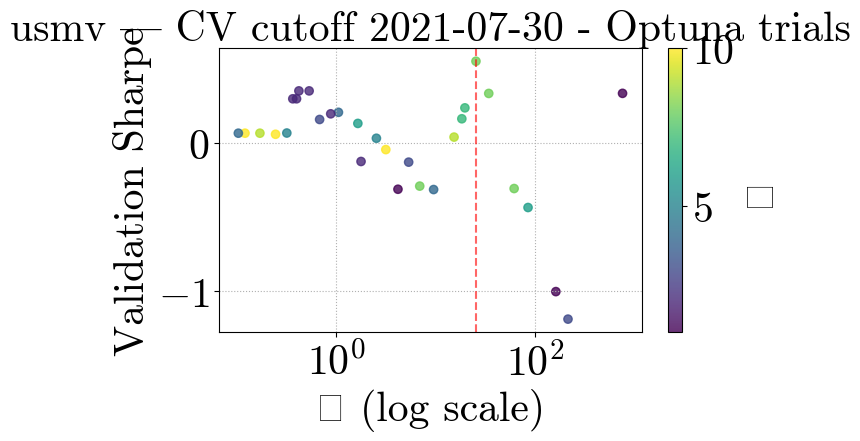

[I 2025-04-21 23:26:26,561] A new study created in memory with name: no-name-618d0bba-98e3-409b-bd50-63a5cc7974a8
[I 2025-04-21 23:26:38,915] Trial 0 finished with value: 0.3645553745570405 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3645553745570405.
[I 2025-04-21 23:26:45,238] Trial 1 finished with value: -0.4799843933463433 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.3645553745570405.
[I 2025-04-21 23:27:07,045] Trial 2 finished with value: 0.04976315825687781 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.3645553745570405.
[I 2025-04-21 23:27:18,672] Trial 3 finished with value: 0.4776370214507274 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: 0.4776370214507274.
[I 2025-04-21 23:27:25,373] Trial 4 finished with value: -0.6536079698960102 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=0.4723, κ=5, Sharpe=0.5845


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


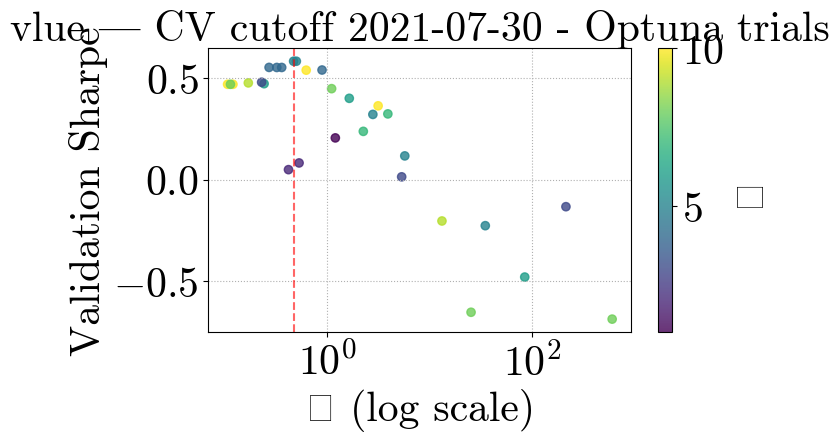

[I 2025-04-21 23:31:09,778] A new study created in memory with name: no-name-b8500600-d67b-485e-900e-2b1da4d74d0a
[I 2025-04-21 23:31:15,303] Trial 0 finished with value: 0.16695822598119278 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.16695822598119278.
[I 2025-04-21 23:31:18,861] Trial 1 finished with value: 0.282610450555628 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.282610450555628.
[I 2025-04-21 23:31:33,614] Trial 2 finished with value: -0.0004644865510305537 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.282610450555628.
[I 2025-04-21 23:31:45,356] Trial 3 finished with value: -0.005873469144544245 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.282610450555628.
[I 2025-04-21 23:31:51,579] Trial 4 finished with value: 0.26259804359021954 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=451.2429, κ=4, Sharpe=0.6322


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


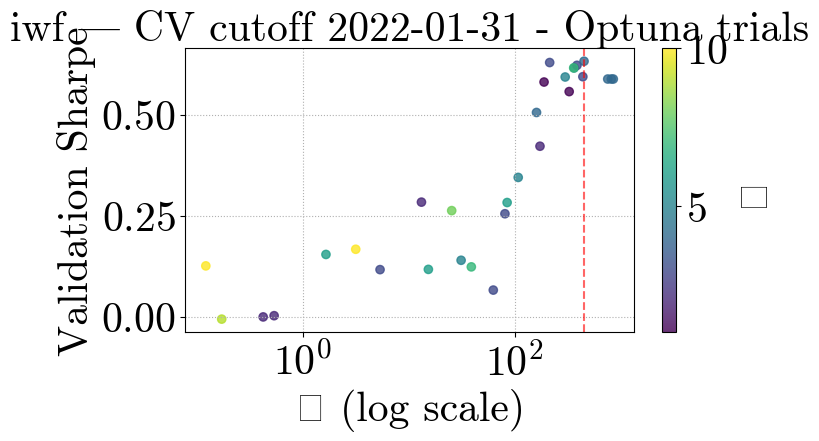

[I 2025-04-21 23:33:50,828] A new study created in memory with name: no-name-6d16cbcc-beaf-4427-bef1-2c9bd56ce371
[I 2025-04-21 23:33:57,231] Trial 0 finished with value: -0.2161033620870736 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2161033620870736.
[I 2025-04-21 23:34:06,409] Trial 1 finished with value: -0.000264577861592173 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.000264577861592173.
[I 2025-04-21 23:34:23,179] Trial 2 finished with value: -0.6034536508982578 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.000264577861592173.
[I 2025-04-21 23:34:31,266] Trial 3 finished with value: -0.42360117468324826 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.000264577861592173.
[I 2025-04-21 23:34:36,687] Trial 4 finished with value: -0.053765962211441726 and parameters: {'lambda': 25.37815508265662, 'kappa': 8

Optuna best λ=979.2531, κ=7, Sharpe=0.1030


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


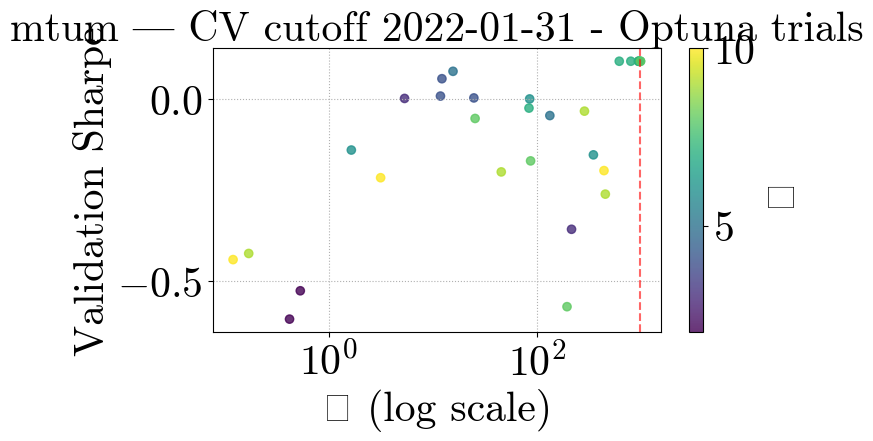

[I 2025-04-21 23:36:48,399] A new study created in memory with name: no-name-881bbf51-b968-497d-aa0b-dc64abef39e4
[I 2025-04-21 23:36:54,064] Trial 0 finished with value: 0.40831636214248535 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.40831636214248535.
[I 2025-04-21 23:36:59,502] Trial 1 finished with value: 0.5254323639767668 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5254323639767668.
[I 2025-04-21 23:37:11,790] Trial 2 finished with value: 0.31437475190289155 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5254323639767668.
[I 2025-04-21 23:37:19,874] Trial 3 finished with value: 0.10218531341249033 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5254323639767668.
[I 2025-04-21 23:37:24,940] Trial 4 finished with value: 0.720888906044741 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=23.7983, κ=5, Sharpe=0.7367


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


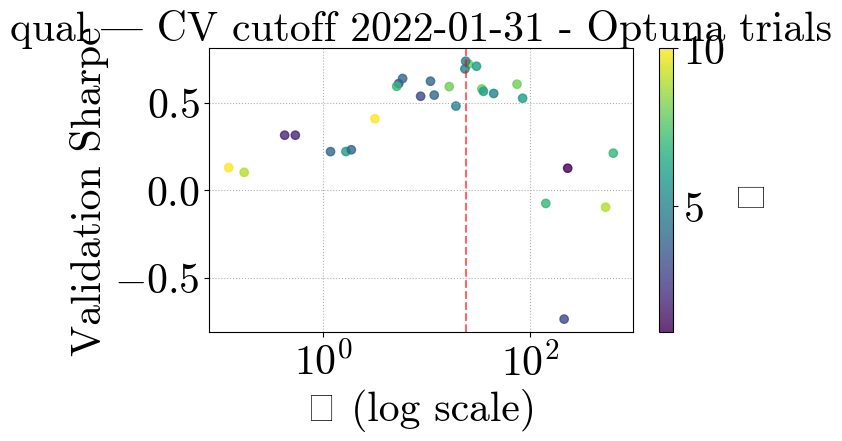

[I 2025-04-21 23:40:09,704] A new study created in memory with name: no-name-a4ca356d-9ff4-4b50-b5b3-4064665fd74d
[I 2025-04-21 23:40:16,757] Trial 0 finished with value: -0.09800613541450168 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.09800613541450168.
[I 2025-04-21 23:40:19,868] Trial 1 finished with value: -0.30751781617929735 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.09800613541450168.
[I 2025-04-21 23:40:31,120] Trial 2 finished with value: 0.5628533965865166 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.5628533965865166.
[I 2025-04-21 23:40:40,518] Trial 3 finished with value: 0.17538417636735226 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.5628533965865166.
[I 2025-04-21 23:40:43,709] Trial 4 finished with value: -0.26437209574465775 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=442.0430, κ=1, Sharpe=0.7302


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


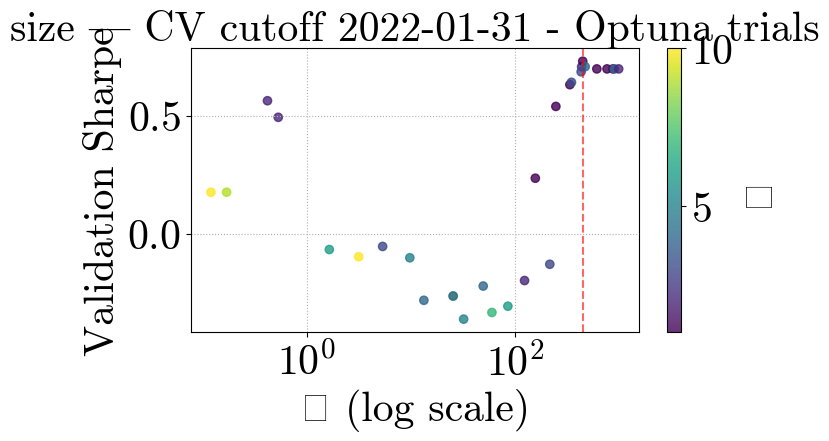

[I 2025-04-21 23:42:47,874] A new study created in memory with name: no-name-7e82bbbe-aae1-4581-936a-e2b21ae273c7
[I 2025-04-21 23:43:00,286] Trial 0 finished with value: 0.05351252467717237 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.05351252467717237.
[I 2025-04-21 23:43:10,293] Trial 1 finished with value: -0.6885450490796908 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.05351252467717237.
[I 2025-04-21 23:43:31,750] Trial 2 finished with value: 0.31576613936995696 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.31576613936995696.
[I 2025-04-21 23:43:40,022] Trial 3 finished with value: 0.14473927278606394 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.31576613936995696.
[I 2025-04-21 23:43:47,381] Trial 4 finished with value: 0.1987045288130261 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=0.4208, κ=2, Sharpe=0.3158


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


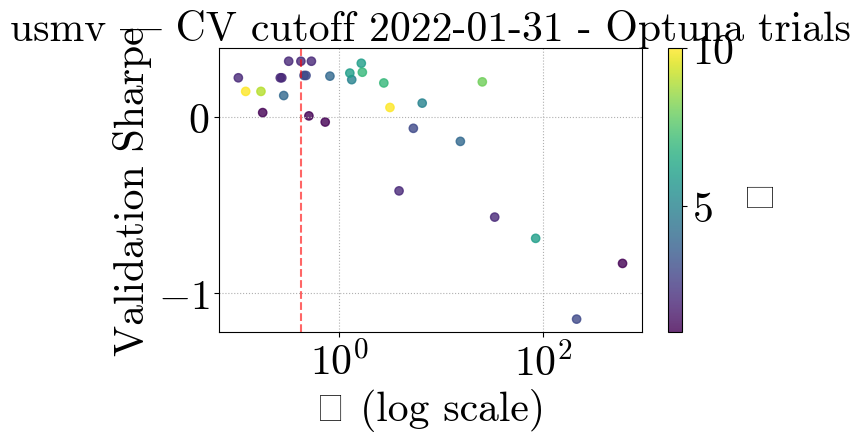

[I 2025-04-21 23:49:07,470] A new study created in memory with name: no-name-f36d39ba-4995-41a0-bdc1-7f9e9366e641
[I 2025-04-21 23:49:19,161] Trial 0 finished with value: 0.5277514391630099 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.5277514391630099.
[I 2025-04-21 23:49:23,128] Trial 1 finished with value: -0.13630293413627967 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.5277514391630099.
[I 2025-04-21 23:49:43,284] Trial 2 finished with value: 0.3903734111787658 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.5277514391630099.
[I 2025-04-21 23:49:55,194] Trial 3 finished with value: 0.3840879157456853 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.5277514391630099.
[I 2025-04-21 23:50:01,741] Trial 4 finished with value: -0.44460633439464725 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=3.3782, κ=7, Sharpe=0.6704


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


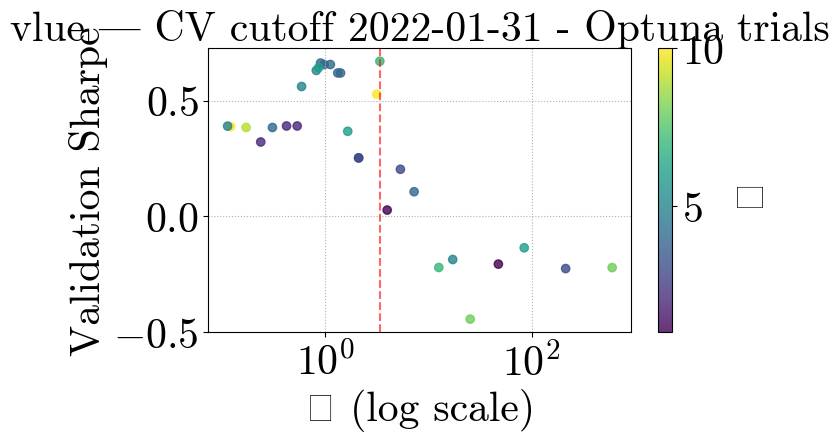

[I 2025-04-21 23:54:17,972] A new study created in memory with name: no-name-7d0a123d-cfc9-4ec4-b8a6-a79b1b5908cb
[I 2025-04-21 23:54:23,731] Trial 0 finished with value: -0.10571755465778448 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.10571755465778448.
[I 2025-04-21 23:54:31,621] Trial 1 finished with value: 0.1328959926819197 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.1328959926819197.
[I 2025-04-21 23:54:50,098] Trial 2 finished with value: -0.11334165744820196 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.1328959926819197.
[I 2025-04-21 23:55:01,094] Trial 3 finished with value: -0.19009639060440775 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.1328959926819197.
[I 2025-04-21 23:55:08,680] Trial 4 finished with value: 0.11350738972080542 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=130.3683, κ=10, Sharpe=0.2466


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


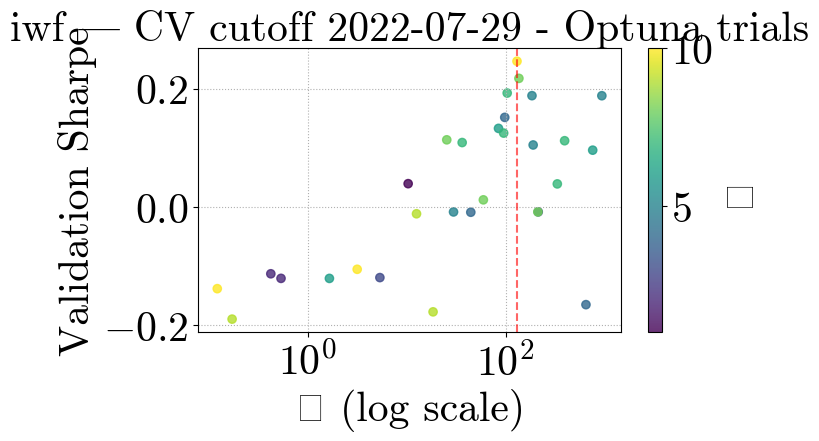

[I 2025-04-21 23:57:31,086] A new study created in memory with name: no-name-78de8e1d-cdb1-456e-8e33-2c5f63832997
[I 2025-04-21 23:57:36,369] Trial 0 finished with value: -0.5154704478935761 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5154704478935761.
[I 2025-04-21 23:57:42,983] Trial 1 finished with value: -0.17166622803395876 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.17166622803395876.
[I 2025-04-21 23:58:06,560] Trial 2 finished with value: -0.6238965810165781 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.17166622803395876.
[I 2025-04-21 23:58:15,460] Trial 3 finished with value: -0.4869589955601024 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.17166622803395876.
[I 2025-04-21 23:58:20,768] Trial 4 finished with value: -0.2529880445808569 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best

Optuna best λ=760.6194, κ=6, Sharpe=-0.0725


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


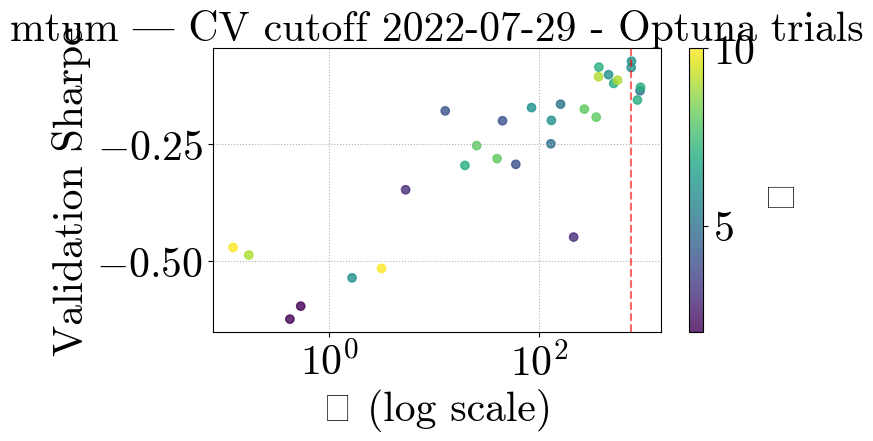

[I 2025-04-22 00:00:41,821] A new study created in memory with name: no-name-27643dfc-e860-4449-8d3a-e24542e9ff9b
[I 2025-04-22 00:00:48,985] Trial 0 finished with value: 0.12908784987679597 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.12908784987679597.
[I 2025-04-22 00:00:53,540] Trial 1 finished with value: 0.3109826534065916 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3109826534065916.
[I 2025-04-22 00:01:01,141] Trial 2 finished with value: 0.07194971779878656 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3109826534065916.
[I 2025-04-22 00:01:12,821] Trial 3 finished with value: -0.04926995744758648 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3109826534065916.
[I 2025-04-22 00:01:18,298] Trial 4 finished with value: 0.459074354591473 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=25.3782, κ=8, Sharpe=0.4591


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


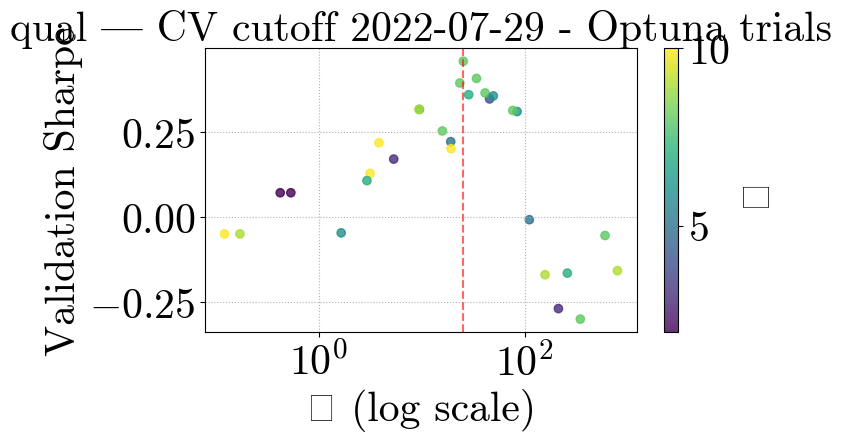

[I 2025-04-22 00:03:56,710] A new study created in memory with name: no-name-3403fdaa-4b8d-4a1e-9e26-5e709b395d58
[I 2025-04-22 00:04:05,587] Trial 0 finished with value: 0.1070159875589449 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.1070159875589449.
[I 2025-04-22 00:04:11,490] Trial 1 finished with value: 0.14959006652975576 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.14959006652975576.
[I 2025-04-22 00:04:26,113] Trial 2 finished with value: 0.6633702136038607 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.6633702136038607.
[I 2025-04-22 00:04:34,471] Trial 3 finished with value: 0.19524773394615266 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.6633702136038607.
[I 2025-04-22 00:04:39,868] Trial 4 finished with value: -0.035476733007723575 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=0.2641, κ=2, Sharpe=0.7172


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


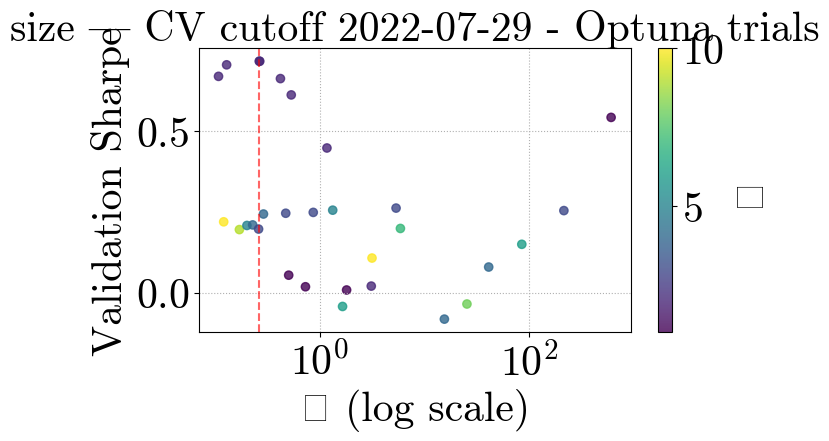

[I 2025-04-22 00:08:56,008] A new study created in memory with name: no-name-bead87a8-a81d-4de9-90bc-d77f0560938f
[I 2025-04-22 00:09:08,810] Trial 0 finished with value: 0.09174331561211728 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.09174331561211728.
[I 2025-04-22 00:09:13,671] Trial 1 finished with value: -0.2854639107153066 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.09174331561211728.
[I 2025-04-22 00:09:28,141] Trial 2 finished with value: 0.5230014806927177 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.5230014806927177.
[I 2025-04-22 00:09:38,606] Trial 3 finished with value: 0.3871833420760671 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.5230014806927177.
[I 2025-04-22 00:09:44,463] Trial 4 finished with value: 0.07751428145497608 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=1.3517, κ=2, Sharpe=0.5470


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


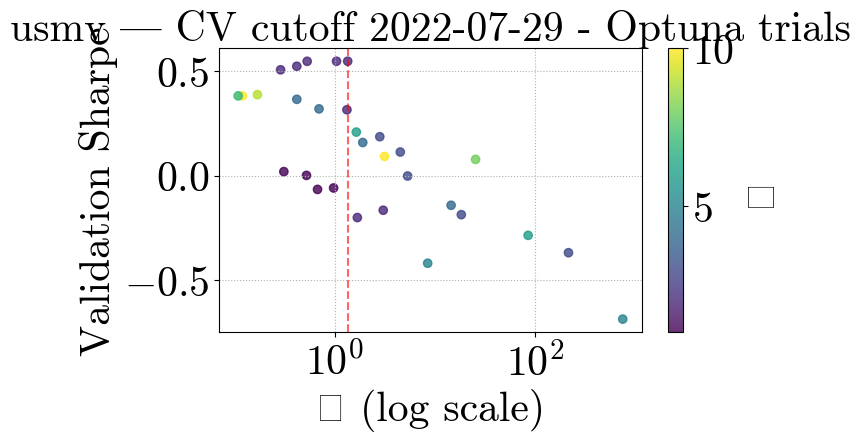

[I 2025-04-22 00:13:32,331] A new study created in memory with name: no-name-e0747513-fa05-469c-98a7-b12c02c72053
[I 2025-04-22 00:13:46,592] Trial 0 finished with value: 0.316259403178277 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.316259403178277.
[I 2025-04-22 00:13:50,832] Trial 1 finished with value: 0.3114398749836003 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.316259403178277.
[I 2025-04-22 00:14:09,307] Trial 2 finished with value: -0.008518210449922509 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.316259403178277.
[I 2025-04-22 00:14:19,003] Trial 3 finished with value: 0.2099143897930544 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.316259403178277.
[I 2025-04-22 00:14:25,457] Trial 4 finished with value: 0.15103586535512115 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 wi

Optuna best λ=4.1184, κ=7, Sharpe=0.4880


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


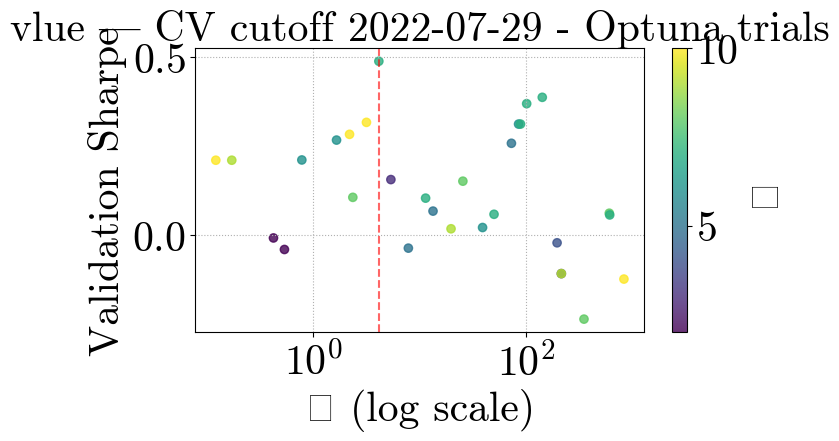

[I 2025-04-22 00:17:39,592] A new study created in memory with name: no-name-de8367c9-fc92-42d5-9c4c-ec406860b15a
[I 2025-04-22 00:17:45,385] Trial 0 finished with value: -0.02960068338533283 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.02960068338533283.
[I 2025-04-22 00:17:51,526] Trial 1 finished with value: -0.09293210949237635 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.02960068338533283.
[I 2025-04-22 00:18:09,233] Trial 2 finished with value: -0.16076524128946335 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.02960068338533283.
[I 2025-04-22 00:18:16,220] Trial 3 finished with value: -0.059283020751238896 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.02960068338533283.
[I 2025-04-22 00:18:23,788] Trial 4 finished with value: -0.1435878027339581 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}.

Optuna best λ=7.4958, κ=1, Sharpe=0.0615


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


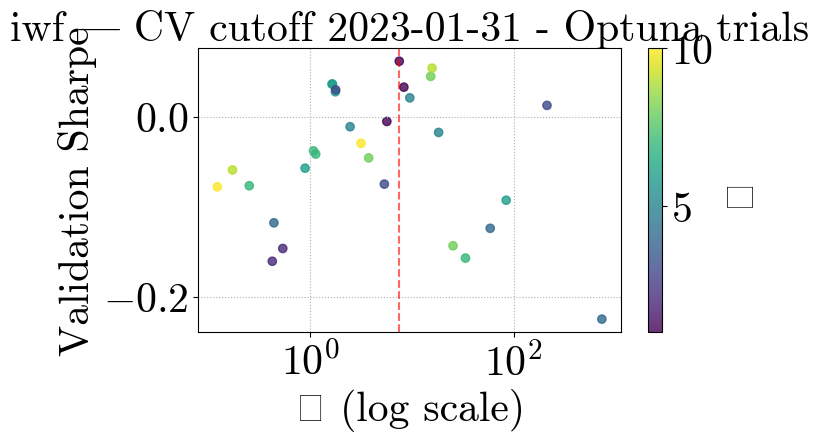

[I 2025-04-22 00:21:30,628] A new study created in memory with name: no-name-150d3da0-6f15-40ff-beab-948082897ec8
[I 2025-04-22 00:21:36,752] Trial 0 finished with value: -0.2647175648702294 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.2647175648702294.
[I 2025-04-22 00:21:45,190] Trial 1 finished with value: -0.35064714812130504 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.2647175648702294.
[I 2025-04-22 00:22:07,893] Trial 2 finished with value: -0.3664820736767356 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: -0.2647175648702294.
[I 2025-04-22 00:22:19,085] Trial 3 finished with value: -0.31664384183371863 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: -0.2647175648702294.
[I 2025-04-22 00:22:24,519] Trial 4 finished with value: -0.05587998039903749 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best 

Optuna best λ=12.5893, κ=9, Sharpe=0.0218


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


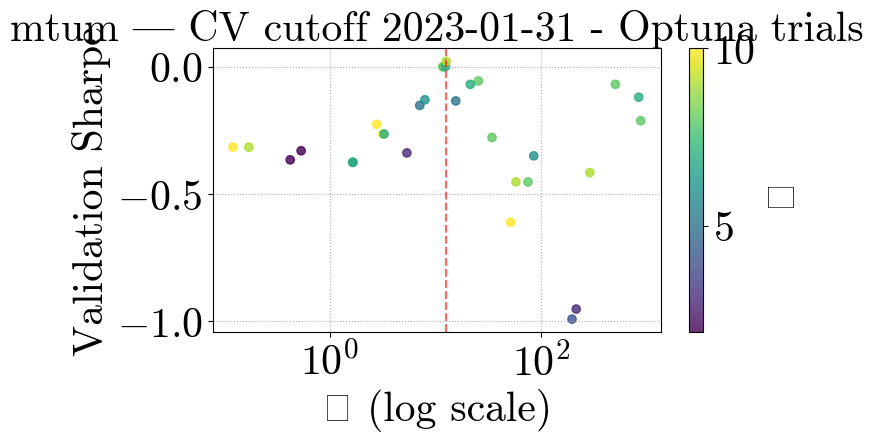

[I 2025-04-22 00:25:18,921] A new study created in memory with name: no-name-694bbce3-145f-47bd-886d-8dacb4283290
[I 2025-04-22 00:25:26,855] Trial 0 finished with value: 0.16524417351753917 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.16524417351753917.
[I 2025-04-22 00:25:31,934] Trial 1 finished with value: 0.41501836519325536 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.41501836519325536.
[I 2025-04-22 00:25:39,309] Trial 2 finished with value: 0.12180174628580766 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.41501836519325536.
[I 2025-04-22 00:25:45,755] Trial 3 finished with value: 0.184762545611102 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.41501836519325536.
[I 2025-04-22 00:25:50,292] Trial 4 finished with value: 0.44690082711710555 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=34.1185, κ=8, Sharpe=0.4950


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


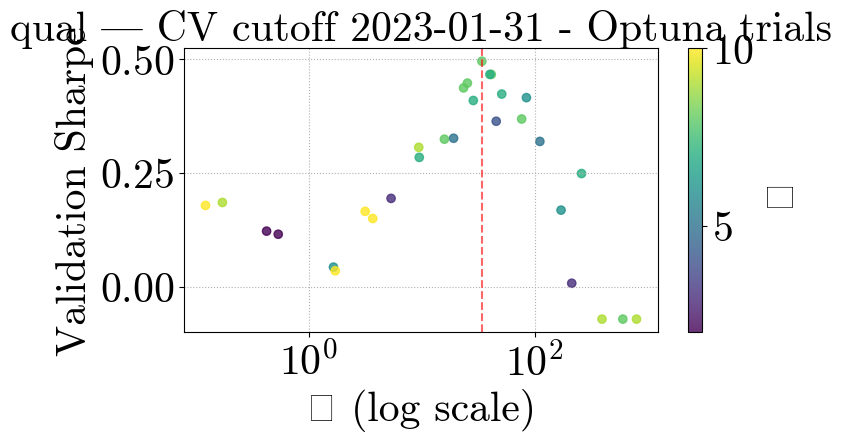

[I 2025-04-22 00:28:05,153] A new study created in memory with name: no-name-dfd22945-f9cb-4c6a-a79c-d258dc020074
[I 2025-04-22 00:28:12,757] Trial 0 finished with value: 0.05663853065438676 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.05663853065438676.
[I 2025-04-22 00:28:17,001] Trial 1 finished with value: 0.1395141633504508 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.1395141633504508.
[I 2025-04-22 00:28:28,687] Trial 2 finished with value: 0.6516667483439026 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.6516667483439026.
[I 2025-04-22 00:28:35,910] Trial 3 finished with value: 0.22227573349944788 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.6516667483439026.
[I 2025-04-22 00:28:40,730] Trial 4 finished with value: 0.07574184709056657 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=0.2641, κ=2, Sharpe=0.7291


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


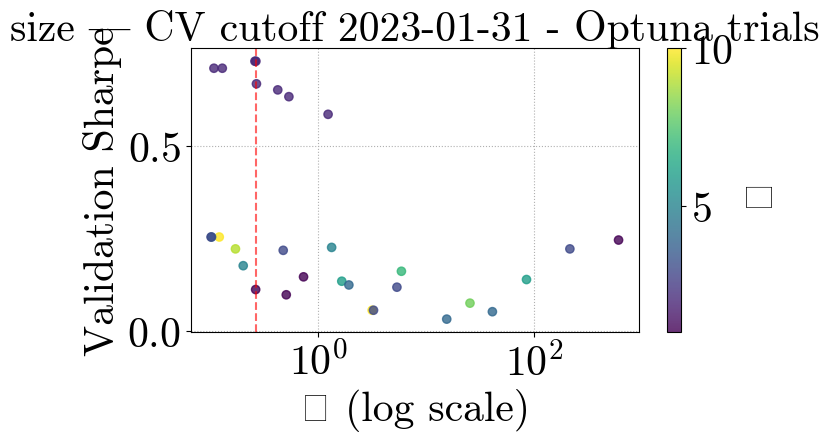

[I 2025-04-22 00:32:25,565] A new study created in memory with name: no-name-4797582f-a1d1-4153-8ef9-2d265316a208
[I 2025-04-22 00:32:33,094] Trial 0 finished with value: -0.1260135445828339 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.1260135445828339.
[I 2025-04-22 00:32:37,866] Trial 1 finished with value: -0.29765797262826904 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.1260135445828339.
[I 2025-04-22 00:32:49,831] Trial 2 finished with value: 0.31654635983166657 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.31654635983166657.
[I 2025-04-22 00:33:03,470] Trial 3 finished with value: 0.11141164664436132 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.31654635983166657.
[I 2025-04-22 00:33:09,847] Trial 4 finished with value: -0.028662938209735842 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best 

Optuna best λ=0.2641, κ=2, Sharpe=0.4405


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


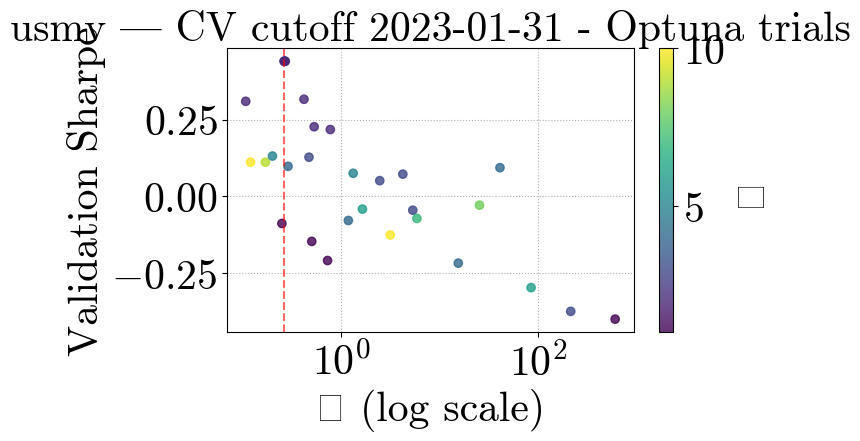

[I 2025-04-22 00:37:30,665] A new study created in memory with name: no-name-a8dc3153-18e8-4713-9183-736bc35794bd
[I 2025-04-22 00:37:43,845] Trial 0 finished with value: 0.33461768557285826 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.33461768557285826.
[I 2025-04-22 00:37:47,190] Trial 1 finished with value: 0.27544445804902795 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.33461768557285826.
[I 2025-04-22 00:38:04,413] Trial 2 finished with value: -0.20728169674151273 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.33461768557285826.
[I 2025-04-22 00:38:10,678] Trial 3 finished with value: 0.0030472360699134956 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.33461768557285826.
[I 2025-04-22 00:38:17,670] Trial 4 finished with value: 0.09908472321284861 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best 

Optuna best λ=385.8146, κ=1, Sharpe=0.6053


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


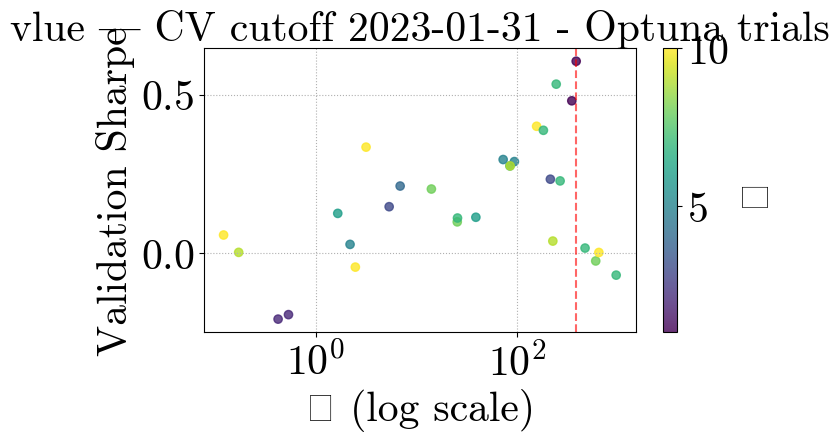

[I 2025-04-22 00:40:40,889] A new study created in memory with name: no-name-1b2c2855-f6dd-4deb-83e7-3c45d9aa7ae5
[I 2025-04-22 00:40:50,134] Trial 0 finished with value: -0.13472669282821695 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.13472669282821695.
[I 2025-04-22 00:40:57,884] Trial 1 finished with value: -0.07149638516806255 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: -0.07149638516806255.
[I 2025-04-22 00:41:09,353] Trial 2 finished with value: -0.2847763474690371 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: -0.07149638516806255.
[I 2025-04-22 00:41:18,941] Trial 3 finished with value: -0.25679529307530125 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: -0.07149638516806255.
[I 2025-04-22 00:41:27,245] Trial 4 finished with value: -0.0683534501068356 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. B

Optuna best λ=63.7750, κ=9, Sharpe=-0.0423


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


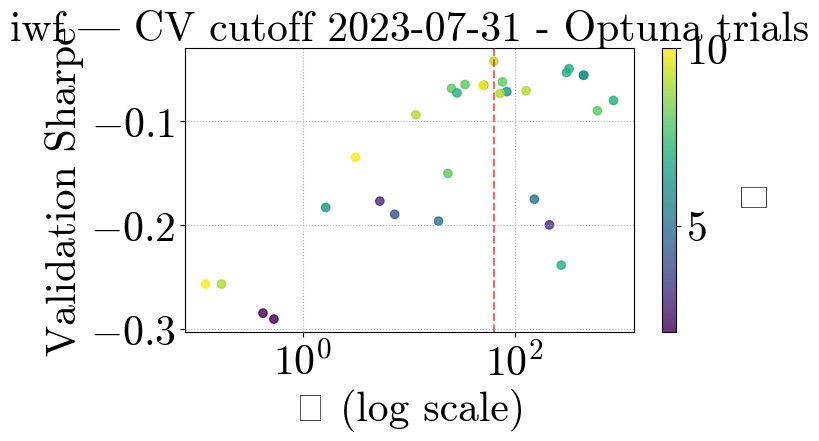

[I 2025-04-22 00:43:50,986] A new study created in memory with name: no-name-be70e8db-4d7d-41cb-9c64-5310ff6c2079
[I 2025-04-22 00:43:59,790] Trial 0 finished with value: -0.7776674189463143 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.7776674189463143.
[I 2025-04-22 00:44:05,444] Trial 1 finished with value: -0.8152318971449427 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.7776674189463143.
[I 2025-04-22 00:44:16,569] Trial 2 finished with value: -0.7603151091050993 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.7603151091050993.
[I 2025-04-22 00:44:25,801] Trial 3 finished with value: -0.7407234042306718 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: -0.7407234042306718.
[I 2025-04-22 00:44:32,601] Trial 4 finished with value: -0.47865861761663026 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=522.5959, κ=4, Sharpe=0.0485


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


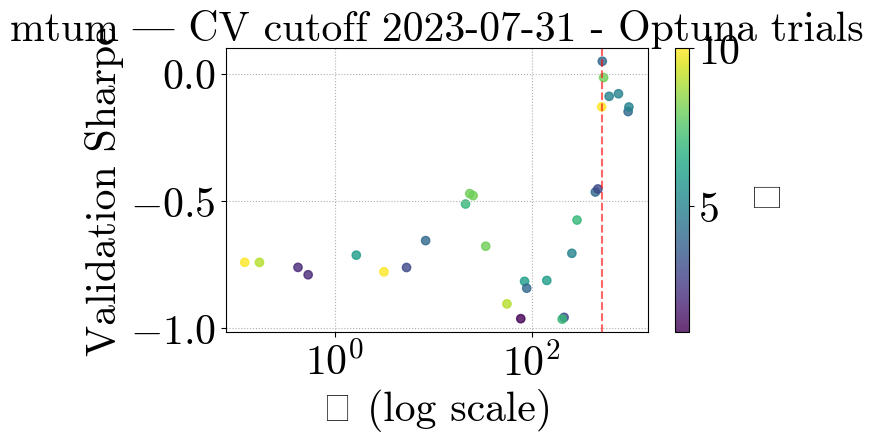

[I 2025-04-22 00:46:33,391] A new study created in memory with name: no-name-bf0a8f5d-c782-4bcf-b3a4-a4918431dda4
[I 2025-04-22 00:46:42,100] Trial 0 finished with value: -0.04950895080626957 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.04950895080626957.
[I 2025-04-22 00:46:46,812] Trial 1 finished with value: 0.3900838076186629 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.3900838076186629.
[I 2025-04-22 00:46:57,563] Trial 2 finished with value: -0.2483709883495272 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.3900838076186629.
[I 2025-04-22 00:47:04,224] Trial 3 finished with value: -0.29322369121303515 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.3900838076186629.
[I 2025-04-22 00:47:11,176] Trial 4 finished with value: 0.5816626822183978 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=21.2650, κ=7, Sharpe=0.5988


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


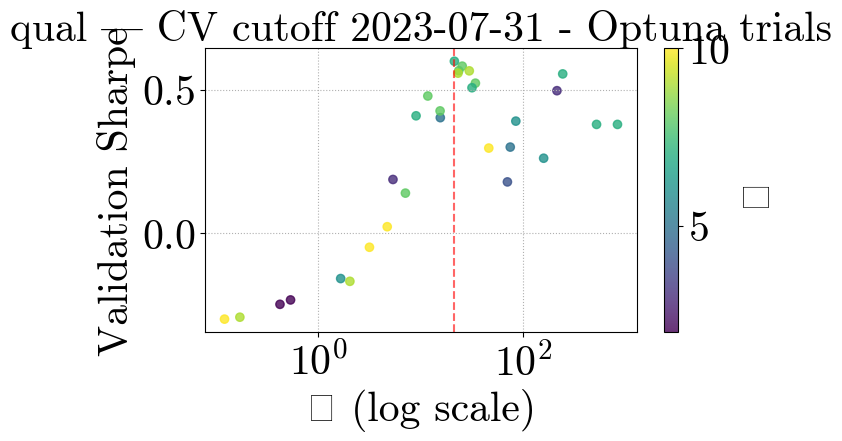

[I 2025-04-22 00:50:02,362] A new study created in memory with name: no-name-031f1ef4-a2b7-4569-bc4c-b8ee8fca529f
[I 2025-04-22 00:50:09,998] Trial 0 finished with value: -0.06238241981974405 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.06238241981974405.
[I 2025-04-22 00:50:14,554] Trial 1 finished with value: 0.12692486093361904 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.12692486093361904.
[I 2025-04-22 00:50:28,853] Trial 2 finished with value: 0.7178664773760336 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.7178664773760336.
[I 2025-04-22 00:50:38,401] Trial 3 finished with value: 0.3248595963395361 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.7178664773760336.
[I 2025-04-22 00:50:42,972] Trial 4 finished with value: -0.050335871583912735 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=0.1079, κ=2, Sharpe=0.7344


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


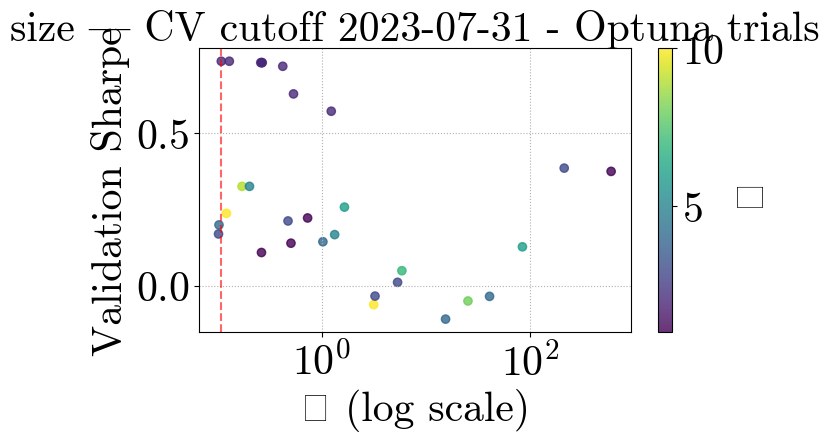

[I 2025-04-22 00:54:59,712] A new study created in memory with name: no-name-5b7c5471-09eb-498a-b12e-736d21d9f157
[I 2025-04-22 00:55:07,263] Trial 0 finished with value: -0.12659815099477228 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.12659815099477228.
[I 2025-04-22 00:55:11,736] Trial 1 finished with value: 0.6571798967119636 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.6571798967119636.
[I 2025-04-22 00:55:21,264] Trial 2 finished with value: -0.06208287756387874 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.6571798967119636.
[I 2025-04-22 00:55:30,654] Trial 3 finished with value: -0.32975420730050875 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.6571798967119636.
[I 2025-04-22 00:55:35,380] Trial 4 finished with value: 0.557558804308183 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=84.7180, κ=6, Sharpe=0.6572


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


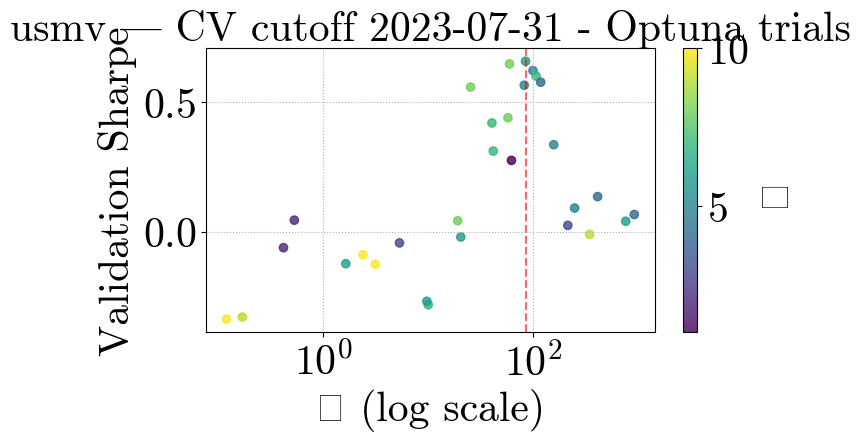

[I 2025-04-22 00:58:06,796] A new study created in memory with name: no-name-96d8219d-6a3c-4cbb-809c-434104170c4a
[I 2025-04-22 00:58:20,606] Trial 0 finished with value: 0.20939886174257374 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.20939886174257374.
[I 2025-04-22 00:58:26,851] Trial 1 finished with value: 0.5039760823683109 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5039760823683109.
[I 2025-04-22 00:58:44,237] Trial 2 finished with value: 0.09068358176414335 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5039760823683109.
[I 2025-04-22 00:58:49,920] Trial 3 finished with value: 0.0549137067142602 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5039760823683109.
[I 2025-04-22 00:58:57,919] Trial 4 finished with value: 0.6574906205152838 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=57.4859, κ=9, Sharpe=0.8729


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


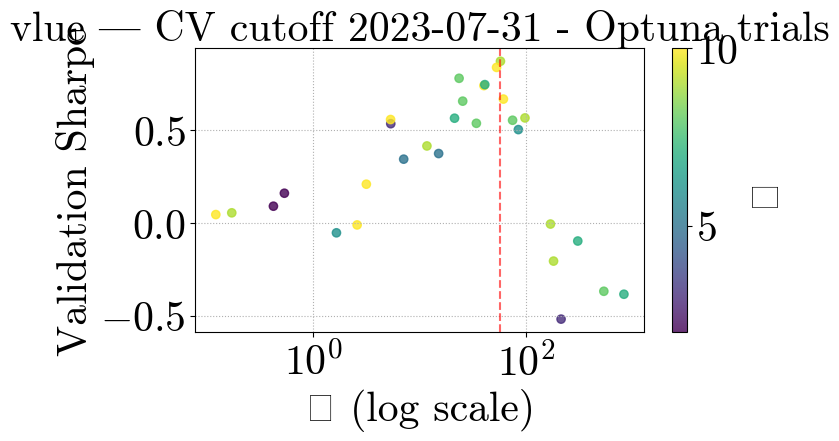

[I 2025-04-22 01:02:09,253] A new study created in memory with name: no-name-9136416a-ff3c-4dac-a266-a7be7a02e2d8
[I 2025-04-22 01:02:16,861] Trial 0 finished with value: 0.18415181992031385 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.18415181992031385.
[I 2025-04-22 01:02:22,177] Trial 1 finished with value: 0.19346454271413344 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.19346454271413344.
[I 2025-04-22 01:02:31,477] Trial 2 finished with value: 0.016497075015409455 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.19346454271413344.
[I 2025-04-22 01:02:43,957] Trial 3 finished with value: 0.06444036518620948 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.19346454271413344.
[I 2025-04-22 01:02:49,379] Trial 4 finished with value: 0.16713012137826863 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=5.1767, κ=4, Sharpe=0.2397


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


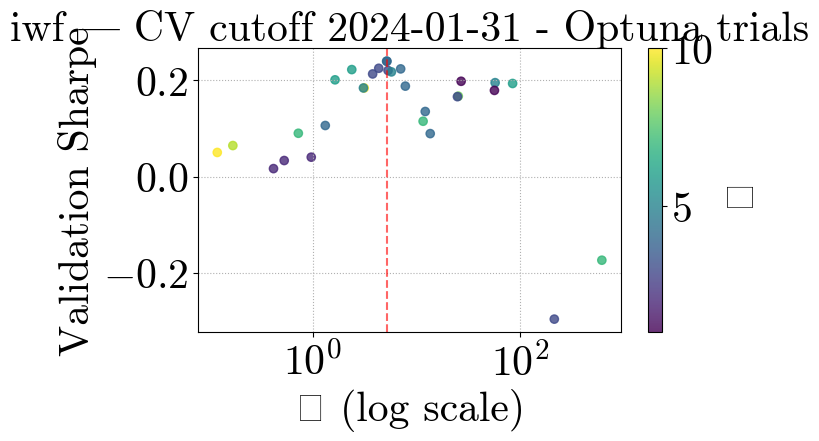

[I 2025-04-22 01:06:02,864] A new study created in memory with name: no-name-fe3a8381-bf59-4d11-907e-8bbbffd2185a
[I 2025-04-22 01:06:14,212] Trial 0 finished with value: -0.5468291863038993 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.5468291863038993.
[I 2025-04-22 01:06:20,334] Trial 1 finished with value: -0.5473679797235297 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.5468291863038993.
[I 2025-04-22 01:06:32,632] Trial 2 finished with value: -0.2670640257922102 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.2670640257922102.
[I 2025-04-22 01:06:43,907] Trial 3 finished with value: -0.47691147954072666 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: -0.2670640257922102.
[I 2025-04-22 01:06:52,160] Trial 4 finished with value: -0.3724897081705381 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=0.2782, κ=2, Sharpe=-0.1852


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


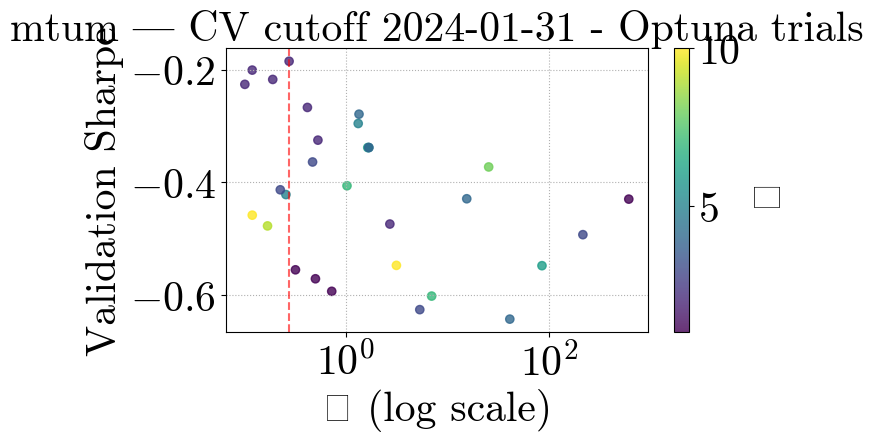

[I 2025-04-22 01:11:03,045] A new study created in memory with name: no-name-5b9bad6d-d525-4f6d-b58c-4e92a672d5b1
[I 2025-04-22 01:11:08,566] Trial 0 finished with value: 0.19192048473654136 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.19192048473654136.
[I 2025-04-22 01:11:14,606] Trial 1 finished with value: 0.32047155983694514 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.32047155983694514.
[I 2025-04-22 01:11:19,909] Trial 2 finished with value: -0.008709387205006032 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.32047155983694514.
[I 2025-04-22 01:11:31,372] Trial 3 finished with value: -0.2179470848387336 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.32047155983694514.
[I 2025-04-22 01:11:35,604] Trial 4 finished with value: 0.7224592028401817 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=213.6833, κ=3, Sharpe=0.9504


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


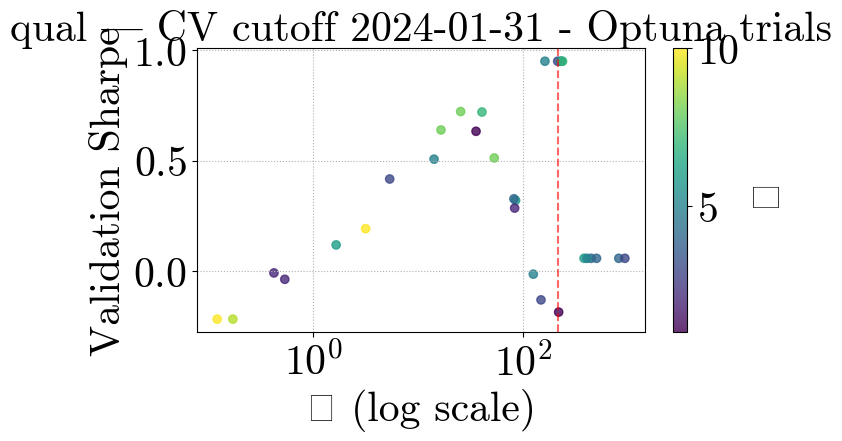

[I 2025-04-22 01:13:36,149] A new study created in memory with name: no-name-cbcafb89-7d9c-46b8-b58c-cbe6f0a1c16e
[I 2025-04-22 01:13:54,217] Trial 0 finished with value: -0.012554719934571808 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.012554719934571808.
[I 2025-04-22 01:13:57,165] Trial 1 finished with value: 0.14733432906323063 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.14733432906323063.
[I 2025-04-22 01:14:09,369] Trial 2 finished with value: 0.594555813719984 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.594555813719984.
[I 2025-04-22 01:14:26,876] Trial 3 finished with value: -0.053179713132397485 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.594555813719984.
[I 2025-04-22 01:14:36,766] Trial 4 finished with value: 0.05772755799409035 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is 

Optuna best λ=0.1079, κ=2, Sharpe=0.6664


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


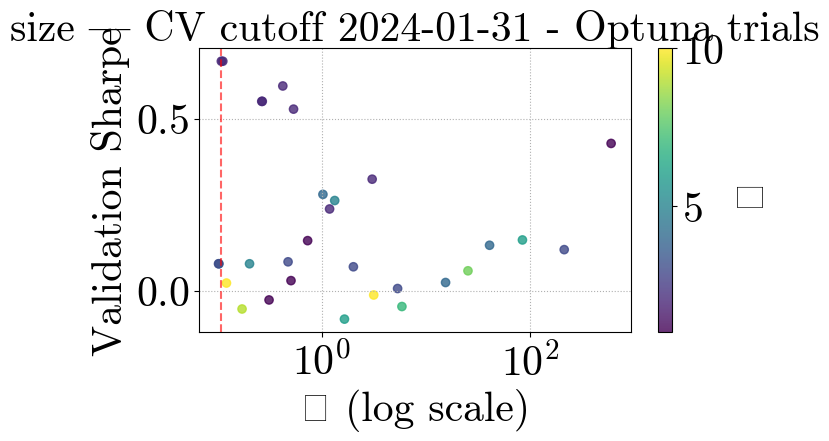

[I 2025-04-22 01:19:36,480] A new study created in memory with name: no-name-13c4e6a7-eb4e-45c9-b36b-ec22ac51174f
[I 2025-04-22 01:19:53,533] Trial 0 finished with value: -0.3135957749166385 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3135957749166385.
[I 2025-04-22 01:19:58,282] Trial 1 finished with value: 0.4079665899174952 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.4079665899174952.
[I 2025-04-22 01:20:14,846] Trial 2 finished with value: -0.1934273462594576 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.4079665899174952.
[I 2025-04-22 01:20:28,982] Trial 3 finished with value: -0.28482960113364225 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.4079665899174952.
[I 2025-04-22 01:20:36,639] Trial 4 finished with value: -0.28574628963805904 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=151.5899, κ=8, Sharpe=0.7360


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


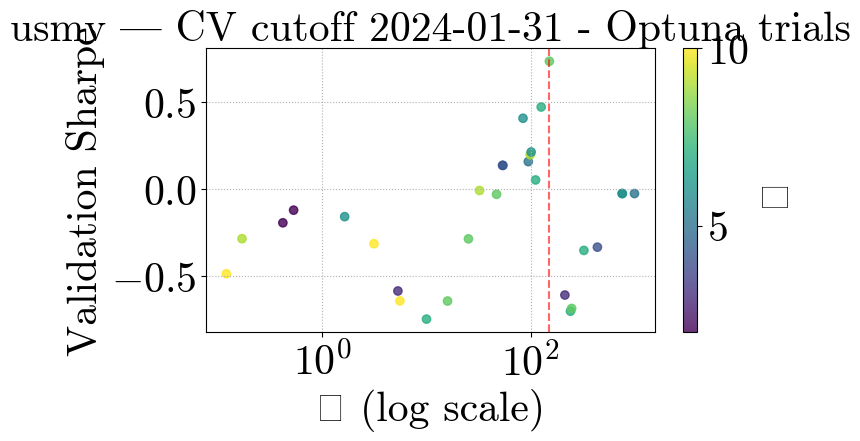

[I 2025-04-22 01:23:18,803] A new study created in memory with name: no-name-cc61af3f-b888-428d-b76f-789e0f888aad
[I 2025-04-22 01:23:25,966] Trial 0 finished with value: -0.023401622621816918 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.023401622621816918.
[I 2025-04-22 01:23:31,903] Trial 1 finished with value: 0.5114368488261062 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5114368488261062.
[I 2025-04-22 01:23:44,389] Trial 2 finished with value: 0.3504495049749514 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5114368488261062.
[I 2025-04-22 01:23:51,119] Trial 3 finished with value: 0.38376654968304613 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5114368488261062.
[I 2025-04-22 01:23:58,330] Trial 4 finished with value: 0.7548390730402079 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=8.4169, κ=1, Sharpe=1.0772


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


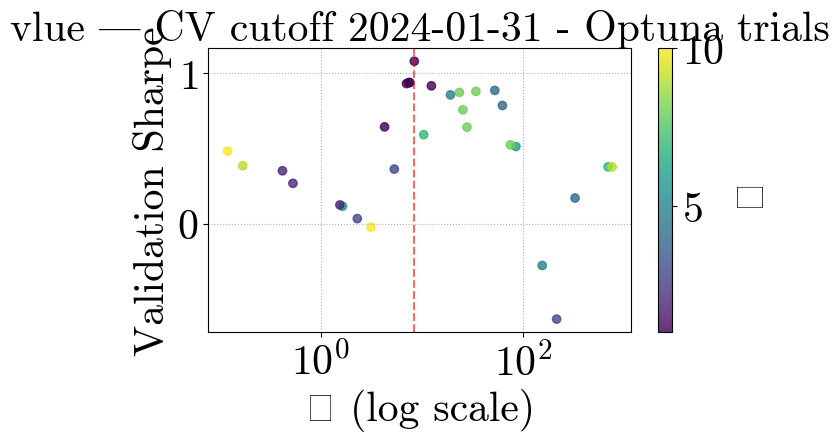

[I 2025-04-22 01:26:20,720] A new study created in memory with name: no-name-f3dfdde9-509b-4055-a7de-d97f95b99ea2
[I 2025-04-22 01:26:28,417] Trial 0 finished with value: 0.0826524218301441 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.0826524218301441.
[I 2025-04-22 01:26:33,543] Trial 1 finished with value: 0.2131198168398742 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.2131198168398742.
[I 2025-04-22 01:26:43,373] Trial 2 finished with value: -0.33795936828303313 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.2131198168398742.
[I 2025-04-22 01:26:52,436] Trial 3 finished with value: -0.09491934570591014 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.2131198168398742.
[I 2025-04-22 01:27:00,284] Trial 4 finished with value: -0.20878792659444215 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tri

Optuna best λ=10.5416, κ=1, Sharpe=0.3619


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


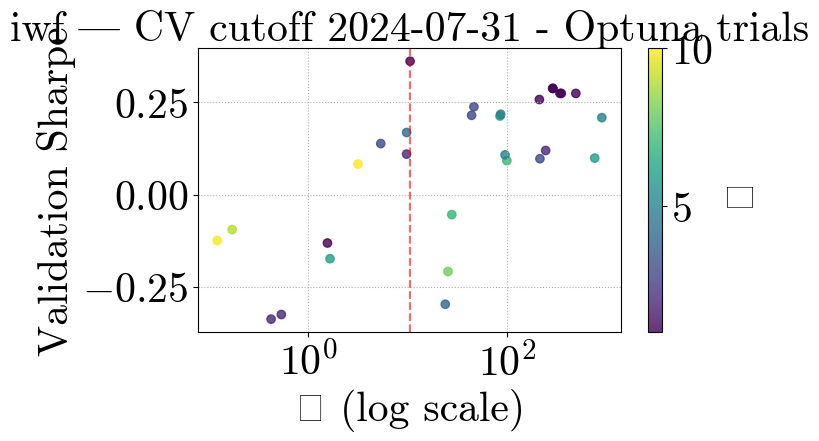

[I 2025-04-22 01:29:05,437] A new study created in memory with name: no-name-23896329-a78a-4183-8689-d53d8ee5f7b5
[I 2025-04-22 01:29:15,105] Trial 0 finished with value: 0.16781327210603394 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.16781327210603394.
[I 2025-04-22 01:29:19,664] Trial 1 finished with value: -0.09679003519101496 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.16781327210603394.
[I 2025-04-22 01:29:29,170] Trial 2 finished with value: 0.12867098580774539 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.16781327210603394.
[I 2025-04-22 01:29:39,259] Trial 3 finished with value: 0.14132249989853535 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.16781327210603394.
[I 2025-04-22 01:29:44,043] Trial 4 finished with value: 0.35573861476782914 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=727.8681, κ=7, Sharpe=0.4978


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


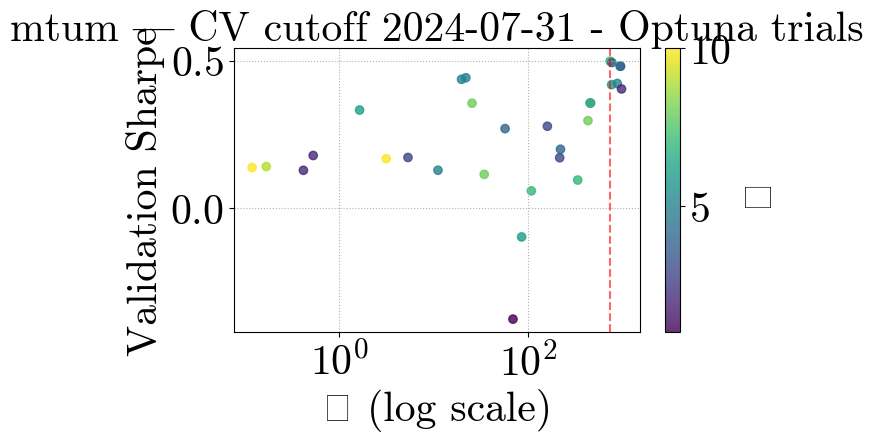

[I 2025-04-22 01:31:47,099] A new study created in memory with name: no-name-c8c31be4-3933-489e-8e11-29a64ad6fab7
[I 2025-04-22 01:31:55,702] Trial 0 finished with value: 0.5317475318522052 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.5317475318522052.
[I 2025-04-22 01:32:01,281] Trial 1 finished with value: 0.4680455617152833 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.5317475318522052.
[I 2025-04-22 01:32:12,481] Trial 2 finished with value: 0.36088047091785486 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.5317475318522052.
[I 2025-04-22 01:32:21,520] Trial 3 finished with value: 0.16070983969721384 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.5317475318522052.
[I 2025-04-22 01:32:26,312] Trial 4 finished with value: 0.7469536825855962 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 4

Optuna best λ=50.4311, κ=3, Sharpe=0.8348


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


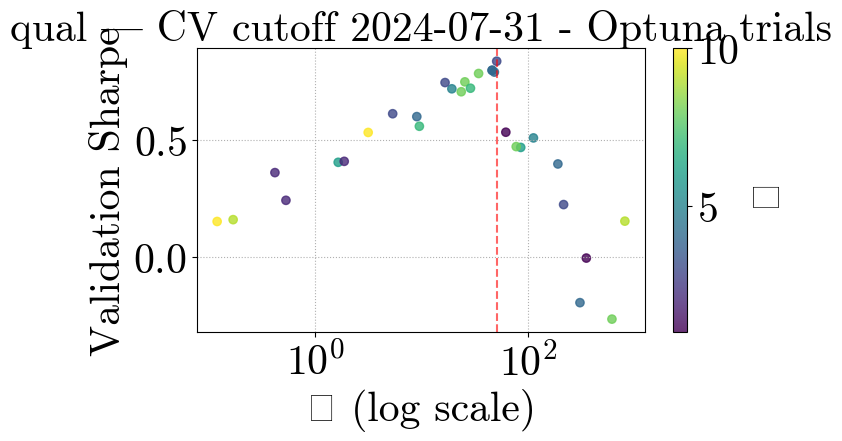

[I 2025-04-22 01:34:54,694] A new study created in memory with name: no-name-2ab6f822-c9ed-4e26-930e-58c8ed40bebf
[I 2025-04-22 01:35:06,054] Trial 0 finished with value: 0.19165866066737824 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.19165866066737824.
[I 2025-04-22 01:35:10,860] Trial 1 finished with value: 0.37690836147456797 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.37690836147456797.
[I 2025-04-22 01:35:25,299] Trial 2 finished with value: 0.41803250964831956 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.41803250964831956.
[I 2025-04-22 01:35:39,476] Trial 3 finished with value: -0.22989334749999008 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.41803250964831956.
[I 2025-04-22 01:35:46,868] Trial 4 finished with value: 0.23384769452352114 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is

Optuna best λ=603.3179, κ=1, Sharpe=0.5017


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


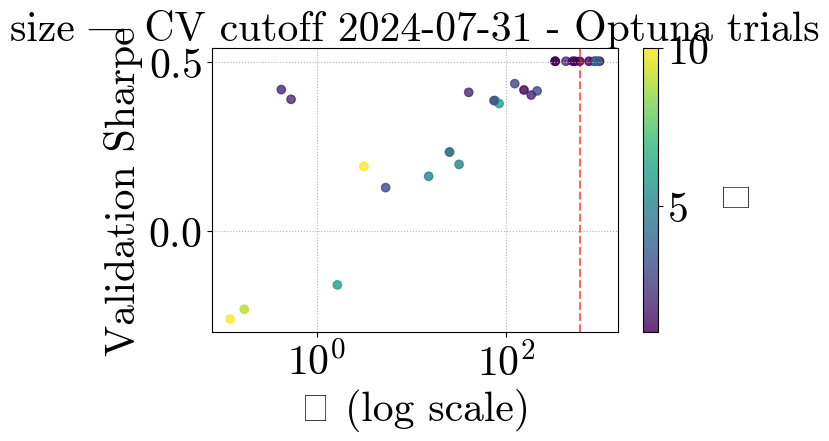

[I 2025-04-22 01:37:31,183] A new study created in memory with name: no-name-03c3a595-7d2d-4881-8161-a1cfe76e6093
[I 2025-04-22 01:37:48,891] Trial 0 finished with value: -0.25543849108189753 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.25543849108189753.
[I 2025-04-22 01:37:53,571] Trial 1 finished with value: 0.37565992226415257 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.37565992226415257.
[I 2025-04-22 01:38:08,565] Trial 2 finished with value: -0.09350907279660281 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.37565992226415257.
[I 2025-04-22 01:38:21,201] Trial 3 finished with value: -0.2635907720115609 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.37565992226415257.
[I 2025-04-22 01:38:26,405] Trial 4 finished with value: -0.024777541646417767 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Bes

Optuna best λ=150.2824, κ=8, Sharpe=0.7831


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


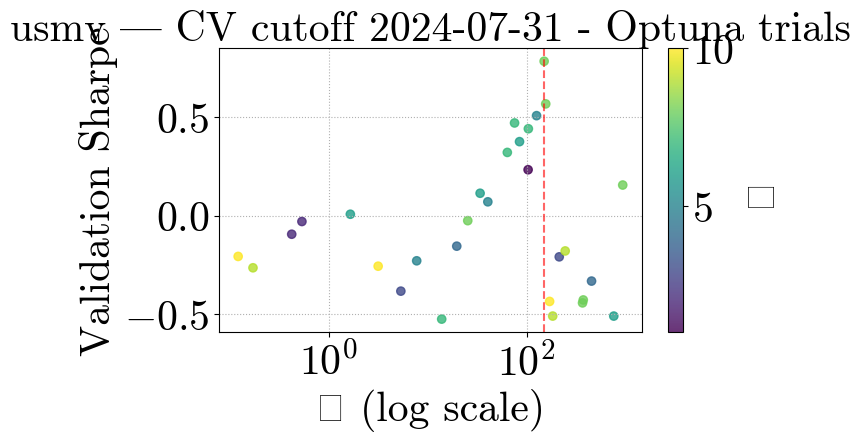

[I 2025-04-22 01:40:45,977] A new study created in memory with name: no-name-41f39987-f050-4056-9692-72860cac2173
[I 2025-04-22 01:40:53,436] Trial 0 finished with value: -0.08384196905383477 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.08384196905383477.
[I 2025-04-22 01:40:56,557] Trial 1 finished with value: 0.22173503536429112 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.22173503536429112.
[I 2025-04-22 01:41:07,668] Trial 2 finished with value: -0.17850868746596957 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.22173503536429112.
[I 2025-04-22 01:41:17,705] Trial 3 finished with value: 0.04563444780088732 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.22173503536429112.
[I 2025-04-22 01:41:25,568] Trial 4 finished with value: 0.6961590033045301 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=25.3782, κ=8, Sharpe=0.6962


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


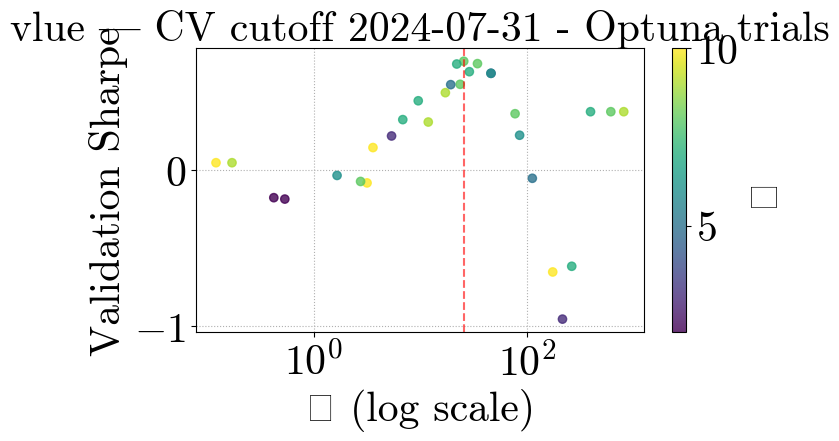

[I 2025-04-22 01:44:14,087] A new study created in memory with name: no-name-eb46a2e2-800b-4003-bba6-0b0882f12ce1
[I 2025-04-22 01:44:22,378] Trial 0 finished with value: 0.07786161451674885 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.07786161451674885.
[I 2025-04-22 01:44:24,276] Trial 1 finished with value: 0.5767997406791261 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5767997406791261.
[I 2025-04-22 01:44:37,495] Trial 2 finished with value: -0.4473853158108612 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5767997406791261.
[I 2025-04-22 01:44:47,077] Trial 3 finished with value: -0.08379371808598596 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5767997406791261.
[I 2025-04-22 01:44:55,836] Trial 4 finished with value: -0.14050312010479712 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tr

Optuna best λ=49.0821, κ=5, Sharpe=0.7893


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


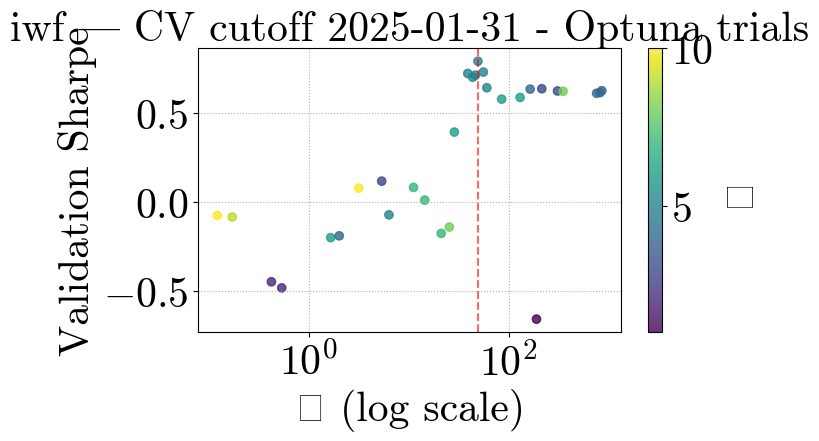

[I 2025-04-22 01:47:40,301] A new study created in memory with name: no-name-3ae5d355-df80-4402-96f7-dbb50b08c21b
[I 2025-04-22 01:47:49,980] Trial 0 finished with value: -0.07906246899783873 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.07906246899783873.
[I 2025-04-22 01:47:57,177] Trial 1 finished with value: -0.3501610138573091 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.07906246899783873.
[I 2025-04-22 01:48:11,501] Trial 2 finished with value: 0.024705718564184097 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.024705718564184097.
[I 2025-04-22 01:48:20,987] Trial 3 finished with value: -0.04024796310287823 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.024705718564184097.
[I 2025-04-22 01:48:27,013] Trial 4 finished with value: 0.22484626906368396 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. B

Optuna best λ=16.9321, κ=4, Sharpe=0.3360


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


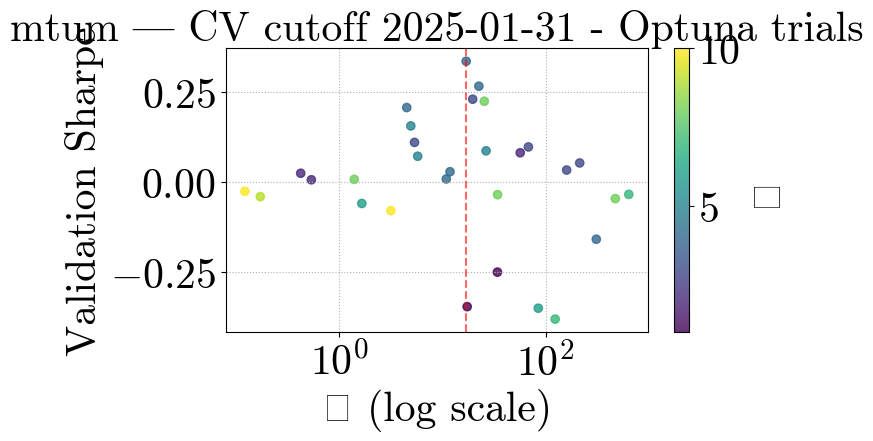

[I 2025-04-22 01:51:38,144] A new study created in memory with name: no-name-a2231dc7-5096-4373-86a7-f7606c4c598f
[I 2025-04-22 01:51:49,506] Trial 0 finished with value: 0.712830046731176 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.712830046731176.
[I 2025-04-22 01:51:54,126] Trial 1 finished with value: 0.3110754774709969 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.712830046731176.
[I 2025-04-22 01:52:00,078] Trial 2 finished with value: 0.448654583787364 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.712830046731176.
[I 2025-04-22 01:52:09,158] Trial 3 finished with value: 0.2601887812963205 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.712830046731176.
[I 2025-04-22 01:52:15,669] Trial 4 finished with value: 0.7421001160239149 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 4 with va

Optuna best λ=8.9045, κ=7, Sharpe=0.8581


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


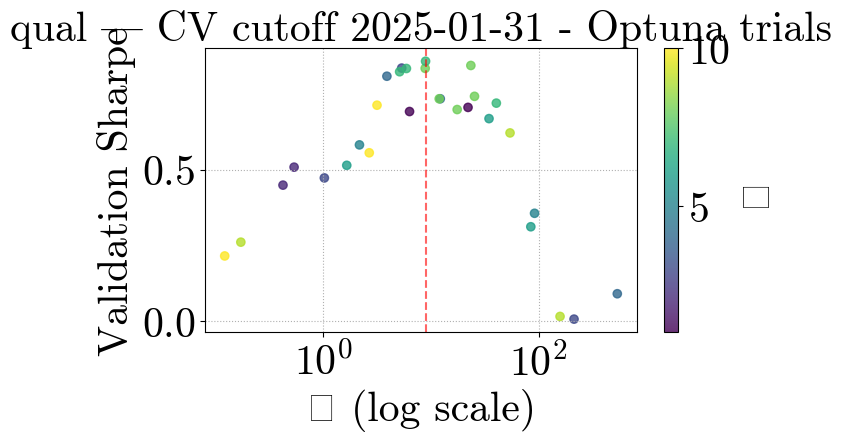

[I 2025-04-22 01:55:08,713] A new study created in memory with name: no-name-a0c4c696-64b7-4a2e-aff6-6cb982eb607b
[I 2025-04-22 01:55:22,334] Trial 0 finished with value: 0.08877965015412602 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.08877965015412602.
[I 2025-04-22 01:55:28,234] Trial 1 finished with value: 0.4147075766247376 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.4147075766247376.
[I 2025-04-22 01:55:47,410] Trial 2 finished with value: 0.4905219960055699 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.4905219960055699.
[I 2025-04-22 01:56:04,670] Trial 3 finished with value: 0.04701423688443764 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.4905219960055699.
[I 2025-04-22 01:56:09,319] Trial 4 finished with value: 0.250992138860352 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 2

Optuna best λ=603.3179, κ=1, Sharpe=0.5811


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


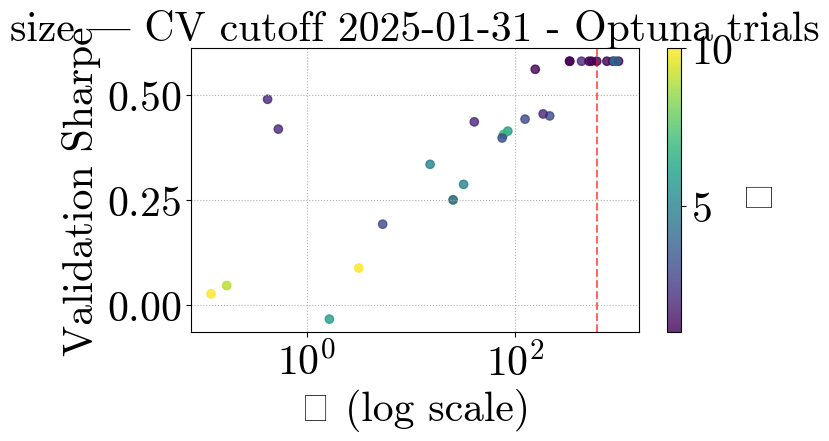

[I 2025-04-22 01:57:50,380] A new study created in memory with name: no-name-617d8e00-894e-4003-9428-d9d45a959baf
[I 2025-04-22 01:58:04,372] Trial 0 finished with value: -0.17657007006131908 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.17657007006131908.
[I 2025-04-22 01:58:09,325] Trial 1 finished with value: 0.5629579281093716 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.5629579281093716.
[I 2025-04-22 01:58:24,155] Trial 2 finished with value: -0.23035079549515416 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.5629579281093716.
[I 2025-04-22 01:58:41,258] Trial 3 finished with value: -0.5026709913318711 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.5629579281093716.
[I 2025-04-22 01:58:46,535] Trial 4 finished with value: 0.23557434704725835 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is t

Optuna best λ=129.9013, κ=5, Sharpe=0.8858


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


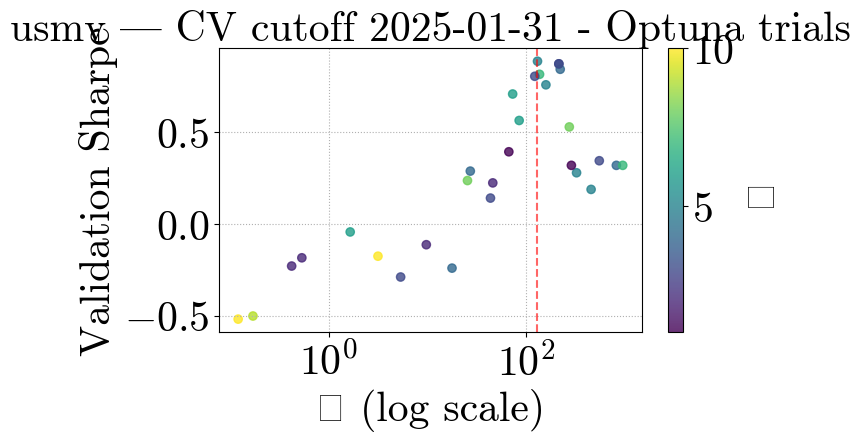

[I 2025-04-22 02:01:18,810] A new study created in memory with name: no-name-02083f5a-c2f0-49fd-b466-6ef6d5b65d5a
[I 2025-04-22 02:01:25,126] Trial 0 finished with value: -0.3685318540017597 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.3685318540017597.
[I 2025-04-22 02:01:29,957] Trial 1 finished with value: -0.8372541879633405 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.3685318540017597.
[I 2025-04-22 02:01:41,669] Trial 2 finished with value: -0.18404110698482112 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.18404110698482112.
[I 2025-04-22 02:01:52,603] Trial 3 finished with value: -0.1675668344131297 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: -0.1675668344131297.
[I 2025-04-22 02:01:59,325] Trial 4 finished with value: -0.029123801899624286 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best

Optuna best λ=816.5528, κ=4, Sharpe=0.8712


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


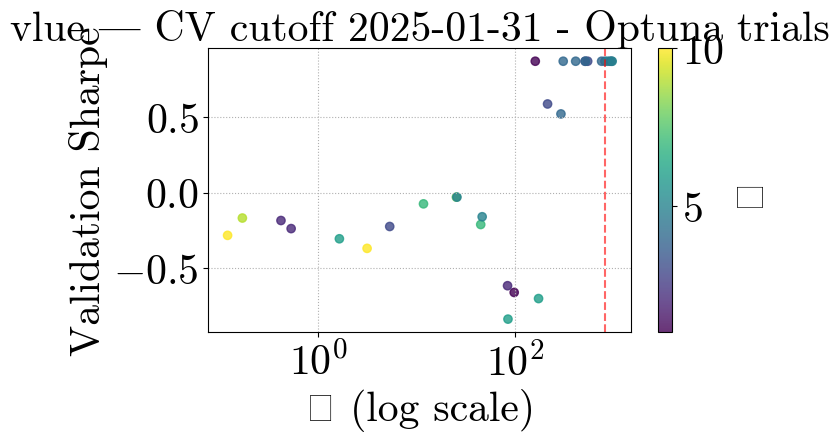

[I 2025-04-22 02:03:48,884] A new study created in memory with name: no-name-1335ac91-f151-4530-a6d5-e280e07a73b9
[I 2025-04-22 02:03:57,462] Trial 0 finished with value: 0.3287025574992903 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3287025574992903.
[I 2025-04-22 02:04:00,828] Trial 1 finished with value: 0.12037127689020682 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.3287025574992903.
[I 2025-04-22 02:04:15,951] Trial 2 finished with value: -0.2796983711362229 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.3287025574992903.
[I 2025-04-22 02:04:29,263] Trial 3 finished with value: -0.02969527689061788 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.3287025574992903.
[I 2025-04-22 02:04:38,028] Trial 4 finished with value: 0.3227938310808091 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial

Optuna best λ=60.3604, κ=8, Sharpe=0.7222


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


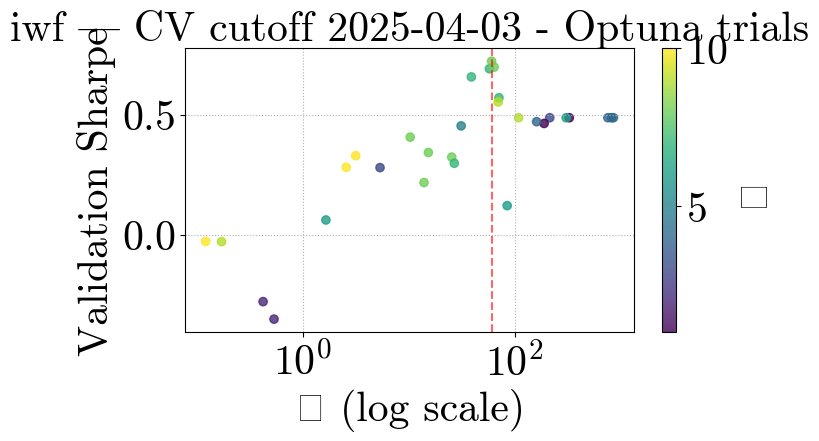

[I 2025-04-22 02:07:57,625] A new study created in memory with name: no-name-1596a4ad-0287-44ef-b09b-8c3627355d17
[I 2025-04-22 02:08:07,547] Trial 0 finished with value: 0.06203837169780493 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.06203837169780493.
[I 2025-04-22 02:08:14,629] Trial 1 finished with value: -0.004946806528697848 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.06203837169780493.
[I 2025-04-22 02:08:26,907] Trial 2 finished with value: 0.06382260127384798 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.06382260127384798.
[I 2025-04-22 02:08:37,535] Trial 3 finished with value: 0.06708069200640077 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: 0.06708069200640077.
[I 2025-04-22 02:08:47,255] Trial 4 finished with value: 0.22153979020612816 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best i

Optuna best λ=19.6735, κ=5, Sharpe=0.6422


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


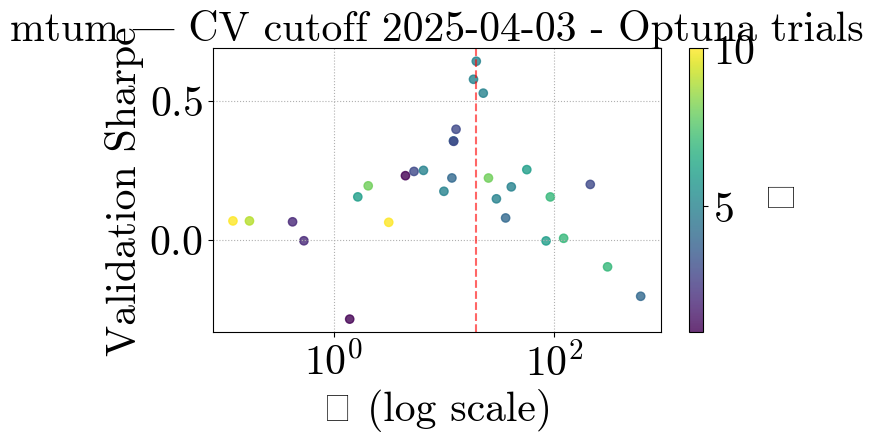

[I 2025-04-22 02:11:37,407] A new study created in memory with name: no-name-6701eb4b-2e2e-4455-a674-77aff835a712
[I 2025-04-22 02:11:43,415] Trial 0 finished with value: 0.9642217536247822 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.9642217536247822.
[I 2025-04-22 02:11:48,350] Trial 1 finished with value: 0.38934393758568714 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.9642217536247822.
[I 2025-04-22 02:11:54,474] Trial 2 finished with value: 0.8145242311989409 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 0 with value: 0.9642217536247822.
[I 2025-04-22 02:12:03,246] Trial 3 finished with value: 0.6961829092210536 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 0 with value: 0.9642217536247822.
[I 2025-04-22 02:12:08,222] Trial 4 finished with value: 0.8923118749591881 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 0 

Optuna best λ=6.0206, κ=3, Sharpe=1.1698


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


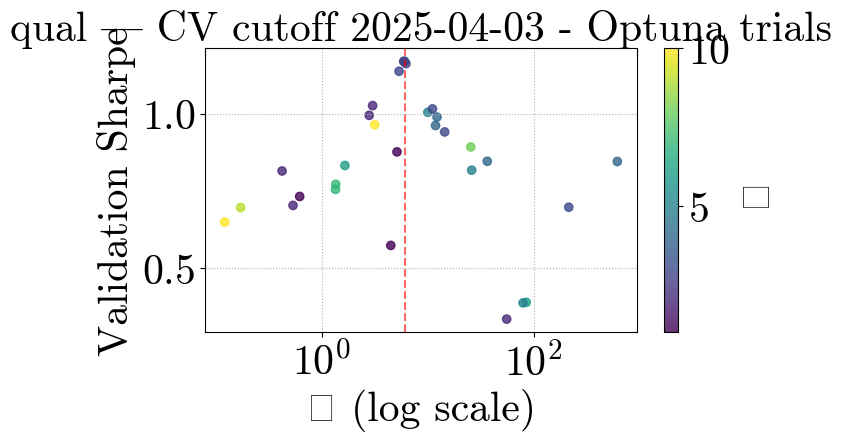

[I 2025-04-22 02:14:42,644] A new study created in memory with name: no-name-af0f7b21-71ad-493e-a0eb-47a5208fd23e
[I 2025-04-22 02:14:55,298] Trial 0 finished with value: 0.3211014075054472 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: 0.3211014075054472.
[I 2025-04-22 02:15:01,249] Trial 1 finished with value: 0.1497170125450559 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: 0.3211014075054472.
[I 2025-04-22 02:15:16,561] Trial 2 finished with value: 0.4680145226709614 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: 0.4680145226709614.
[I 2025-04-22 02:15:27,726] Trial 3 finished with value: -0.13447042770171008 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 2 with value: 0.4680145226709614.
[I 2025-04-22 02:15:33,896] Trial 4 finished with value: 0.13185145378215585 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is trial 

Optuna best λ=2.8937, κ=2, Sharpe=0.6026


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


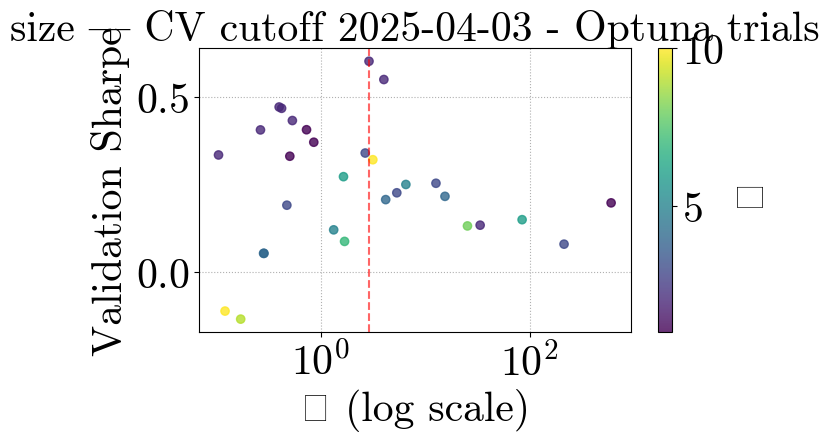

[I 2025-04-22 02:20:01,545] A new study created in memory with name: no-name-cbad7af2-c4dd-4acf-a194-34e57f048a2e
[I 2025-04-22 02:20:16,495] Trial 0 finished with value: -0.7438031114835472 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.7438031114835472.
[I 2025-04-22 02:20:19,932] Trial 1 finished with value: 0.2566417154662473 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 1 with value: 0.2566417154662473.
[I 2025-04-22 02:20:35,107] Trial 2 finished with value: -0.8319289077250757 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 1 with value: 0.2566417154662473.
[I 2025-04-22 02:20:45,960] Trial 3 finished with value: -1.0118589998081766 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 1 with value: 0.2566417154662473.
[I 2025-04-22 02:20:52,205] Trial 4 finished with value: 0.05508739242396782 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best is tria

Optuna best λ=140.8474, κ=10, Sharpe=0.7806


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


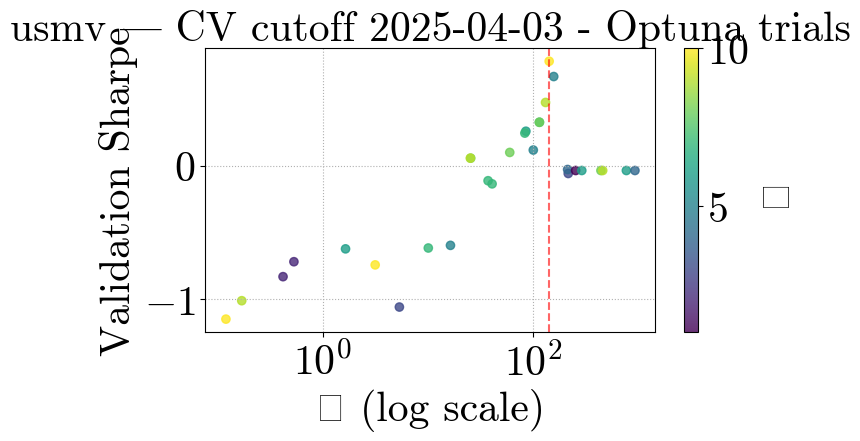

[I 2025-04-22 02:23:17,275] A new study created in memory with name: no-name-c4c8c255-400d-4e0c-87ac-72d0653697bb
[I 2025-04-22 02:23:25,292] Trial 0 finished with value: -0.34871642467708347 and parameters: {'lambda': 3.14891164795686, 'kappa': 10}. Best is trial 0 with value: -0.34871642467708347.
[I 2025-04-22 02:23:30,100] Trial 1 finished with value: -0.8610360045722 and parameters: {'lambda': 84.71801418819966, 'kappa': 6}. Best is trial 0 with value: -0.34871642467708347.
[I 2025-04-22 02:23:45,296] Trial 2 finished with value: -0.23396106534177932 and parameters: {'lambda': 0.4207988669606635, 'kappa': 2}. Best is trial 2 with value: -0.23396106534177932.
[I 2025-04-22 02:23:55,361] Trial 3 finished with value: -0.1992772843821416 and parameters: {'lambda': 0.1707396743152812, 'kappa': 9}. Best is trial 3 with value: -0.1992772843821416.
[I 2025-04-22 02:24:02,119] Trial 4 finished with value: -0.12294499892056787 and parameters: {'lambda': 25.37815508265662, 'kappa': 8}. Best 

Optuna best λ=816.5528, κ=4, Sharpe=0.4807


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


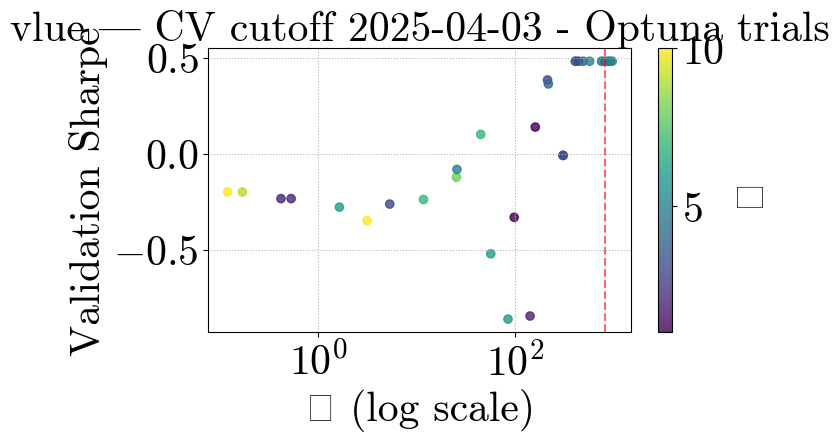

/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83619/1653678183.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


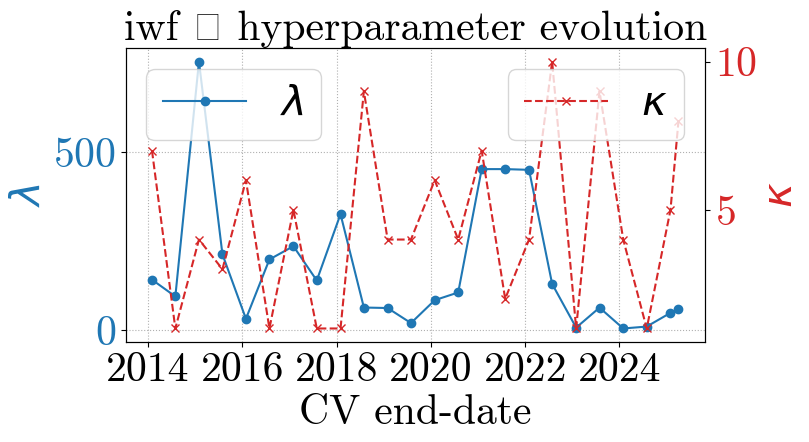

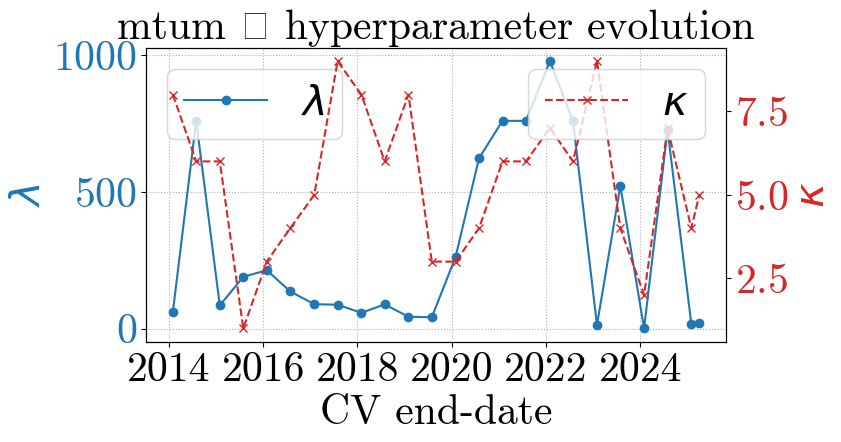

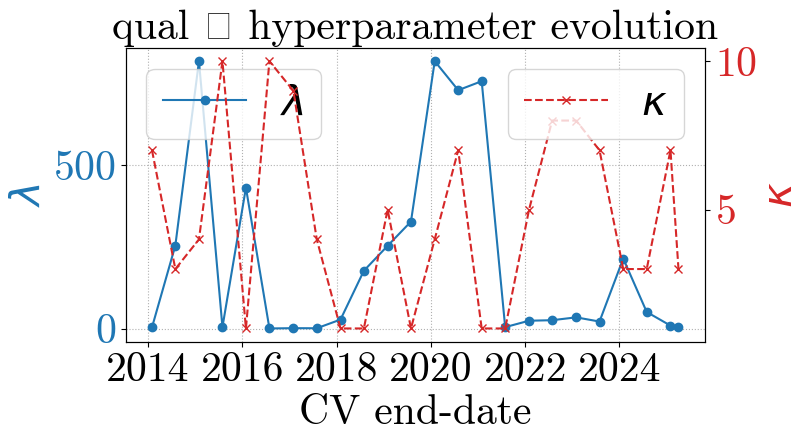

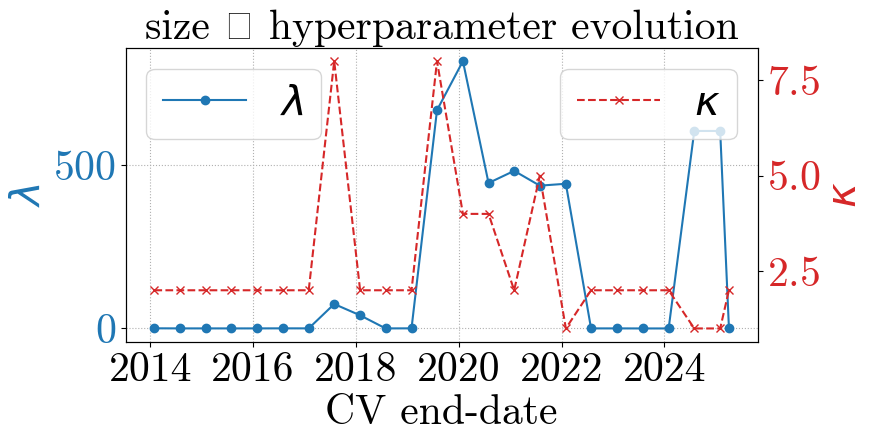

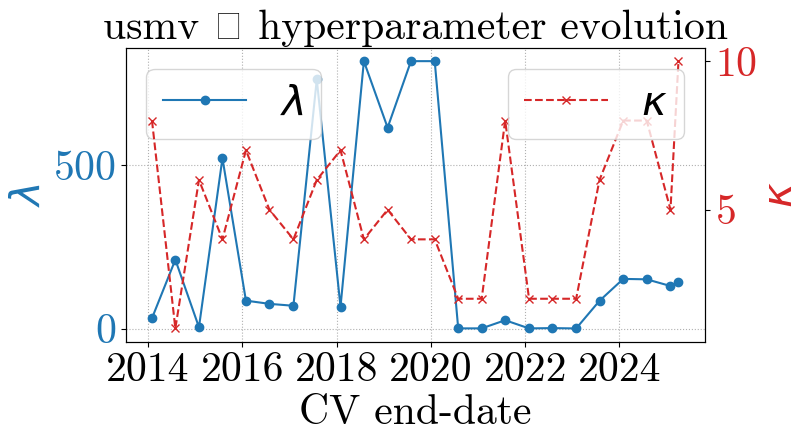

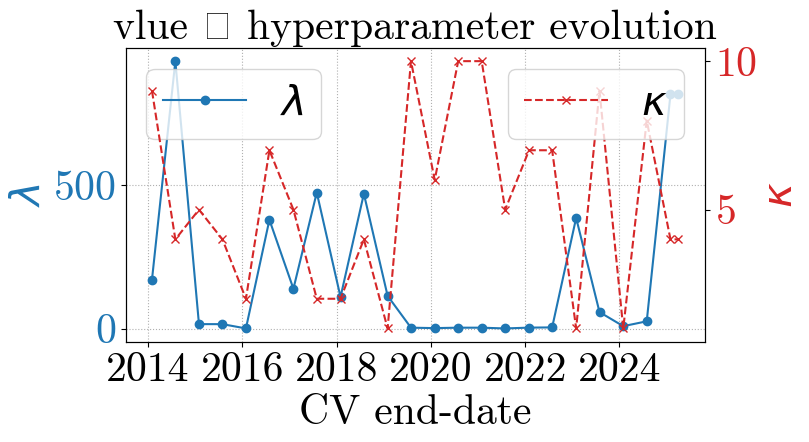

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   142.377849           7
6  2014-07-31    iwf    95.201458           1
12 2015-01-30    iwf   755.350365           4
18 2015-07-31    iwf   213.683291           3
24 2016-01-29    iwf    32.401997           6


In [ ]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

lambda_values = np.linspace(30, 400, 5)
# kappa grid can depend on feature count; a simple fixed grid is fine
kappa_values  = np.array([2.0, 3.0, 4.0])

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [6]:
# 1) Cast kappa to float
cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# 2) (Optional) verify
print(cv_table.dtypes)

# 3) Save out
cv_table.to_parquet("cv_params_bayes_float_kappa.parquet", index=False)


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object
